##  Synthetic Data Generation
THe purpose of this script is to generate synthetic data for our hackathon use case.
The script generates a CSV file where each column represents a different feature of the data.
The features are samples from distributions of know data data/full_cost_df.csv, in particular the following relationships are modeled per station/Line associations:

In [25]:
import pandas as pd
from IPython.display import display

# load real data 
file_path = './data/full_cost_df.csv'
full_cost_df = pd.read_csv(file_path)
#display(full_cost_df)

In [16]:
# List unique lines
unique_lines = full_cost_df['Line'].unique()
print("Number of unique lines:", len(unique_lines))
print("Unique Lines:", unique_lines, "\n")

# List unique stations
unique_stations = full_cost_df['Station'].dropna().unique()
print("Number of unique stations:", len(unique_stations))   
print("Unique Stations:", unique_stations)

Number of unique lines: 13
Unique Lines: ['14' '6A' '1' '65' '2A' '4' '67' '2B' '93' '5' '61' '78A' '78B'] 

Number of unique stations: 100
Unique Stations: ['OW' 'CB' 'WW' 'OD' 'CM' 'SH' 'CR' 'AM' 'YP' 'LB' 'LP' 'ME' 'NV' 'EP'
 'MF' 'ZP' 'CY' 'KG' 'ST' 'MN' 'DR' 'CC' 'BU' 'AP' 'XP' 'DL' 'JL' 'LK'
 'PR' 'CK' 'DD' 'NC' 'VP' 'QU' 'RI' 'SW' 'HR' 'WA' 'KB' 'WC' 'PL' 'EG'
 'LD' 'DN' 'WL' 'MI' 'BB' 'HT' 'BL' 'PT' 'GF' 'CS' 'FW' 'SP' 'VG' 'RT'
 'WX' 'TI' 'DNS' 'RQ' 'PLN' 'PV' 'LO' 'KD' 'SLS' 'MNN' 'NB' 'RA' 'MQ' 'MA'
 'BPS' 'LDN' 'MFS' 'OPS' 'DPS' 'SN' 'IN' 'IR' 'OWN' 'GC' 'IO' 'BC' 'LE'
 'MD' 'OV' 'SC' 'SK' 'HW' 'FN' 'NL' 'GT' 'MK' 'GW' 'LL' 'CV' 'SL' 'DS'
 'IL' 'GO' 'WB']


In [17]:
# Group by Line and Station, then calculate the count of unique values for each column
unique_counts = full_cost_df.groupby(['Line', 'Station']).agg({
    'publishedFlowRatem3hr': pd.Series.nunique,
    'PowerConsumptionkW': pd.Series.nunique,
    'DRACostCADPerday': pd.Series.nunique
}).reset_index()

# Rename columns for clarity
unique_counts.rename(columns={
    'publishedFlowRatem3hr': 'UniqueFlowRateCount',
    'PowerConsumptionkW': 'UniquePowerConsumptionCount',
    'DRACostCADPerday': 'UniqueDRACostCount'
}, inplace=True)

# Display the result
display(unique_counts)

,Line,Station,UniqueFlowRateCount,UniquePowerConsumptionCount,UniqueDRACostCount
0,1,AP,5,5,1
1,1,BB,5,5,1
2,1,BU,5,5,1
3,1,CC,5,5,1
4,1,CM,5,5,1
...,...,...,...,...,...
211,93,TI,13,13,1
212,93,VG,13,13,1
213,93,WX,13,13,5
214,93,YP,13,13,1


In [18]:
# filter out combinations when the count is < 5
unique_counts = unique_counts[
    (unique_counts['UniqueFlowRateCount'] >= 5) &
    (unique_counts['UniquePowerConsumptionCount'] >= 5)
]
# Display the filtered result   
display(unique_counts)

,Line,Station,UniqueFlowRateCount,UniquePowerConsumptionCount,UniqueDRACostCount
0,1,AP,5,5,1
1,1,BB,5,5,1
2,1,BU,5,5,1
3,1,CC,5,5,1
4,1,CM,5,5,1
...,...,...,...,...,...
211,93,TI,13,13,1
212,93,VG,13,13,1
213,93,WX,13,13,5
214,93,YP,13,13,1


In [19]:
# extract unique combinations of Line and Station from unique_counts, add those from full_cost_df where Line = 1
unique_combinations = unique_counts[['Line', 'Station']].drop_duplicates()
unique_combinations = pd.concat([unique_combinations, full_cost_df[full_cost_df['Line'] == '1'][['Line', 'Station']].drop_duplicates()], ignore_index=True)
# Remove duplicates
unique_combinations = unique_combinations.drop_duplicates() 

In [20]:
# Step1: extract the hierachy of associations between Line and Station (real_world example)
line_station_hierarchy = unique_combinations.groupby('Line')['Station'].unique().reset_index()
line_station_hierarchy.rename(columns={'Station': 'AssociatedStations'}, inplace=True)
line_station_hierarchy

,Line,AssociatedStations
0,1,"[AP, BB, BU, CC, CM, CR, DR, EP, GF, GW, JL, K..."
1,14,"[AM, BL, CB, DS, EG, MN, OW, PR, RI, SH, VP, WW]"
2,2A,"[AP, BU, CC, CK, EP, HR, KB, KG, LB, ME, MI, O..."
3,2B,"[CM, CR, DN, DR, FW, GF, LP, NC, PL, SP, VG, XP]"
4,4,"[AP, BU, CC, CK, CM, CR, CS, DN, DR, EP, FW, G..."
5,5,"[BC, GC, GO, IN, IO, IR, LE, MA, MQ, NB, PR, R..."
6,61,"[AM, BPS, DL, DPS, HT, LDN, MFS, MNN, OPS, OWN..."
7,67,"[AP, BU, CC, CK, CM, CR, CS, DNS, DR, EP, FW, ..."
8,6A,"[AM, CB, CV, CY, DD, DL, EG, HT, LD, LK, LL, M..."
9,78A,"[FN, GT, MD, NL]"


### Next Steps to Model Relationships

1. **Understand the Data**:
    - Review the existing data structures, including `unique_counts`, and `line_station_hierarchy`, to ensure all necessary information is available for modeling relationships. If there're not sufficient samples to model then drop the station/line.
    - Identify key variables such as `publishedFlowRatem3hr`, `PowerConsumptionkW`, and `DRACostCADPerday` that are central to the relationships being modeled.

2. **Define Relationships**:
    - Determine the type of relationships to model (e.g., linear, polynomial)
    - Focus on relationships between flow rate, power consumption, and DRA cost for each line and station.

3. **Data Preparation**:
    - Filter and clean the data to remove outliers or missing values that may affect the modeling process.

4. **Model Selection**:
    - Choose appropriate models for the relationships. For example:
      - Linear Regression
      - Polynomial regression for non-linear relationships.
    - Use existing coefficients (`PolyCoeffPowerConsumption`, `PolyCoeffDRACost`) as starting points for further refinement.

5. **Validation**:
    - Use metrics such as R², Mean Squared Error (MSE), or Mean Absolute Error (MAE) to evaluate model performance.

6. **Visualization**:
    - Create scatter plots and overlay the fitted models to visualize the relationships.

7. **Iterative Refinement**:
    - Analyze the results and refine the models as needed.
    - Experiment with different model types or parameters to improve accuracy.

8. **Integration**:
    - Integrate the final models into the existing pipeline for further analysis or predictions.
    - Document the models and their parameters for reproducibility.

9. **Next Steps**:
    - Extend the analysis to other lines or stations.
    - Explore additional variables or features that may influence the relationships.
    - Use the models for predictive analytics or optimization tasks.

Line 14, OW  - Flow Rate Range: 1360 to 2730
Line 14, OW  - Power Consumption Range: 761.4399176537991 to 3232.280156598892
Line 14, OW  - DRA Cost Range: 0.0 to 1486.6704
Line 14, OW - Polynomial Coefficients for PowerConsumptionkW: [ 1.86483662e+00 -2.10772354e+03]
Line 14, OW - R^2 for PowerConsumptionkW: 0.9483
Line 14, OW - Polynomial Coefficients for DRA Cost: [ 1.35228860e+00 -2.22558401e+03]
Line 14, OW - R^2 for DRA Cost: 0.8681


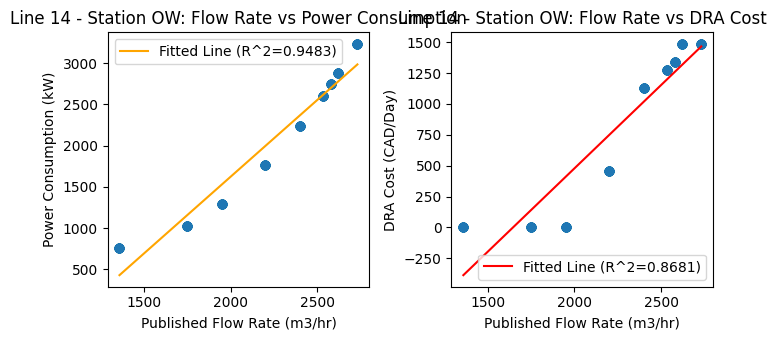

--------------------------------------------------
Line 14, SH  - Flow Rate Range: 1360 to 2730
Line 14, SH  - Power Consumption Range: 89.66920180618763 to 2570.2155354761053
Line 14, SH  - DRA Cost Range: 0.0 to 1140.5304
Line 14, SH - Polynomial Coefficients for PowerConsumptionkW: [ 1.77042069e+00 -2.09976260e+03]
Line 14, SH - R^2 for PowerConsumptionkW: 0.9746
Line 14, SH - Polynomial Coefficients for DRA Cost: [ 1.05767922e+00 -1.73882066e+03]
Line 14, SH - R^2 for DRA Cost: 0.8682


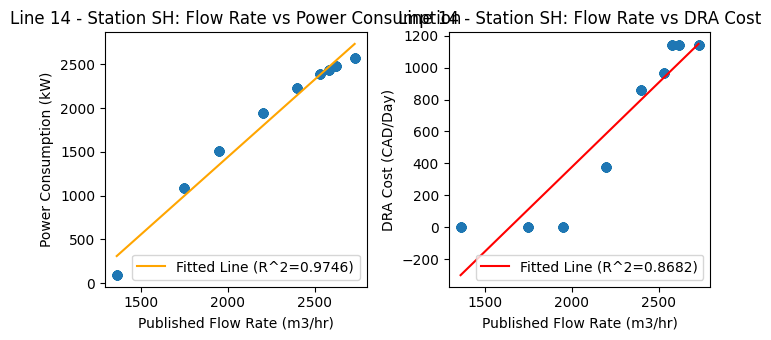

--------------------------------------------------
Line 14, CB  - Flow Rate Range: 1360 to 2730
Line 14, CB  - Power Consumption Range: 910.9898325204848 to 3527.9554329309613
Line 14, CB  - DRA Cost Range: 0.0 to 2352.0216
Line 14, CB - Polynomial Coefficients for PowerConsumptionkW: [ 1.98221392e+00 -2.17601582e+03]
Line 14, CB - R^2 for PowerConsumptionkW: 0.9375
Line 14, CB - Polynomial Coefficients for DRA Cost: [ 1.98812769e+00 -2.98251283e+03]
Line 14, CB - R^2 for DRA Cost: 0.9491


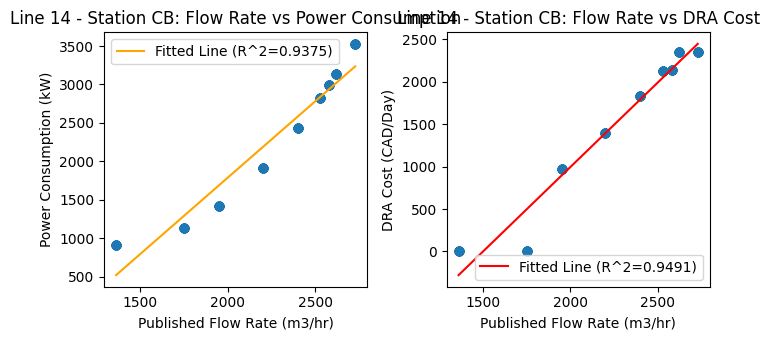

--------------------------------------------------
Line 14, WW  - Flow Rate Range: 1360 to 2730
Line 14, WW  - Power Consumption Range: 605.865958559663 to 3443.736592268155
Line 14, WW  - DRA Cost Range: 0.0 to 2178.9504
Line 14, WW - Polynomial Coefficients for PowerConsumptionkW: [ 2.07815509e+00 -2.55000559e+03]
Line 14, WW - R^2 for PowerConsumptionkW: 0.9510
Line 14, WW - Polynomial Coefficients for DRA Cost: [ 1.87525547e+00 -2.82838232e+03]
Line 14, WW - R^2 for DRA Cost: 0.9489


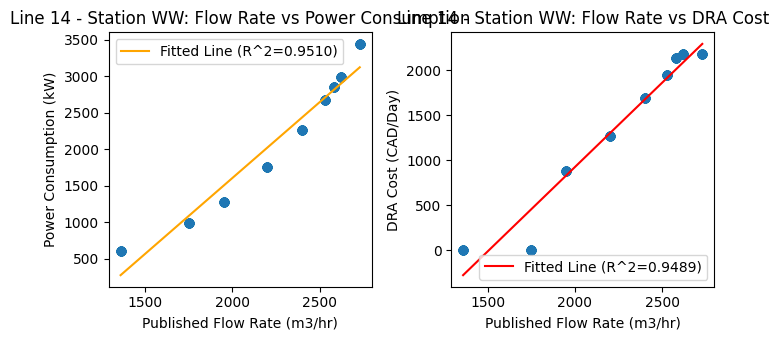

--------------------------------------------------
Line 14, MN  - Flow Rate Range: 1360 to 2730
Line 14, MN  - Power Consumption Range: 685.8778370507061 to 2538.734239650716
Line 14, MN  - DRA Cost Range: 0.0 to 1509.7464
Line 14, MN - Polynomial Coefficients for PowerConsumptionkW: [    1.3446024  -1100.15564613]
Line 14, MN - R^2 for PowerConsumptionkW: 0.9983
Line 14, MN - Polynomial Coefficients for DRA Cost: [ 1.33505687e+00 -2.03982393e+03]
Line 14, MN - R^2 for DRA Cost: 0.9464


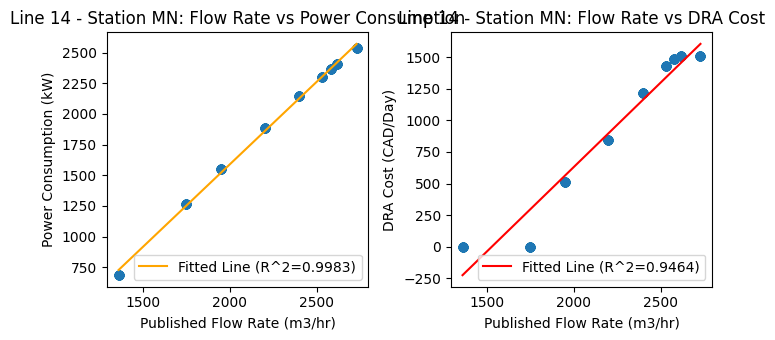

--------------------------------------------------
Line 14, AM  - Flow Rate Range: 1360 to 2730
Line 14, AM  - Power Consumption Range: 548.6479116678238 to 3449.2434461209923
Line 14, AM  - DRA Cost Range: 0.0 to 2144.3376
Line 14, AM - Polynomial Coefficients for PowerConsumptionkW: [ 2.16808300e+00 -2.67620351e+03]
Line 14, AM - R^2 for PowerConsumptionkW: 0.9730
Line 14, AM - Polynomial Coefficients for DRA Cost: [ 1.84000879e+00 -2.78804615e+03]
Line 14, AM - R^2 for DRA Cost: 0.9514


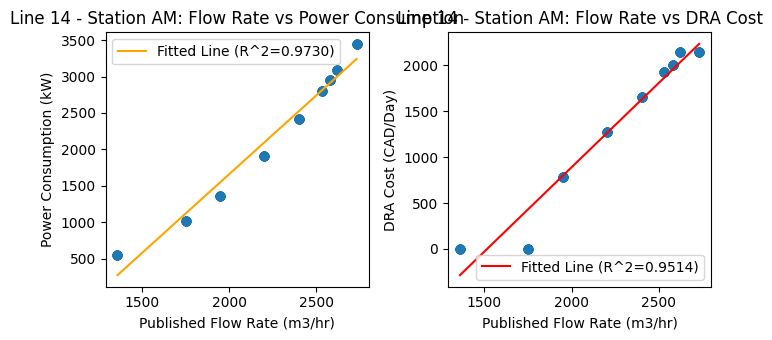

--------------------------------------------------
Line 14, VP  - Flow Rate Range: 1360 to 2730
Line 14, VP  - Power Consumption Range: 45.71673627197743 to 2571.092628485756
Line 14, VP  - DRA Cost Range: 0.0 to 1844.3496
Line 14, VP - Polynomial Coefficients for PowerConsumptionkW: [ 1.80058931e+00 -2.17087339e+03]
Line 14, VP - R^2 for PowerConsumptionkW: 0.9723
Line 14, VP - Polynomial Coefficients for DRA Cost: [ 1.60800787e+00 -2.43579867e+03]
Line 14, VP - R^2 for DRA Cost: 0.9462


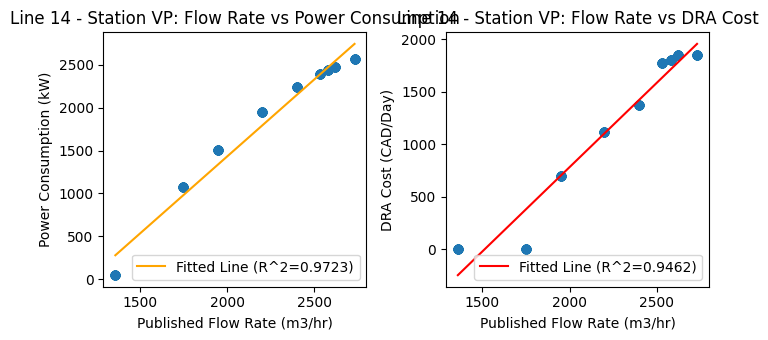

--------------------------------------------------
Line 14, EG  - Flow Rate Range: 1360 to 2730
Line 14, EG  - Power Consumption Range: 843.3276802652393 to 3375.756495751987
Line 14, EG  - DRA Cost Range: 0.0 to 1509.7464
Line 14, EG - Polynomial Coefficients for PowerConsumptionkW: [ 1.86240718e+00 -1.93337201e+03]
Line 14, EG - R^2 for PowerConsumptionkW: 0.9674
Line 14, EG - Polynomial Coefficients for DRA Cost: [ 1.37947007e+00 -2.22833957e+03]
Line 14, EG - R^2 for DRA Cost: 0.8892


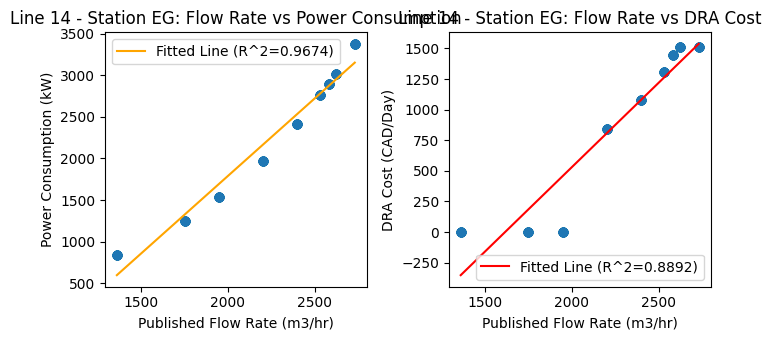

--------------------------------------------------
Line 14, PR  - Flow Rate Range: 1360 to 2730
Line 14, PR  - Power Consumption Range: 2049.779344166979 to 6719.190729863877
Line 14, PR  - DRA Cost Range: 0.0 to 0.0
Line 14, PR - Polynomial Coefficients for PowerConsumptionkW: [    3.43862739 -3019.24974126]
Line 14, PR - R^2 for PowerConsumptionkW: 0.9755
Line 14, PR - Not enough unique values in DRA Cost for polynomial fitting.


C:\Users\crgalleg\AppData\Local\Temp\ipykernel_27368\2723486034.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


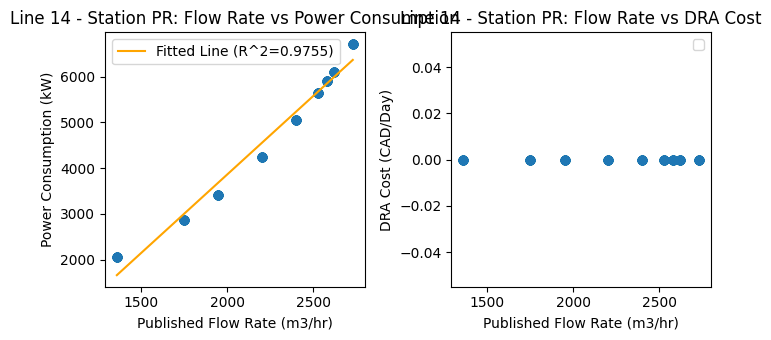

--------------------------------------------------
Line 14, RI  - Flow Rate Range: 1360 to 2730
Line 14, RI  - Power Consumption Range: 99.8872679322958 to 2462.7675086238887
Line 14, RI  - DRA Cost Range: 0.0 to 1809.7344
Line 14, RI - Polynomial Coefficients for PowerConsumptionkW: [ 1.67622118e+00 -1.91628535e+03]
Line 14, RI - R^2 for PowerConsumptionkW: 0.9595
Line 14, RI - Polynomial Coefficients for DRA Cost: [ 1.55975942e+00 -2.35992298e+03]
Line 14, RI - R^2 for DRA Cost: 0.9460


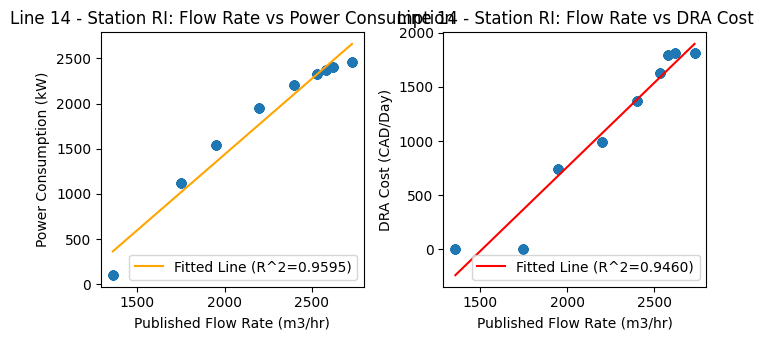

--------------------------------------------------
Line 14, BL  - Flow Rate Range: 1360 to 2730
Line 14, BL  - Power Consumption Range: 145.24469010531902 to 2881.81038798648
Line 14, BL  - DRA Cost Range: 0.0 to 2675.0856
Line 14, BL - Polynomial Coefficients for PowerConsumptionkW: [ 2.03430386e+00 -2.82135472e+03]
Line 14, BL - R^2 for PowerConsumptionkW: 0.9837
Line 14, BL - Polynomial Coefficients for DRA Cost: [ 2.31783995e+00 -3.46397198e+03]
Line 14, BL - R^2 for DRA Cost: 0.9456


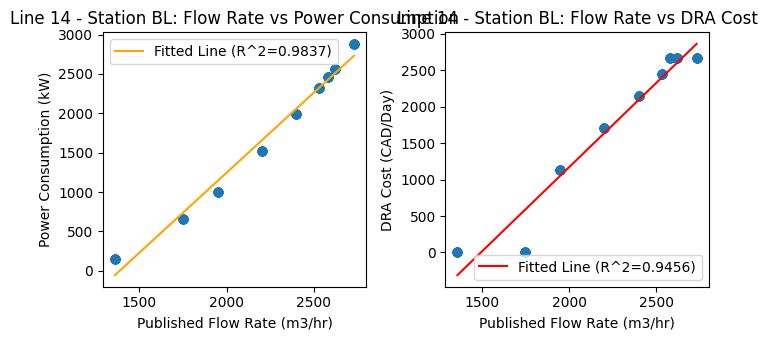

--------------------------------------------------
Line 14, DS  - Flow Rate Range: 1360 to 2730
Line 14, DS  - Power Consumption Range: 647.0410242825747 to 3635.091091559501
Line 14, DS  - DRA Cost Range: 0.0 to 1440.5184
Line 14, DS - Polynomial Coefficients for PowerConsumptionkW: [ 2.22442094e+00 -2.61370559e+03]
Line 14, DS - R^2 for PowerConsumptionkW: 0.9812
Line 14, DS - Polynomial Coefficients for DRA Cost: [ 1.3233811e+00 -2.1741645e+03]
Line 14, DS - R^2 for DRA Cost: 0.8678


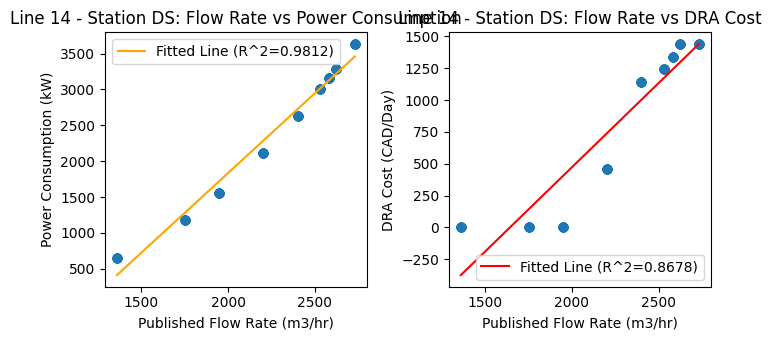

--------------------------------------------------
Line 6A, CB  - Flow Rate Range: 3000 to 4550
Line 6A, CB  - Power Consumption Range: 1730.9901574328542 to 4735.006684884895
Line 6A, CB  - DRA Cost Range: 0.0 to 0.0
Line 6A, CB - Polynomial Coefficients for PowerConsumptionkW: [ 1.92557864e+00 -4.30543132e+03]
Line 6A, CB - R^2 for PowerConsumptionkW: 0.9702
Line 6A, CB - Not enough unique values in DRA Cost for polynomial fitting.


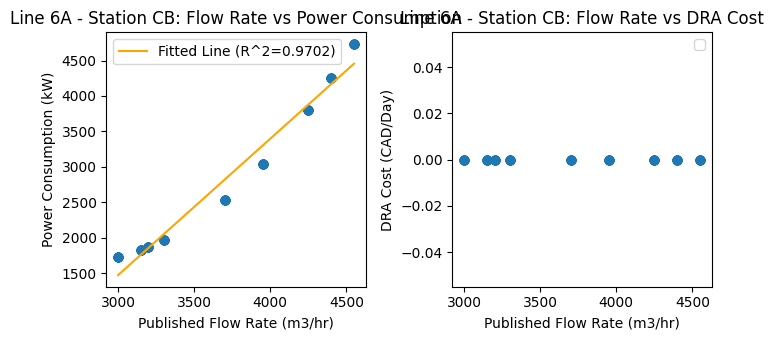

--------------------------------------------------
Line 6A, WW  - Flow Rate Range: 3000 to 4550
Line 6A, WW  - Power Consumption Range: 1817.861840554513 to 4537.645055815636
Line 6A, WW  - DRA Cost Range: 0.0 to 5642.3088
Line 6A, WW - Polynomial Coefficients for PowerConsumptionkW: [ 1.75176746e+00 -3.49835658e+03]
Line 6A, WW - R^2 for PowerConsumptionkW: 0.9980
Line 6A, WW - Polynomial Coefficients for DRA Cost: [ 2.96088140e+00 -9.75290709e+03]
Line 6A, WW - R^2 for DRA Cost: 0.7066


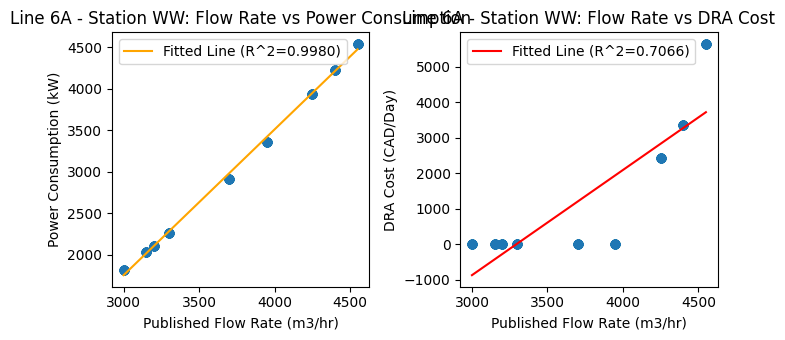

--------------------------------------------------
Line 6A, SH  - Flow Rate Range: 3000 to 4550
Line 6A, SH  - Power Consumption Range: 1809.6679689772427 to 4968.12726624799
Line 6A, SH  - DRA Cost Range: 0.0 to 5852.2176
Line 6A, SH - Polynomial Coefficients for PowerConsumptionkW: [ 2.03237186e+00 -4.39849529e+03]
Line 6A, SH - R^2 for PowerConsumptionkW: 0.9950
Line 6A, SH - Polynomial Coefficients for DRA Cost: [ 2.66779573e+00 -8.80813469e+03]
Line 6A, SH - R^2 for DRA Cost: 0.6186


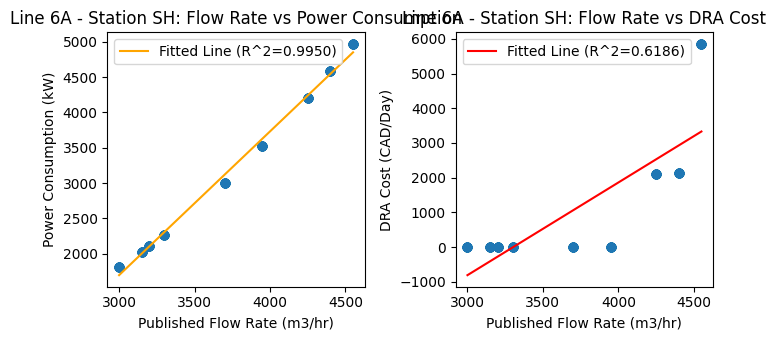

--------------------------------------------------
Line 6A, AM  - Flow Rate Range: 3000 to 4550
Line 6A, AM  - Power Consumption Range: 1461.214526452124 to 3953.994823573623
Line 6A, AM  - DRA Cost Range: 0.0 to 7718.9928
Line 6A, AM - Polynomial Coefficients for PowerConsumptionkW: [ 1.61514611e+00 -3.24082194e+03]
Line 6A, AM - R^2 for PowerConsumptionkW: 0.9869
Line 6A, AM - Polynomial Coefficients for DRA Cost: [ 3.52683541e+00 -1.17127342e+04]
Line 6A, AM - R^2 for DRA Cost: 0.5175


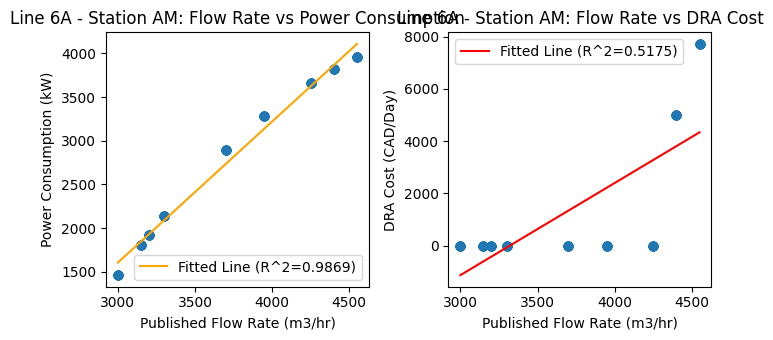

--------------------------------------------------
Line 6A, NV  - Flow Rate Range: 3000 to 4550
Line 6A, NV  - Power Consumption Range: 1517.476105362177 to 2492.8809328917414
Line 6A, NV  - DRA Cost Range: 0.0 to 0.0
Line 6A, NV - Polynomial Coefficients for PowerConsumptionkW: [   0.6318115 -325.6315379]
Line 6A, NV - R^2 for PowerConsumptionkW: 0.9885
Line 6A, NV - Not enough unique values in DRA Cost for polynomial fitting.


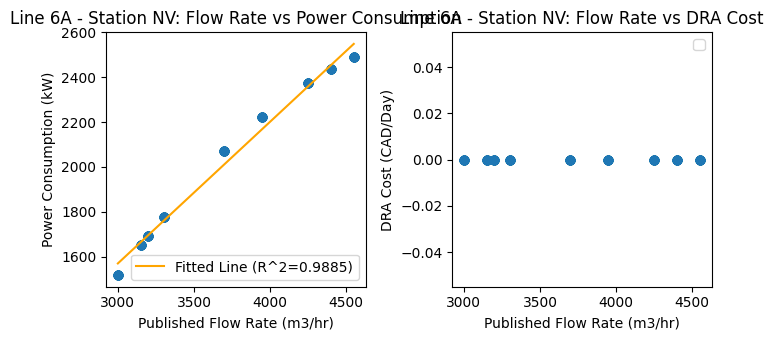

--------------------------------------------------
Line 6A, MF  - Flow Rate Range: 3000 to 4550
Line 6A, MF  - Power Consumption Range: 1241.5358001583295 to 2531.3781130990387
Line 6A, MF  - DRA Cost Range: 0.0 to 0.0
Line 6A, MF - Polynomial Coefficients for PowerConsumptionkW: [ 8.25068029e-01 -1.28316461e+03]
Line 6A, MF - R^2 for PowerConsumptionkW: 0.9930
Line 6A, MF - Not enough unique values in DRA Cost for polynomial fitting.


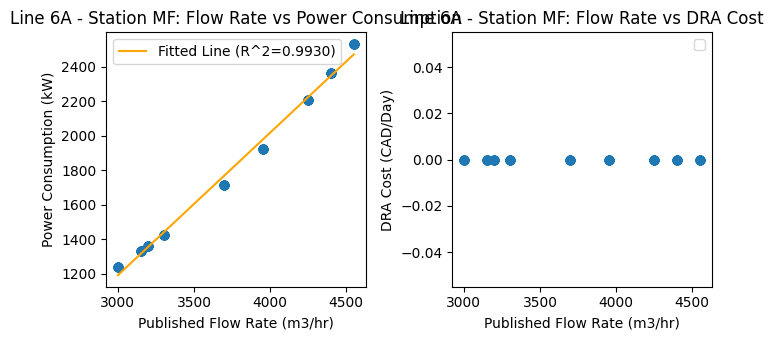

--------------------------------------------------
Line 6A, CY  - Flow Rate Range: 3000 to 4550
Line 6A, CY  - Power Consumption Range: 1297.820336714387 to 2415.896006643772
Line 6A, CY  - DRA Cost Range: 0.0 to 0.0
Line 6A, CY - Polynomial Coefficients for PowerConsumptionkW: [   0.72168152 -709.59204966]
Line 6A, CY - R^2 for PowerConsumptionkW: 0.9254
Line 6A, CY - Not enough unique values in DRA Cost for polynomial fitting.


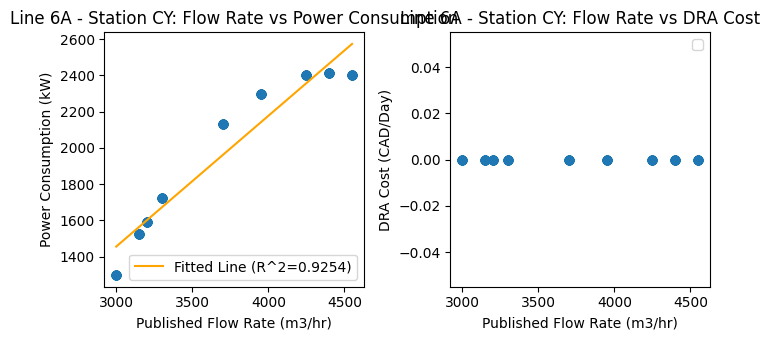

--------------------------------------------------
Line 6A, DL  - Flow Rate Range: 3000 to 4550
Line 6A, DL  - Power Consumption Range: 1816.4806906273589 to 2838.991065452283
Line 6A, DL  - DRA Cost Range: 0.0 to 7718.9928
Line 6A, DL - Polynomial Coefficients for PowerConsumptionkW: [   0.65886111 -177.20518263]
Line 6A, DL - R^2 for PowerConsumptionkW: 0.9989
Line 6A, DL - Polynomial Coefficients for DRA Cost: [ 4.29380706e+00 -1.41185267e+04]
Line 6A, DL - R^2 for DRA Cost: 0.7337


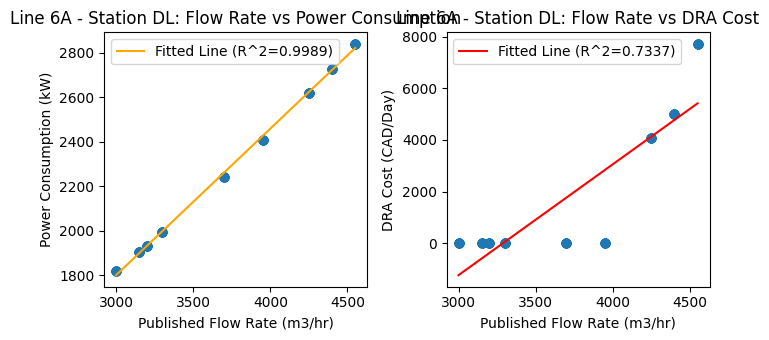

--------------------------------------------------
Line 6A, LK  - Flow Rate Range: 3000 to 4550
Line 6A, LK  - Power Consumption Range: 1177.6148514945662 to 4437.9323746096925
Line 6A, LK  - DRA Cost Range: 0.0 to 0.0
Line 6A, LK - Polynomial Coefficients for PowerConsumptionkW: [ 2.05324903e+00 -5.19710476e+03]
Line 6A, LK - R^2 for PowerConsumptionkW: 0.9761
Line 6A, LK - Not enough unique values in DRA Cost for polynomial fitting.


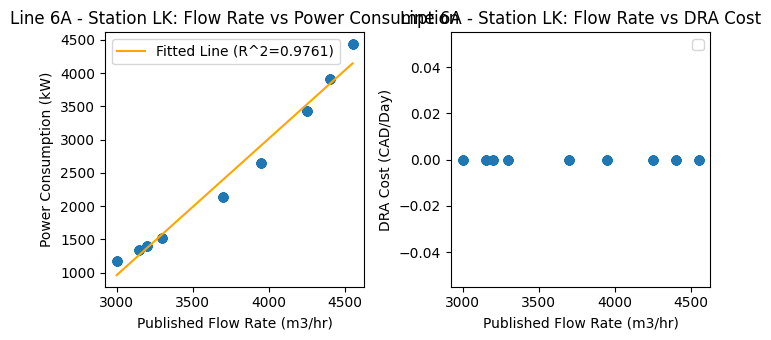

--------------------------------------------------
Line 6A, PR  - Flow Rate Range: 3000 to 4550
Line 6A, PR  - Power Consumption Range: 3425.76221947372 to 5346.66041080188
Line 6A, PR  - DRA Cost Range: 0.0 to 0.0
Line 6A, PR - Polynomial Coefficients for PowerConsumptionkW: [   1.24187158 -246.1882503 ]
Line 6A, PR - R^2 for PowerConsumptionkW: 0.9969
Line 6A, PR - Not enough unique values in DRA Cost for polynomial fitting.


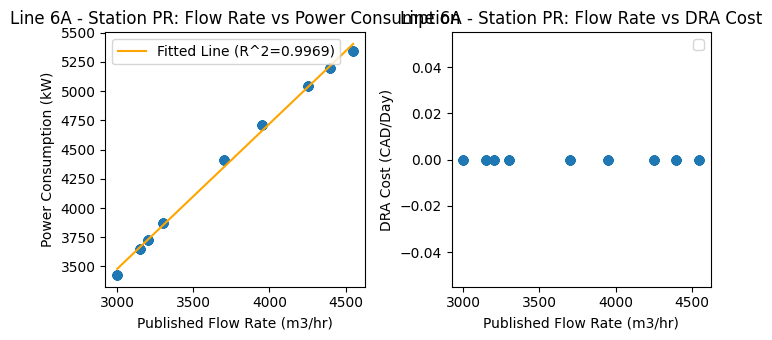

--------------------------------------------------
Line 6A, DD  - Flow Rate Range: 3000 to 4550
Line 6A, DD  - Power Consumption Range: 1690.4914280846715 to 4484.55111008184
Line 6A, DD  - DRA Cost Range: 0.0 to 6062.124
Line 6A, DD - Polynomial Coefficients for PowerConsumptionkW: [ 1.79857086e+00 -3.78934706e+03]
Line 6A, DD - R^2 for PowerConsumptionkW: 0.9963
Line 6A, DD - Polynomial Coefficients for DRA Cost: [ 4.03629378e+00 -1.32190901e+04]
Line 6A, DD - R^2 for DRA Cost: 0.7604


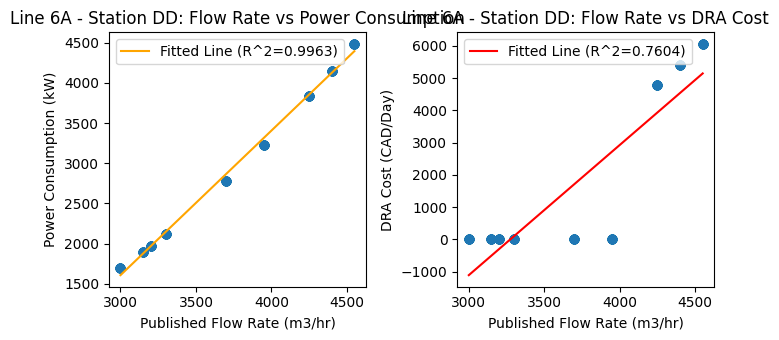

--------------------------------------------------
Line 6A, RI  - Flow Rate Range: 3000 to 4550
Line 6A, RI  - Power Consumption Range: 1640.1714966595173 to 4312.616435946897
Line 6A, RI  - DRA Cost Range: 0.0 to 5852.2176
Line 6A, RI - Polynomial Coefficients for PowerConsumptionkW: [ 1.71734975e+00 -3.65335784e+03]
Line 6A, RI - R^2 for PowerConsumptionkW: 0.9887
Line 6A, RI - Polynomial Coefficients for DRA Cost: [ 2.75480623e+00 -9.14444603e+03]
Line 6A, RI - R^2 for DRA Cost: 0.5232


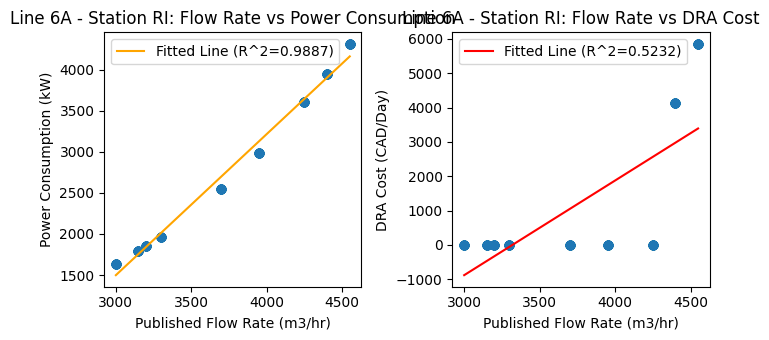

--------------------------------------------------
Line 6A, MN  - Flow Rate Range: 3000 to 4550
Line 6A, MN  - Power Consumption Range: 1961.670421794057 to 4771.105521832593
Line 6A, MN  - DRA Cost Range: 0.0 to 6599.4864
Line 6A, MN - Polynomial Coefficients for PowerConsumptionkW: [ 1.81158522e+00 -3.49290064e+03]
Line 6A, MN - R^2 for PowerConsumptionkW: 0.9998
Line 6A, MN - Polynomial Coefficients for DRA Cost: [ 3.59529188e+00 -1.18568377e+04]
Line 6A, MN - R^2 for DRA Cost: 0.6868


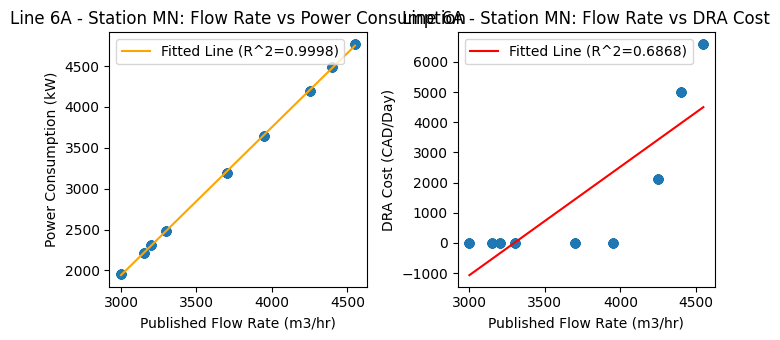

--------------------------------------------------
Line 6A, VP  - Flow Rate Range: 3000 to 4550
Line 6A, VP  - Power Consumption Range: 1255.4393143840134 to 4142.756627015071
Line 6A, VP  - DRA Cost Range: 0.0 to 5852.2176
Line 6A, VP - Polynomial Coefficients for PowerConsumptionkW: [ 1.87000368e+00 -4.20457075e+03]
Line 6A, VP - R^2 for PowerConsumptionkW: 0.9893
Line 6A, VP - Polynomial Coefficients for DRA Cost: [ 3.06577378e+00 -1.01604433e+04]
Line 6A, VP - R^2 for DRA Cost: 0.5281


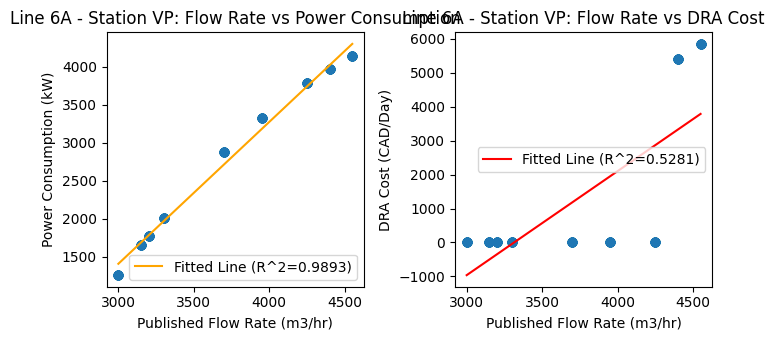

--------------------------------------------------
Line 6A, WA  - Flow Rate Range: 3000 to 4550
Line 6A, WA  - Power Consumption Range: 1001.899286404252 to 2129.4022983619943
Line 6A, WA  - DRA Cost Range: 0.0 to 0.0
Line 6A, WA - Polynomial Coefficients for PowerConsumptionkW: [ 6.92505811e-01 -8.71105242e+02]
Line 6A, WA - R^2 for PowerConsumptionkW: 0.8716
Line 6A, WA - Not enough unique values in DRA Cost for polynomial fitting.


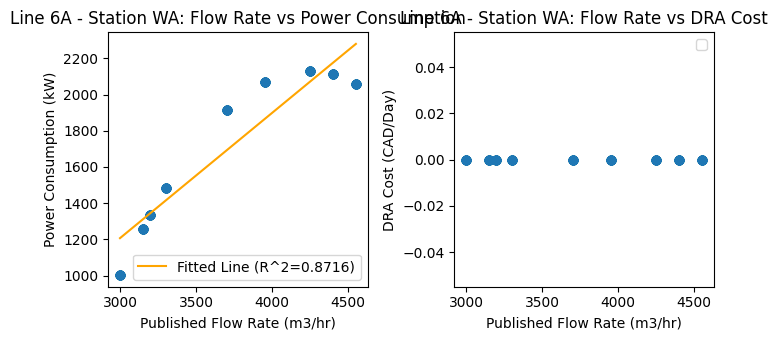

--------------------------------------------------
Line 6A, OW  - Flow Rate Range: 3000 to 4550
Line 6A, OW  - Power Consumption Range: 1338.1693772505969 to 4072.9008000082094
Line 6A, OW  - DRA Cost Range: 0.0 to 5852.2176
Line 6A, OW - Polynomial Coefficients for PowerConsumptionkW: [ 1.76923757e+00 -3.86782824e+03]
Line 6A, OW - R^2 for PowerConsumptionkW: 0.9944
Line 6A, OW - Polynomial Coefficients for DRA Cost: [ 2.26545925e+00 -7.54564515e+03]
Line 6A, OW - R^2 for DRA Cost: 0.4493


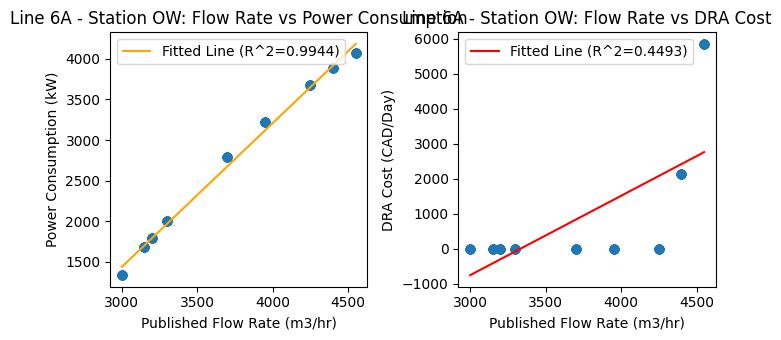

--------------------------------------------------
Line 6A, LD  - Flow Rate Range: 3000 to 4550
Line 6A, LD  - Power Consumption Range: 1226.4666683338585 to 2438.5206599086523
Line 6A, LD  - DRA Cost Range: 0.0 to 0.0
Line 6A, LD - Polynomial Coefficients for PowerConsumptionkW: [ 7.85386479e-01 -9.65049213e+02]
Line 6A, LD - R^2 for PowerConsumptionkW: 0.9309
Line 6A, LD - Not enough unique values in DRA Cost for polynomial fitting.


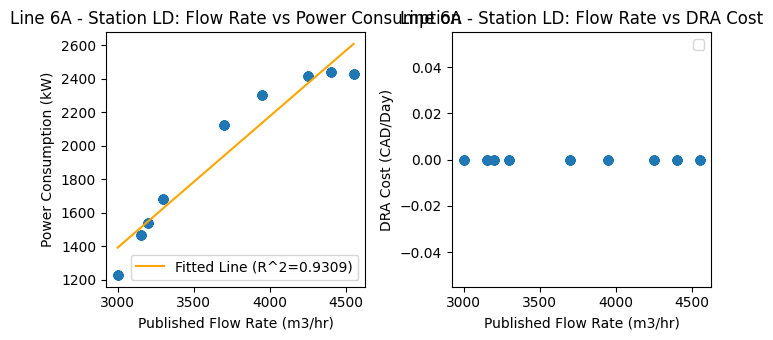

--------------------------------------------------
Line 6A, HT  - Flow Rate Range: 3000 to 4550
Line 6A, HT  - Power Consumption Range: 882.8535318598151 to 2387.251642217394
Line 6A, HT  - DRA Cost Range: 0.0 to 0.0
Line 6A, HT - Polynomial Coefficients for PowerConsumptionkW: [ 9.78286724e-01 -1.89184440e+03]
Line 6A, HT - R^2 for PowerConsumptionkW: 0.9567
Line 6A, HT - Not enough unique values in DRA Cost for polynomial fitting.


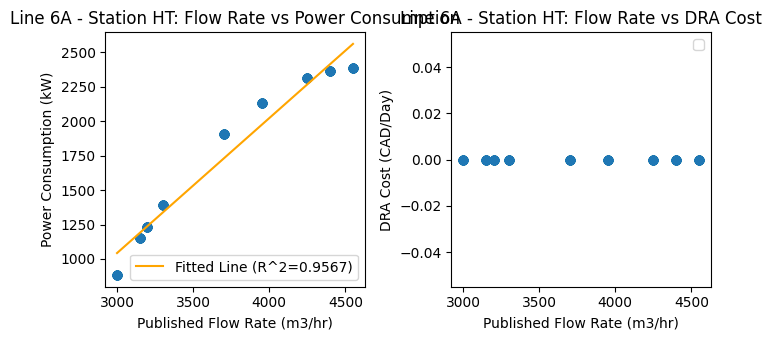

--------------------------------------------------
Line 6A, PT  - Flow Rate Range: 3000 to 4550
Line 6A, PT  - Power Consumption Range: 1337.5169038884342 to 2531.7532912939787
Line 6A, PT  - DRA Cost Range: 0.0 to 0.0
Line 6A, PT - Polynomial Coefficients for PowerConsumptionkW: [ 7.75150057e-01 -8.28391774e+02]
Line 6A, PT - R^2 for PowerConsumptionkW: 0.9332
Line 6A, PT - Not enough unique values in DRA Cost for polynomial fitting.


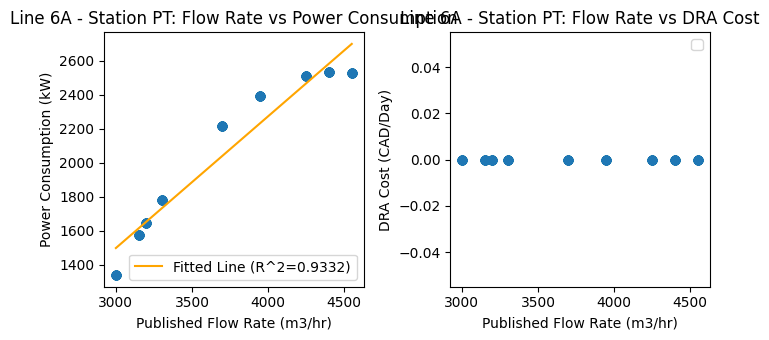

--------------------------------------------------
Line 6A, MK  - Flow Rate Range: 3000 to 4550
Line 6A, MK  - Power Consumption Range: 1326.259877305478 to 3523.171195969684
Line 6A, MK  - DRA Cost Range: 0.0 to 10422.6
Line 6A, MK - Polynomial Coefficients for PowerConsumptionkW: [ 1.41158928e+00 -3.02847139e+03]
Line 6A, MK - R^2 for PowerConsumptionkW: 0.9879
Line 6A, MK - Polynomial Coefficients for DRA Cost: [ 4.34064533e+00 -1.34756300e+04]
Line 6A, MK - R^2 for DRA Cost: 0.4762


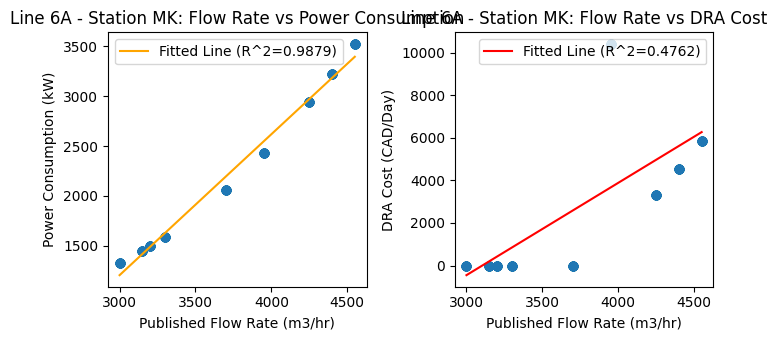

--------------------------------------------------
Line 6A, EG  - Flow Rate Range: 3000 to 4550
Line 6A, EG  - Power Consumption Range: 1442.1529509089887 to 4419.921488817548
Line 6A, EG  - DRA Cost Range: 0.0 to 6968.9256
Line 6A, EG - Polynomial Coefficients for PowerConsumptionkW: [ 1.91359263e+00 -4.45548437e+03]
Line 6A, EG - R^2 for PowerConsumptionkW: 0.9888
Line 6A, EG - Polynomial Coefficients for DRA Cost: [ 3.00084115e+00 -9.92372509e+03]
Line 6A, EG - R^2 for DRA Cost: 0.5732


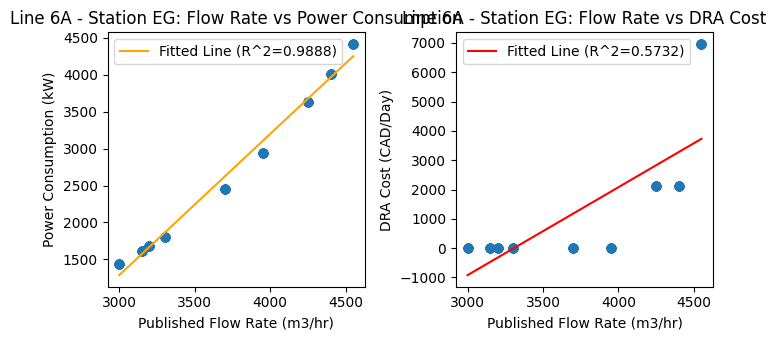

--------------------------------------------------
Line 6A, LL  - Flow Rate Range: 3000 to 4550
Line 6A, LL  - Power Consumption Range: 1440.6601089332253 to 2798.059833977022
Line 6A, LL  - DRA Cost Range: 0.0 to 0.0
Line 6A, LL - Polynomial Coefficients for PowerConsumptionkW: [ 8.71120851e-01 -1.26872765e+03]
Line 6A, LL - R^2 for PowerConsumptionkW: 0.9799
Line 6A, LL - Not enough unique values in DRA Cost for polynomial fitting.


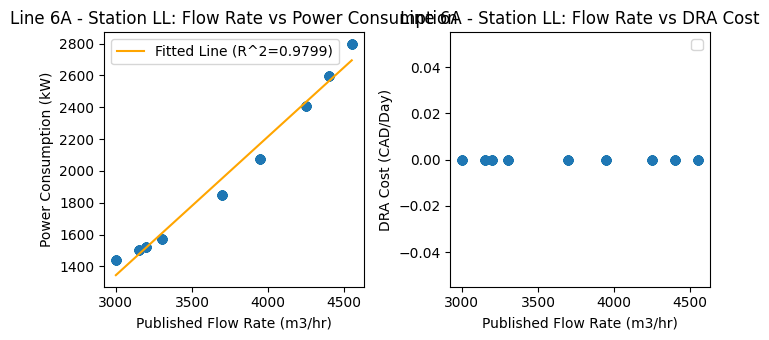

--------------------------------------------------
Line 6A, CV  - Flow Rate Range: 3000 to 4550
Line 6A, CV  - Power Consumption Range: 1569.068730801344 to 3284.089915446937
Line 6A, CV  - DRA Cost Range: 0.0 to 0.0
Line 6A, CV - Polynomial Coefficients for PowerConsumptionkW: [ 9.51577831e-01 -1.44876094e+03]
Line 6A, CV - R^2 for PowerConsumptionkW: 0.7921
Line 6A, CV - Not enough unique values in DRA Cost for polynomial fitting.


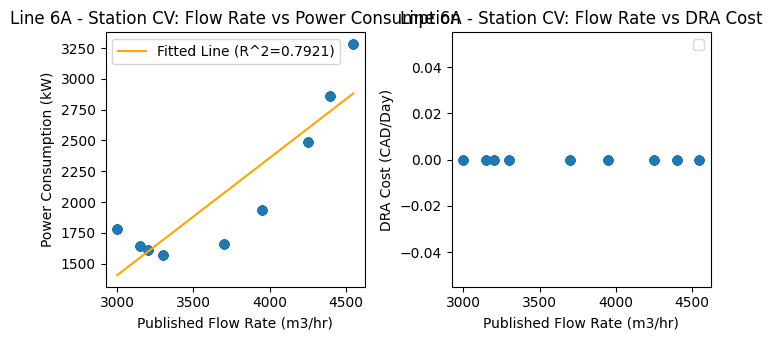

--------------------------------------------------
Line 6A, SL  - Flow Rate Range: 3000 to 4550
Line 6A, SL  - Power Consumption Range: 1462.3554780222476 to 1938.6419251228217
Line 6A, SL  - DRA Cost Range: 0.0 to 0.0
Line 6A, SL - Polynomial Coefficients for PowerConsumptionkW: [3.09495611e-01 5.79877548e+02]
Line 6A, SL - R^2 for PowerConsumptionkW: 0.9640
Line 6A, SL - Not enough unique values in DRA Cost for polynomial fitting.


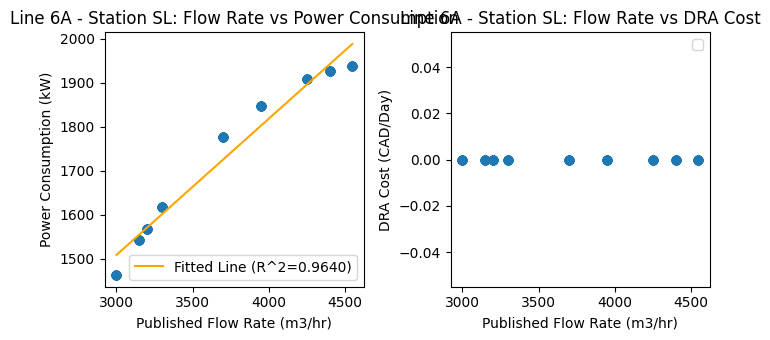

--------------------------------------------------
Line 1, OD  - Flow Rate Range: 600 to 1350
Line 1, OD  - Power Consumption Range: 283.2358504086733 to 1131.4468903141096
Line 1, OD  - DRA Cost Range: 0.0 to 0.0
Line 1, OD - Polynomial Coefficients for PowerConsumptionkW: [   1.13306632 -484.33566559]
Line 1, OD - R^2 for PowerConsumptionkW: 0.9446
Line 1, OD - Not enough unique values in DRA Cost for polynomial fitting.


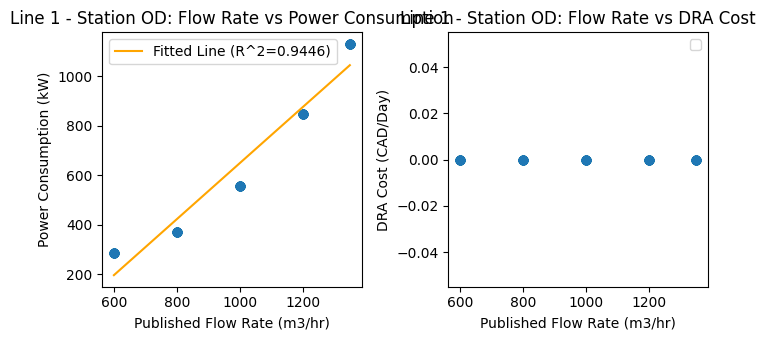

--------------------------------------------------
Line 1, CR  - Flow Rate Range: 600 to 1350
Line 1, CR  - Power Consumption Range: 531.5273921489716 to 1038.224817651324
Line 1, CR  - DRA Cost Range: 0.0 to 0.0
Line 1, CR - Polynomial Coefficients for PowerConsumptionkW: [ 0.67176799 46.5497084 ]
Line 1, CR - R^2 for PowerConsumptionkW: 0.8609
Line 1, CR - Not enough unique values in DRA Cost for polynomial fitting.


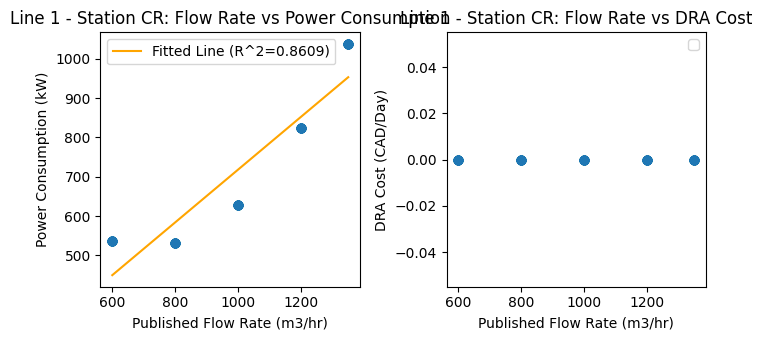

--------------------------------------------------
Line 1, YP  - Flow Rate Range: 600 to 1350
Line 1, YP  - Power Consumption Range: 605.1296678036451 to 2475.624287630432
Line 1, YP  - DRA Cost Range: 0.0 to 0.0
Line 1, YP - Polynomial Coefficients for PowerConsumptionkW: [   2.49596683 -974.20716884]
Line 1, YP - R^2 for PowerConsumptionkW: 0.9896
Line 1, YP - Not enough unique values in DRA Cost for polynomial fitting.


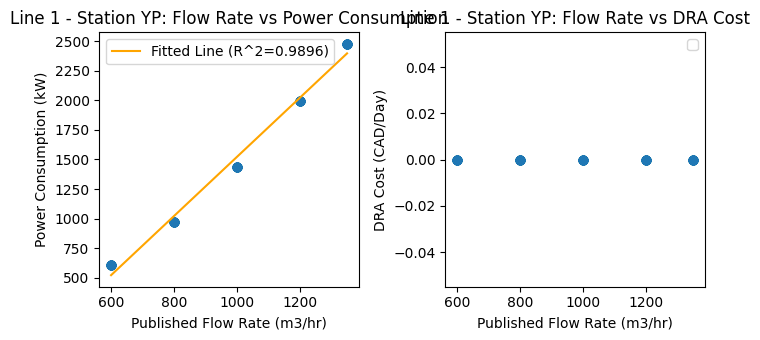

--------------------------------------------------
Line 1, LB  - Flow Rate Range: 600 to 1350
Line 1, LB  - Power Consumption Range: 98.97007792443036 to 1038.133561778348
Line 1, LB  - DRA Cost Range: 0.0 to 0.0
Line 1, LB - Polynomial Coefficients for PowerConsumptionkW: [   1.25499995 -769.24996393]
Line 1, LB - R^2 for PowerConsumptionkW: 0.9239
Line 1, LB - Not enough unique values in DRA Cost for polynomial fitting.


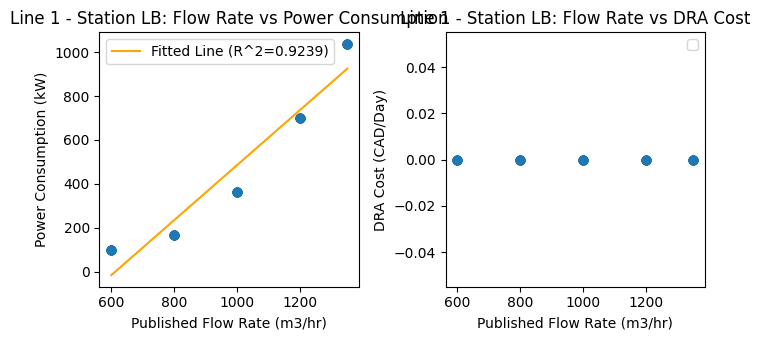

--------------------------------------------------
Line 1, LP  - Flow Rate Range: 600 to 1350
Line 1, LP  - Power Consumption Range: 662.062272593379 to 1570.3851320324466
Line 1, LP  - DRA Cost Range: 0.0 to 0.0
Line 1, LP - Polynomial Coefficients for PowerConsumptionkW: [   1.21372934 -175.19201267]
Line 1, LP - R^2 for PowerConsumptionkW: 0.9269
Line 1, LP - Not enough unique values in DRA Cost for polynomial fitting.


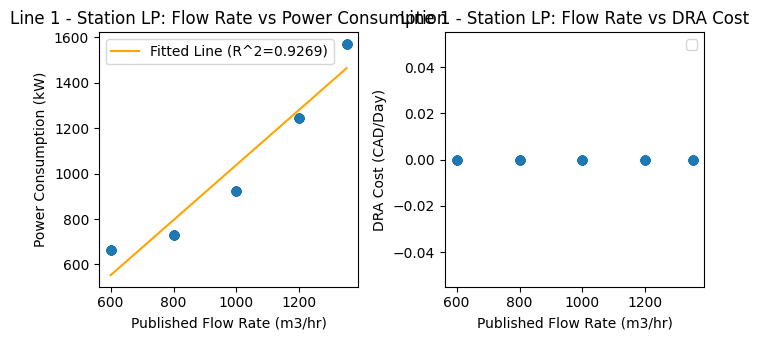

--------------------------------------------------
Line 1, DR  - Flow Rate Range: 600 to 1350
Line 1, DR  - Power Consumption Range: 219.9026670455933 to 1171.7267914824188
Line 1, DR  - DRA Cost Range: 0.0 to 0.0
Line 1, DR - Polynomial Coefficients for PowerConsumptionkW: [   1.21066301 -639.35632262]
Line 1, DR - R^2 for PowerConsumptionkW: 0.8224
Line 1, DR - Not enough unique values in DRA Cost for polynomial fitting.


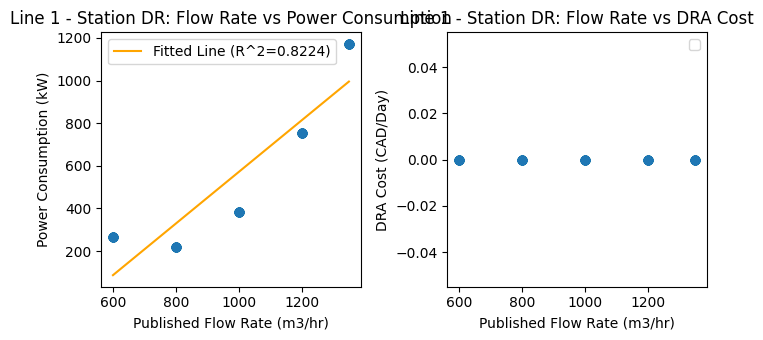

--------------------------------------------------
Line 1, XP  - Flow Rate Range: 600 to 1350
Line 1, XP  - Power Consumption Range: 395.9605495929718 to 1058.9573149355128
Line 1, XP  - DRA Cost Range: 0.0 to 0.0
Line 1, XP - Polynomial Coefficients for PowerConsumptionkW: [ 0.60030355 42.89932349]
Line 1, XP - R^2 for PowerConsumptionkW: 0.4566
Line 1, XP - Not enough unique values in DRA Cost for polynomial fitting.


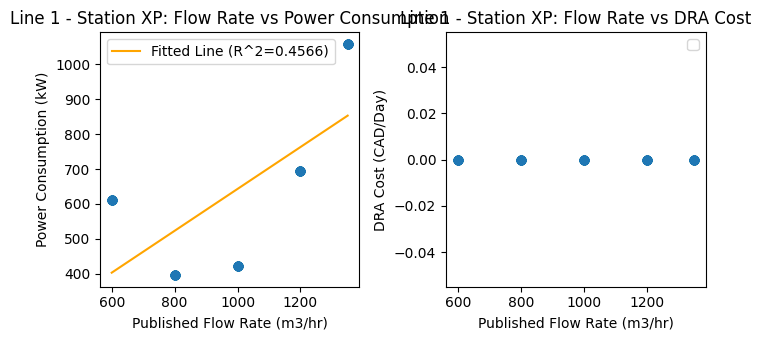

--------------------------------------------------
Line 1, JL  - Flow Rate Range: 600 to 1350
Line 1, JL  - Power Consumption Range: 969.9647765159608 to 1809.271948507056
Line 1, JL  - DRA Cost Range: 0.0 to 0.0
Line 1, JL - Polynomial Coefficients for PowerConsumptionkW: [  0.70820463 575.27751692]
Line 1, JL - R^2 for PowerConsumptionkW: 0.3904
Line 1, JL - Not enough unique values in DRA Cost for polynomial fitting.


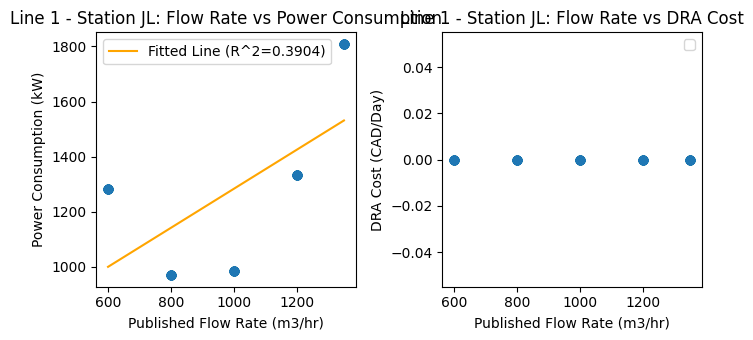

--------------------------------------------------
Line 1, NC  - Flow Rate Range: 600 to 1350
Line 1, NC  - Power Consumption Range: 694.8405045941472 to 1240.0949177636066
Line 1, NC  - DRA Cost Range: 0.0 to 0.0
Line 1, NC - Polynomial Coefficients for PowerConsumptionkW: [  0.72762433 232.65192002]
Line 1, NC - R^2 for PowerConsumptionkW: 0.9880
Line 1, NC - Not enough unique values in DRA Cost for polynomial fitting.


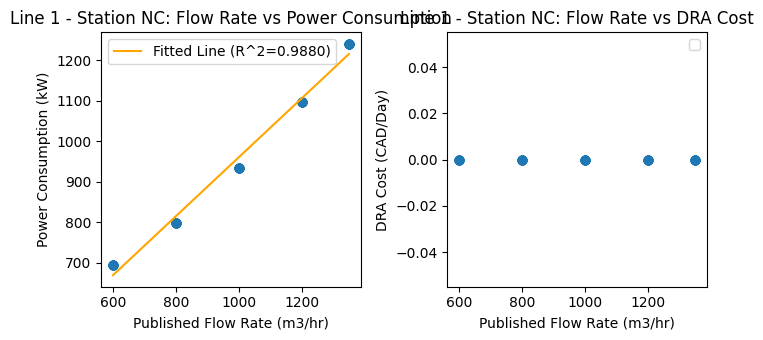

--------------------------------------------------
Line 1, QU  - Flow Rate Range: 600 to 1350
Line 1, QU  - Power Consumption Range: 302.7284264396876 to 1031.721250926028
Line 1, QU  - DRA Cost Range: 0.0 to 0.0
Line 1, QU - Polynomial Coefficients for PowerConsumptionkW: [   0.97220992 -289.68784611]
Line 1, QU - R^2 for PowerConsumptionkW: 0.9991
Line 1, QU - Not enough unique values in DRA Cost for polynomial fitting.


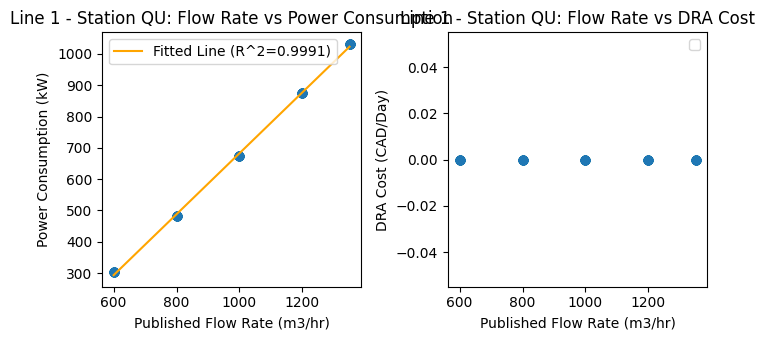

--------------------------------------------------
Line 1, SW  - Flow Rate Range: 600 to 1350
Line 1, SW  - Power Consumption Range: 671.7594881057739 to 1424.3401603288949
Line 1, SW  - DRA Cost Range: 0.0 to 0.0
Line 1, SW - Polynomial Coefficients for PowerConsumptionkW: [ 0.86958561 80.91035977]
Line 1, SW - R^2 for PowerConsumptionkW: 0.7219
Line 1, SW - Not enough unique values in DRA Cost for polynomial fitting.


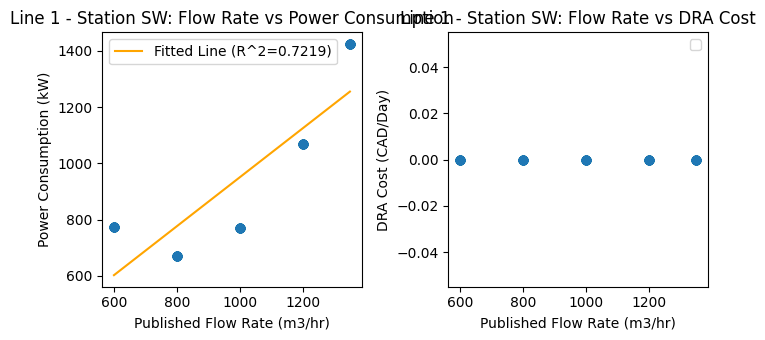

--------------------------------------------------
Line 1, ZP  - Flow Rate Range: 600 to 1350
Line 1, ZP  - Power Consumption Range: 220.2238217163831 to 1670.1855039886432
Line 1, ZP  - DRA Cost Range: 0.0 to 0.0
Line 1, ZP - Polynomial Coefficients for PowerConsumptionkW: [   1.93320434 -936.47236344]
Line 1, ZP - R^2 for PowerConsumptionkW: 1.0000
Line 1, ZP - Not enough unique values in DRA Cost for polynomial fitting.


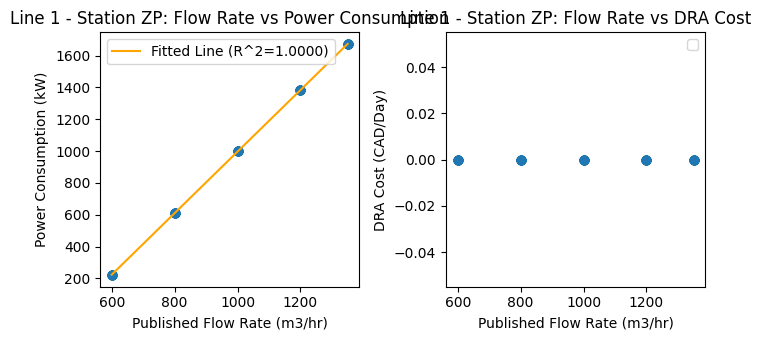

--------------------------------------------------
Line 1, WL  - Flow Rate Range: 600 to 1350
Line 1, WL  - Power Consumption Range: 546.705192565918 to 1295.0896988213062
Line 1, WL  - DRA Cost Range: 0.0 to 0.0
Line 1, WL - Polynomial Coefficients for PowerConsumptionkW: [  0.83698879 -12.81914535]
Line 1, WL - R^2 for PowerConsumptionkW: 0.6856
Line 1, WL - Not enough unique values in DRA Cost for polynomial fitting.


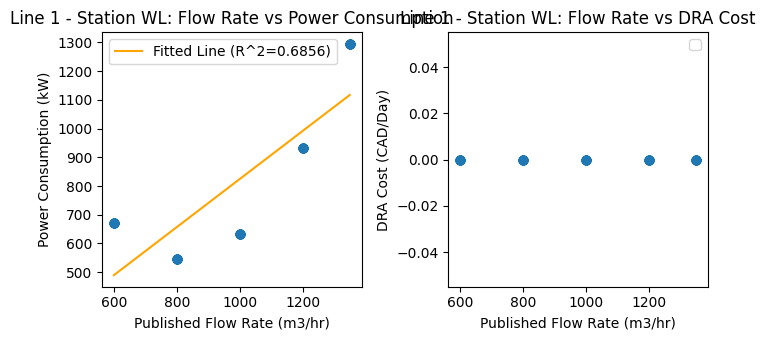

--------------------------------------------------
Line 1, CC  - Flow Rate Range: 600 to 1350
Line 1, CC  - Power Consumption Range: 0.0 to 1660.0338785173371
Line 1, CC  - DRA Cost Range: 0.0 to 0.0
Line 1, CC - Polynomial Coefficients for PowerConsumptionkW: [    2.23277268 -1472.52883065]
Line 1, CC - R^2 for PowerConsumptionkW: 0.9694
Line 1, CC - Not enough unique values in DRA Cost for polynomial fitting.


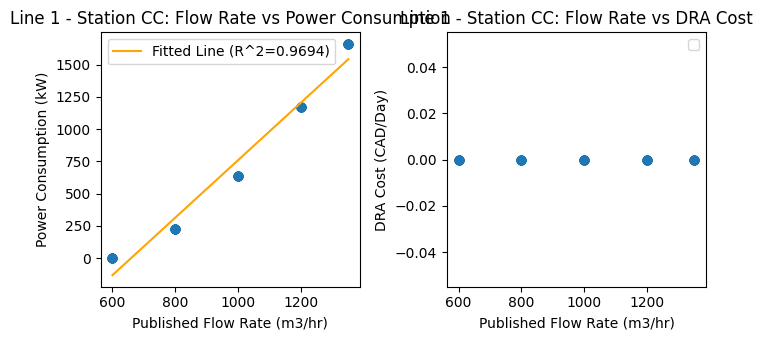

--------------------------------------------------
Line 1, KB  - Flow Rate Range: 600 to 1350
Line 1, KB  - Power Consumption Range: 188.26727028936148 to 1917.4998579663225
Line 1, KB  - DRA Cost Range: 0.0 to 0.0
Line 1, KB - Polynomial Coefficients for PowerConsumptionkW: [    2.30762431 -1278.34806476]
Line 1, KB - R^2 for PowerConsumptionkW: 0.9878
Line 1, KB - Not enough unique values in DRA Cost for polynomial fitting.


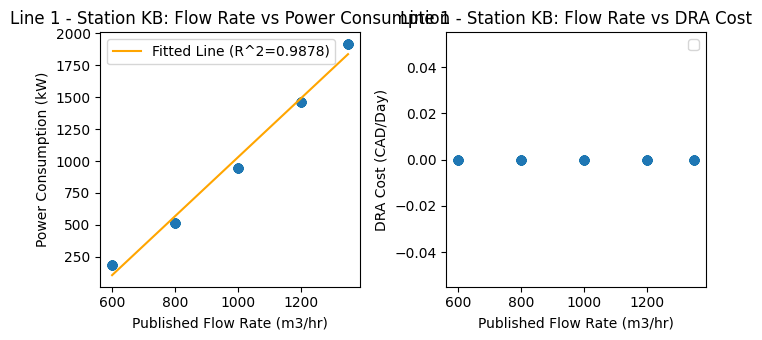

--------------------------------------------------
Line 1, EP  - Flow Rate Range: 600 to 1350
Line 1, EP  - Power Consumption Range: 1353.6456266641617 to 2960.5050210133195
Line 1, EP  - DRA Cost Range: 0.0 to 0.0
Line 1, EP - Polynomial Coefficients for PowerConsumptionkW: [  2.14616003 -86.49855813]
Line 1, EP - R^2 for PowerConsumptionkW: 0.9530
Line 1, EP - Not enough unique values in DRA Cost for polynomial fitting.


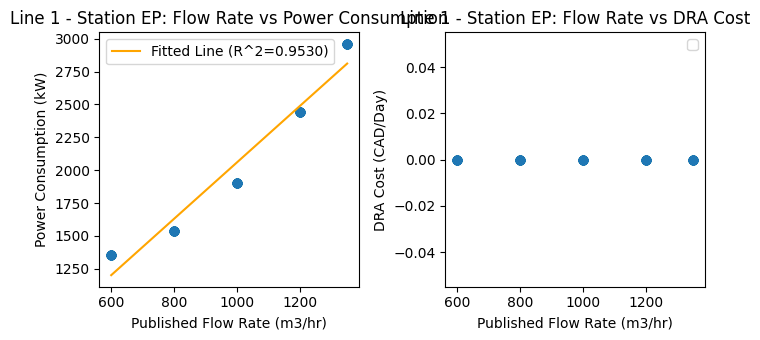

--------------------------------------------------
Line 1, BB  - Flow Rate Range: 600 to 1350
Line 1, BB  - Power Consumption Range: 321.9774663821211 to 850.1741631396678
Line 1, BB  - DRA Cost Range: 0.0 to 0.0
Line 1, BB - Polynomial Coefficients for PowerConsumptionkW: [   0.70073267 -127.7629909 ]
Line 1, BB - R^2 for PowerConsumptionkW: 0.9815
Line 1, BB - Not enough unique values in DRA Cost for polynomial fitting.


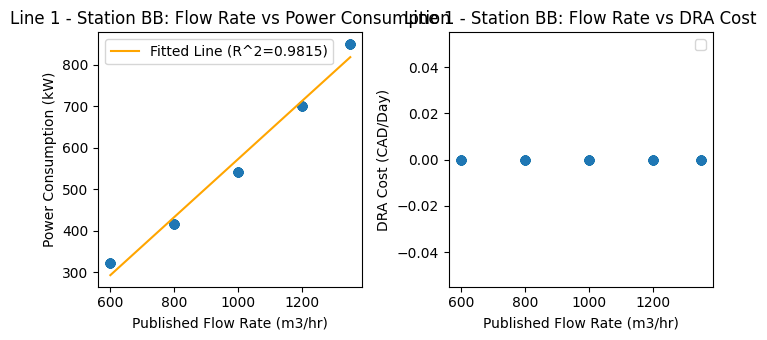

--------------------------------------------------
Line 1, AP  - Flow Rate Range: 600 to 1350
Line 1, AP  - Power Consumption Range: 351.2121413764904 to 1237.611060240399
Line 1, AP  - DRA Cost Range: 0.0 to 0.0
Line 1, AP - Polynomial Coefficients for PowerConsumptionkW: [   1.17154325 -413.86730364]
Line 1, AP - R^2 for PowerConsumptionkW: 0.9696
Line 1, AP - Not enough unique values in DRA Cost for polynomial fitting.


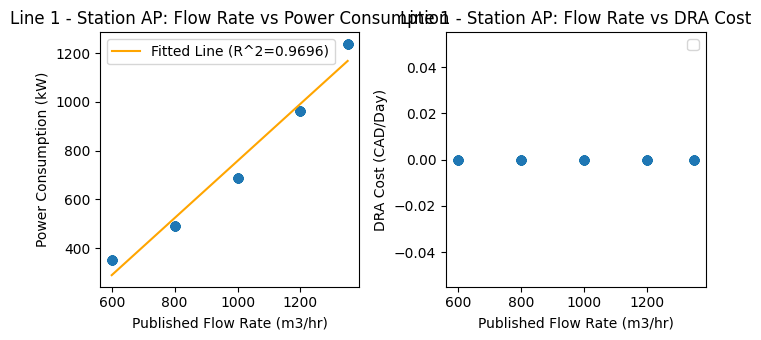

--------------------------------------------------
Line 1, GW  - Flow Rate Range: 600 to 1350
Line 1, GW  - Power Consumption Range: 244.38554445654157 to 1110.37658138806
Line 1, GW  - DRA Cost Range: 0.0 to 0.0
Line 1, GW - Polynomial Coefficients for PowerConsumptionkW: [   1.15627076 -516.3080126 ]
Line 1, GW - R^2 for PowerConsumptionkW: 0.9683
Line 1, GW - Not enough unique values in DRA Cost for polynomial fitting.


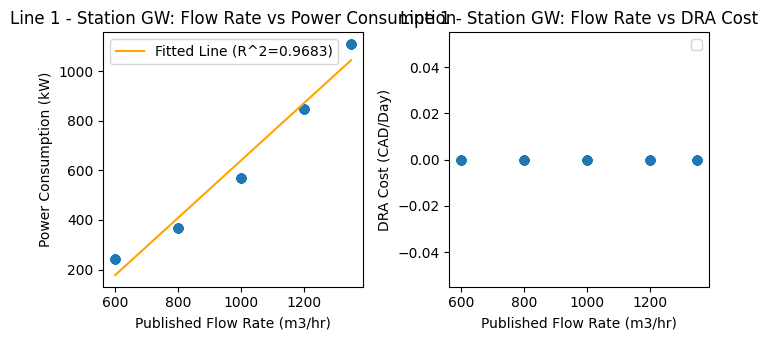

--------------------------------------------------
Line 1, BU  - Flow Rate Range: 600 to 1350
Line 1, BU  - Power Consumption Range: 188.992526832968 to 1315.0791503863877
Line 1, BU  - DRA Cost Range: 0.0 to 0.0
Line 1, BU - Polynomial Coefficients for PowerConsumptionkW: [   1.49999996 -650.99999728]
Line 1, BU - R^2 for PowerConsumptionkW: 0.9846
Line 1, BU - Not enough unique values in DRA Cost for polynomial fitting.


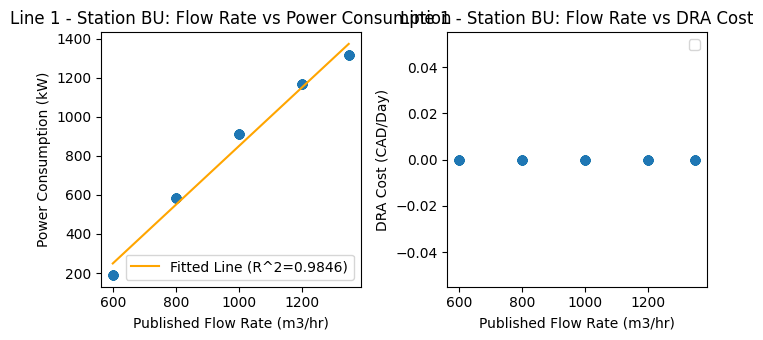

--------------------------------------------------
Line 1, CM  - Flow Rate Range: 600 to 1350
Line 1, CM  - Power Consumption Range: 610.0216445922852 to 1384.178221732378
Line 1, CM  - DRA Cost Range: 0.0 to 0.0
Line 1, CM - Polynomial Coefficients for PowerConsumptionkW: [ 0.82530388 72.14909578]
Line 1, CM - R^2 for PowerConsumptionkW: 0.6317
Line 1, CM - Not enough unique values in DRA Cost for polynomial fitting.


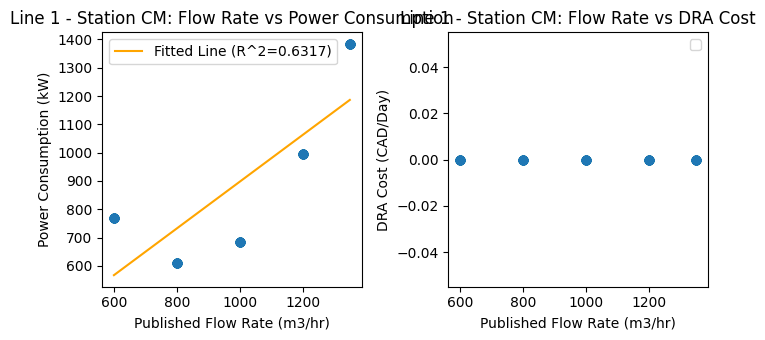

--------------------------------------------------
Line 1, ST  - Flow Rate Range: 600 to 1350
Line 1, ST  - Power Consumption Range: 27.65920254215598 to 1603.7458672018256
Line 1, ST  - DRA Cost Range: 0.0 to 0.0
Line 1, ST - Polynomial Coefficients for PowerConsumptionkW: [    2.10096686 -1212.95720199]
Line 1, ST - R^2 for PowerConsumptionkW: 0.9991
Line 1, ST - Not enough unique values in DRA Cost for polynomial fitting.


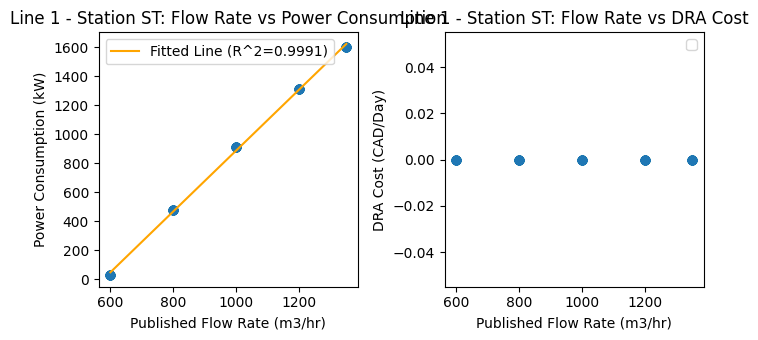

--------------------------------------------------
Line 1, MI  - Flow Rate Range: 600 to 1350
Line 1, MI  - Power Consumption Range: 95.0570788383484 to 1036.657687664032
Line 1, MI  - DRA Cost Range: 0.0 to 0.0
Line 1, MI - Polynomial Coefficients for PowerConsumptionkW: [1.70552169e-01 4.18952929e+02]
Line 1, MI - R^2 for PowerConsumptionkW: 0.0161
Line 1, MI - Not enough unique values in DRA Cost for polynomial fitting.


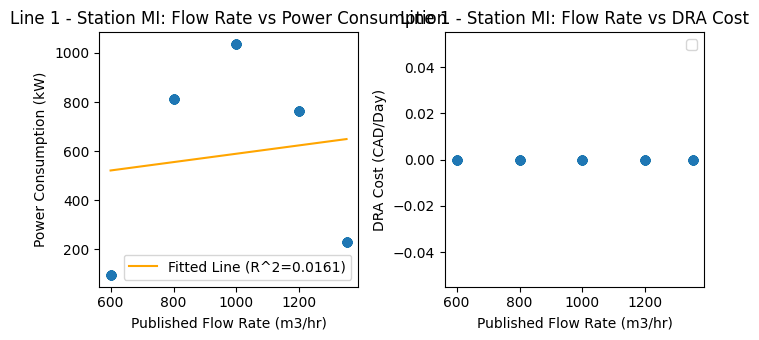

--------------------------------------------------
Line 1, WC  - Flow Rate Range: 600 to 1350
Line 1, WC  - Power Consumption Range: 164.71016958984546 to 746.9689504096023
Line 1, WC  - DRA Cost Range: 0.0 to 0.0
Line 1, WC - Polynomial Coefficients for PowerConsumptionkW: [   0.77638123 -302.61740192]
Line 1, WC - R^2 for PowerConsumptionkW: 1.0000
Line 1, WC - Not enough unique values in DRA Cost for polynomial fitting.


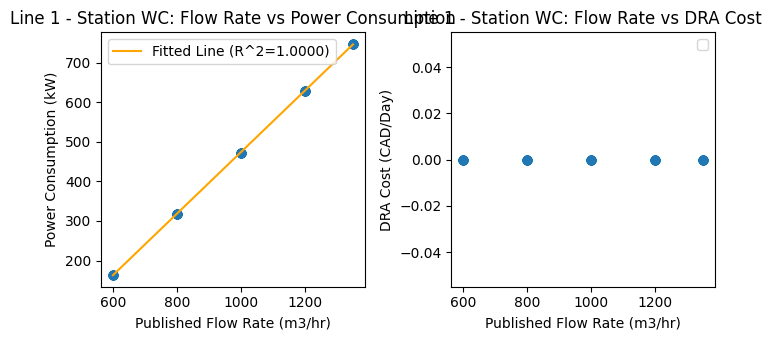

--------------------------------------------------
Line 1, GF  - Flow Rate Range: 600 to 1350
Line 1, GF  - Power Consumption Range: 200.85203376412392 to 694.2590923402458
Line 1, GF  - DRA Cost Range: 0.0 to 0.0
Line 1, GF - Polynomial Coefficients for PowerConsumptionkW: [  0.24906118 161.62963543]
Line 1, GF - R^2 for PowerConsumptionkW: 0.1369
Line 1, GF - Not enough unique values in DRA Cost for polynomial fitting.


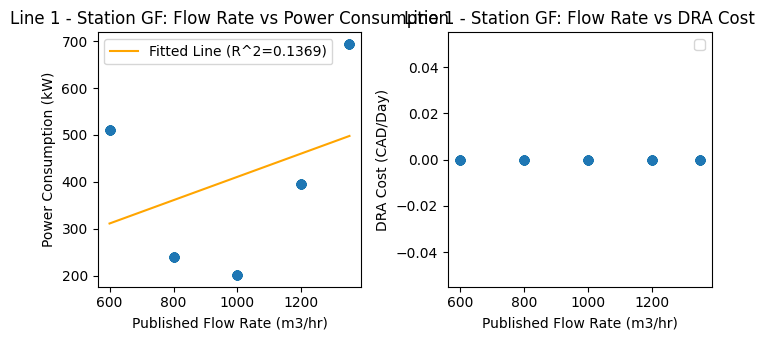

--------------------------------------------------
Line 1, VG  - Flow Rate Range: 600 to 1350
Line 1, VG  - Power Consumption Range: 878.1524584293365 to 1953.989143007435
Line 1, VG  - DRA Cost Range: 0.0 to 0.0
Line 1, VG - Polynomial Coefficients for PowerConsumptionkW: [ 1.25220988 24.31212055]
Line 1, VG - R^2 for PowerConsumptionkW: 0.7299
Line 1, VG - Not enough unique values in DRA Cost for polynomial fitting.


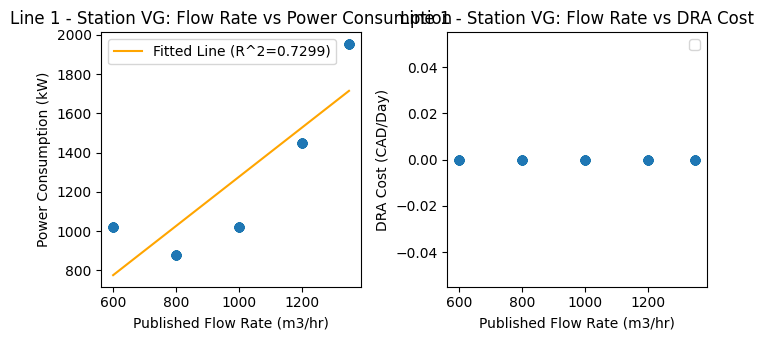

--------------------------------------------------
Line 65, CM  - Flow Rate Range: 750 to 1370
Line 65, CM  - Power Consumption Range: 921.2941043963656 to 2766.6456323629245
Line 65, CM  - DRA Cost Range: 0.0 to 692.28
Line 65, CM - Polynomial Coefficients for PowerConsumptionkW: [    2.96538818 -1354.86925854]
Line 65, CM - R^2 for PowerConsumptionkW: 0.9933
Line 65, CM - Polynomial Coefficients for DRA Cost: [    1.32757156 -1087.63728718]
Line 65, CM - R^2 for DRA Cost: 0.7862


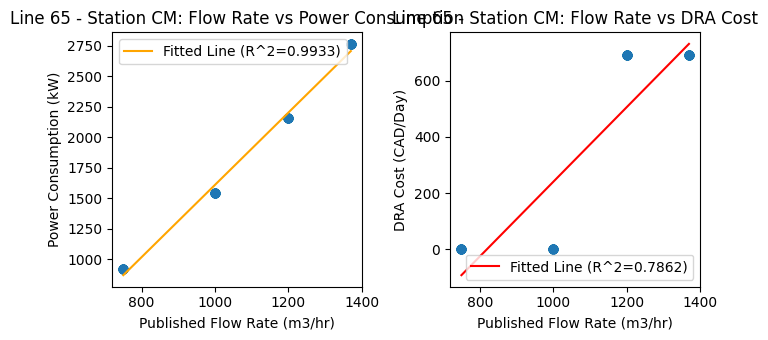

--------------------------------------------------
Line 65, LP  - Flow Rate Range: 750 to 1370
Line 65, LP  - Power Consumption Range: 105.96400025300682 to 2173.681371910497
Line 65, LP  - DRA Cost Range: 0.0 to 0.0
Line 65, LP - Polynomial Coefficients for PowerConsumptionkW: [    3.31763342 -2464.79403659]
Line 65, LP - R^2 for PowerConsumptionkW: 0.9867
Line 65, LP - Not enough unique values in DRA Cost for polynomial fitting.


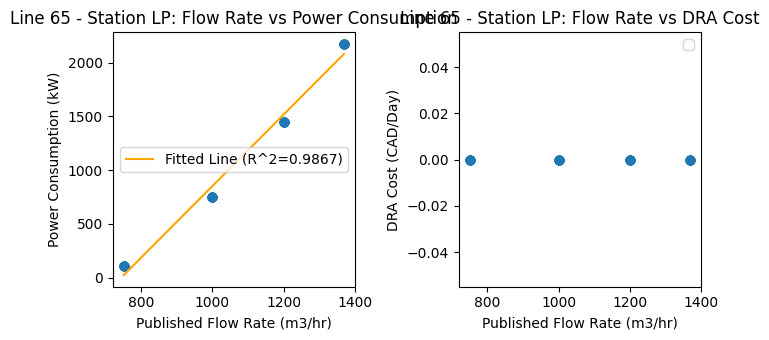

--------------------------------------------------
Line 65, PL  - Flow Rate Range: 750 to 1370
Line 65, PL  - Power Consumption Range: 147.90265094774077 to 1623.8307409925037
Line 65, PL  - DRA Cost Range: 0.0 to 0.0
Line 65, PL - Polynomial Coefficients for PowerConsumptionkW: [    2.3788587  -1644.16738586]
Line 65, PL - R^2 for PowerConsumptionkW: 0.9998
Line 65, PL - Not enough unique values in DRA Cost for polynomial fitting.


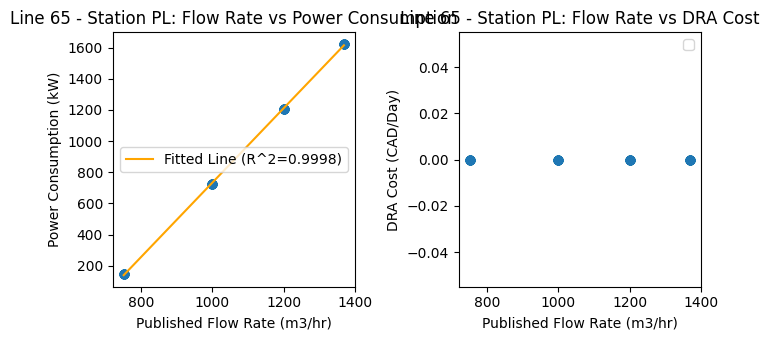

--------------------------------------------------
Line 65, DN  - Flow Rate Range: 750 to 1370
Line 65, DN  - Power Consumption Range: 1231.5119950491935 to 3188.4468088317662
Line 65, DN  - DRA Cost Range: 0.0 to 0.0
Line 65, DN - Polynomial Coefficients for PowerConsumptionkW: [    3.10060859 -1358.406626  ]
Line 65, DN - R^2 for PowerConsumptionkW: 0.8634
Line 65, DN - Not enough unique values in DRA Cost for polynomial fitting.


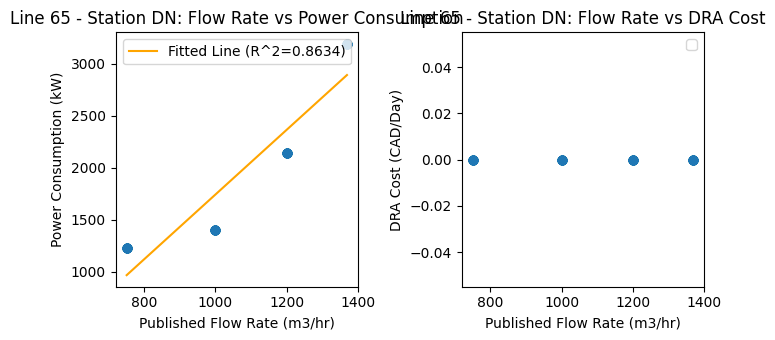

--------------------------------------------------
Line 65, XP  - Flow Rate Range: 750 to 1370
Line 65, XP  - Power Consumption Range: 76.89618987217546 to 2642.841899666935
Line 65, XP  - DRA Cost Range: 0.0 to 0.0
Line 65, XP - Polynomial Coefficients for PowerConsumptionkW: [    4.11440581 -3123.80841961]
Line 65, XP - R^2 for PowerConsumptionkW: 0.9833
Line 65, XP - Not enough unique values in DRA Cost for polynomial fitting.


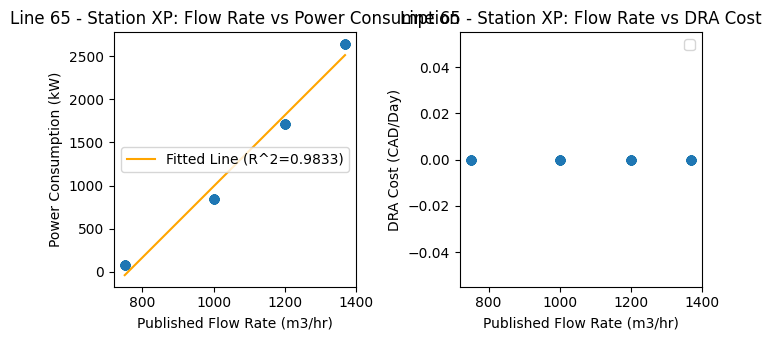

--------------------------------------------------
Line 2A, OD  - Flow Rate Range: 1500 to 2900
Line 2A, OD  - Power Consumption Range: 664.5639486741275 to 3414.158352104947
Line 2A, OD  - DRA Cost Range: 0.0 to 2301.8304
Line 2A, OD - Polynomial Coefficients for PowerConsumptionkW: [ 2.00379313e+00 -2.68087941e+03]
Line 2A, OD - R^2 for PowerConsumptionkW: 0.9481
Line 2A, OD - Polynomial Coefficients for DRA Cost: [ 1.57299741e+00 -3.01284650e+03]
Line 2A, OD - R^2 for DRA Cost: 0.6717


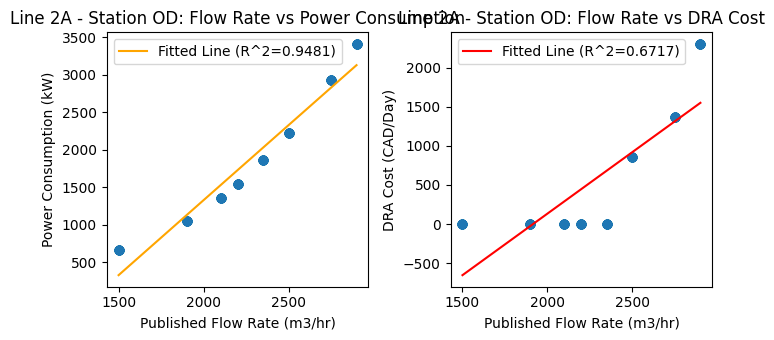

--------------------------------------------------
Line 2A, ME  - Flow Rate Range: 1500 to 2900
Line 2A, ME  - Power Consumption Range: 995.6709059774876 to 4189.862463146448
Line 2A, ME  - DRA Cost Range: 0.0 to 2717.1984
Line 2A, ME - Polynomial Coefficients for PowerConsumptionkW: [ 2.33863834e+00 -2.99952638e+03]
Line 2A, ME - R^2 for PowerConsumptionkW: 0.9236
Line 2A, ME - Polynomial Coefficients for DRA Cost: [ 1.56956594e+00 -3.03640882e+03]
Line 2A, ME - R^2 for DRA Cost: 0.5629


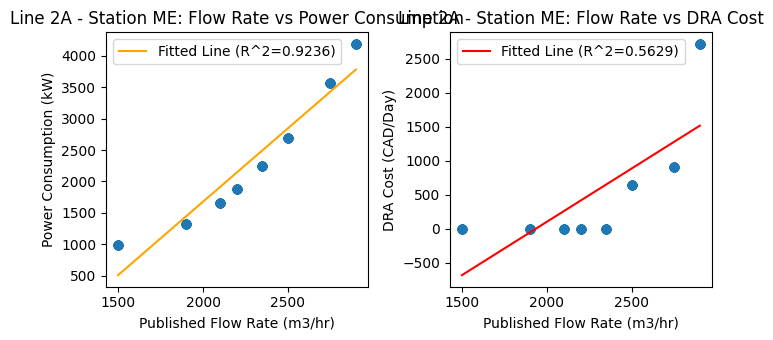

--------------------------------------------------
Line 2A, EP  - Flow Rate Range: 1500 to 2900
Line 2A, EP  - Power Consumption Range: 1451.3466585408896 to 4476.033264396712
Line 2A, EP  - DRA Cost Range: 0.0 to 5877.4584
Line 2A, EP - Polynomial Coefficients for PowerConsumptionkW: [    2.19325867 -2118.28837475]
Line 2A, EP - R^2 for PowerConsumptionkW: 0.9699
Line 2A, EP - Polynomial Coefficients for DRA Cost: [ 3.02469703e+00 -5.84687605e+03]
Line 2A, EP - R^2 for DRA Cost: 0.4734


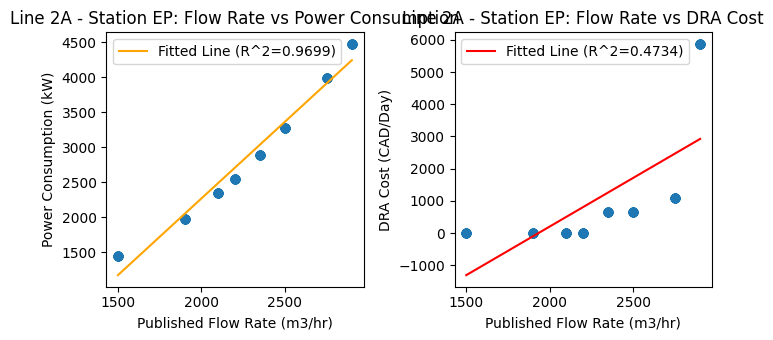

--------------------------------------------------
Line 2A, ZP  - Flow Rate Range: 1500 to 2900
Line 2A, ZP  - Power Consumption Range: 1120.5226732175795 to 3611.537914885208
Line 2A, ZP  - DRA Cost Range: 0.0 to 1687.4328
Line 2A, ZP - Polynomial Coefficients for PowerConsumptionkW: [ 1.82836201e+00 -2.04089868e+03]
Line 2A, ZP - R^2 for PowerConsumptionkW: 0.9091
Line 2A, ZP - Polynomial Coefficients for DRA Cost: [ 1.13987520e+00 -2.18217468e+03]
Line 2A, ZP - R^2 for DRA Cost: 0.6674


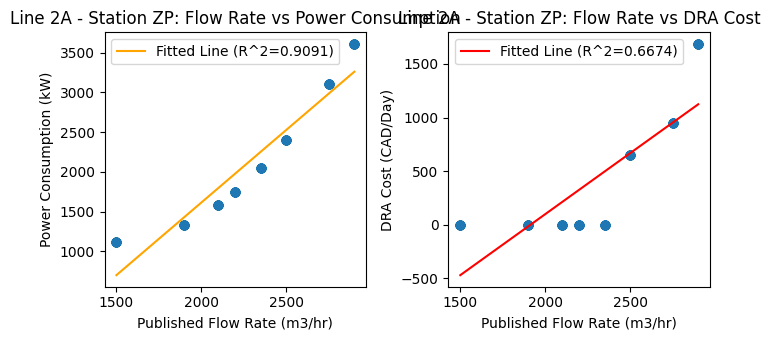

--------------------------------------------------
Line 2A, KG  - Flow Rate Range: 1500 to 2900
Line 2A, KG  - Power Consumption Range: 0.0 to 2963.831968147308
Line 2A, KG  - DRA Cost Range: 0.0 to 5242.2912
Line 2A, KG - Polynomial Coefficients for PowerConsumptionkW: [ 2.16559454e+00 -3.63722169e+03]
Line 2A, KG - R^2 for PowerConsumptionkW: 0.9428
Line 2A, KG - Polynomial Coefficients for DRA Cost: [ 2.96173531e+00 -5.46609903e+03]
Line 2A, KG - R^2 for DRA Cost: 0.6198


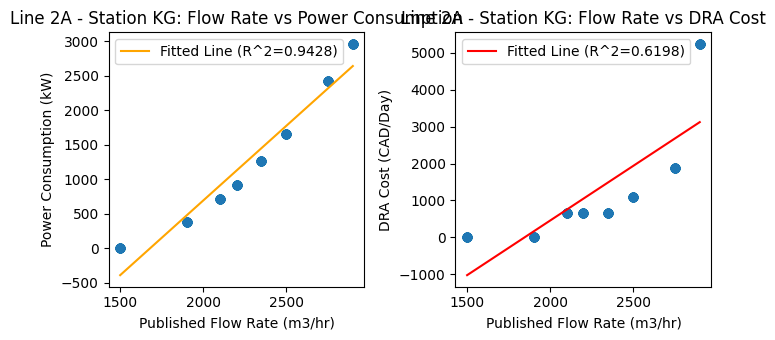

--------------------------------------------------
Line 2A, LB  - Flow Rate Range: 1500 to 2900
Line 2A, LB  - Power Consumption Range: 46.11776887346059 to 3418.564176437445
Line 2A, LB  - DRA Cost Range: 0.0 to 2474.9016
Line 2A, LB - Polynomial Coefficients for PowerConsumptionkW: [ 2.42834470e+00 -3.76248433e+03]
Line 2A, LB - R^2 for PowerConsumptionkW: 0.9912
Line 2A, LB - Polynomial Coefficients for DRA Cost: [ 1.68116669e+00 -3.15617112e+03]
Line 2A, LB - R^2 for DRA Cost: 0.7351


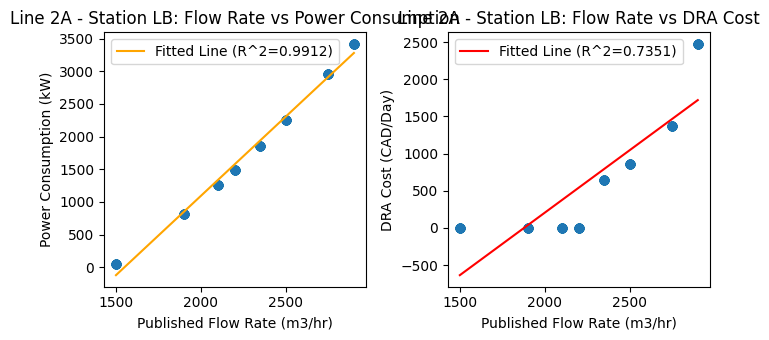

--------------------------------------------------
Line 2A, ST  - Flow Rate Range: 1500 to 2900
Line 2A, ST  - Power Consumption Range: 68.12983328069095 to 2249.7178400686244
Line 2A, ST  - DRA Cost Range: 0.0 to 4932.4944
Line 2A, ST - Polynomial Coefficients for PowerConsumptionkW: [ 1.56277586e+00 -2.31444012e+03]
Line 2A, ST - R^2 for PowerConsumptionkW: 0.9989
Line 2A, ST - Polynomial Coefficients for DRA Cost: [ 2.76001846e+00 -5.08161359e+03]
Line 2A, ST - R^2 for DRA Cost: 0.6122


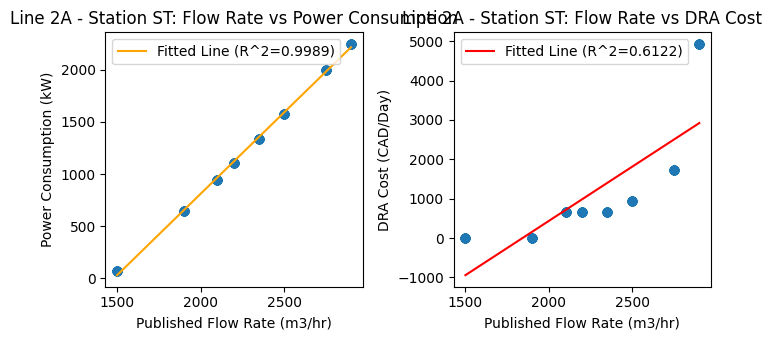

--------------------------------------------------
Line 2A, CC  - Flow Rate Range: 1500 to 2900
Line 2A, CC  - Power Consumption Range: 539.0801650546491 to 3885.115051742643
Line 2A, CC  - DRA Cost Range: 0.0 to 2007.612
Line 2A, CC - Polynomial Coefficients for PowerConsumptionkW: [ 2.41546562e+00 -3.30130917e+03]
Line 2A, CC - R^2 for PowerConsumptionkW: 0.9848
Line 2A, CC - Polynomial Coefficients for DRA Cost: [ 1.34144189e+00 -2.57475600e+03]
Line 2A, CC - R^2 for DRA Cost: 0.6604


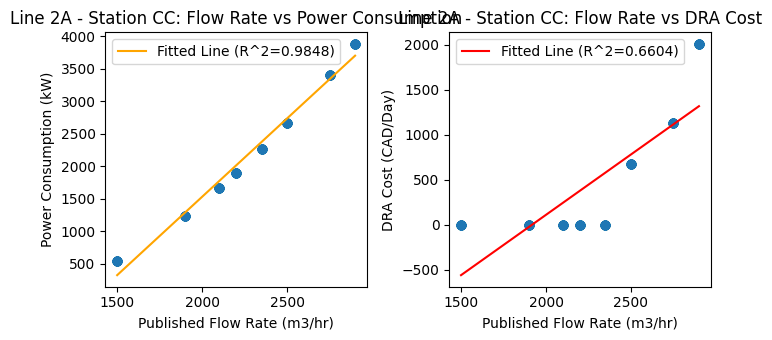

--------------------------------------------------
Line 2A, BU  - Flow Rate Range: 1500 to 2900
Line 2A, BU  - Power Consumption Range: 862.4300852697343 to 4180.878483904526
Line 2A, BU  - DRA Cost Range: 0.0 to 1038.42
Line 2A, BU - Polynomial Coefficients for PowerConsumptionkW: [ 2.41913780e+00 -3.18303862e+03]
Line 2A, BU - R^2 for PowerConsumptionkW: 0.9465
Line 2A, BU - Polynomial Coefficients for DRA Cost: [ 6.60202469e-01 -1.29103152e+03]
Line 2A, BU - R^2 for DRA Cost: 0.5526


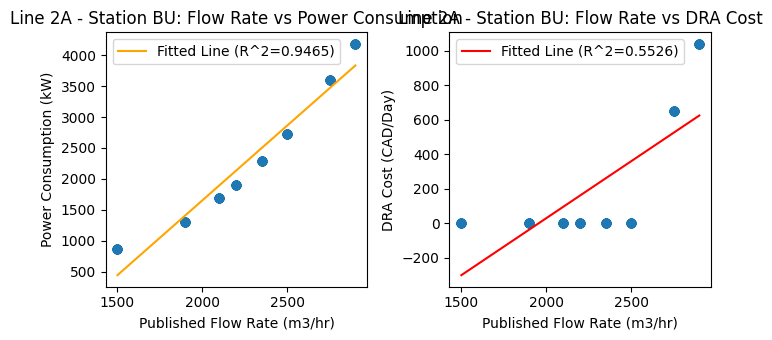

--------------------------------------------------
Line 2A, AP  - Flow Rate Range: 1500 to 2900
Line 2A, AP  - Power Consumption Range: 720.4053889596835 to 3745.088094995357
Line 2A, AP  - DRA Cost Range: 0.0 to 1808.5824
Line 2A, AP - Polynomial Coefficients for PowerConsumptionkW: [ 2.18698270e+00 -2.78626072e+03]
Line 2A, AP - R^2 for PowerConsumptionkW: 0.9800
Line 2A, AP - Polynomial Coefficients for DRA Cost: [ 1.09854724e+00 -2.10870567e+03]
Line 2A, AP - R^2 for DRA Cost: 0.6000


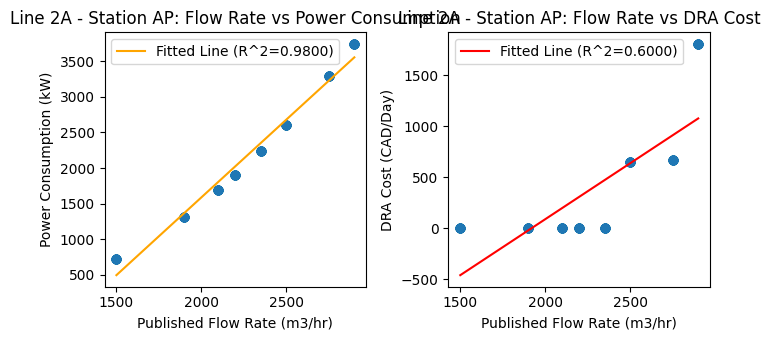

--------------------------------------------------
Line 2A, CK  - Flow Rate Range: 1500 to 2900
Line 2A, CK  - Power Consumption Range: 99.53909774217756 to 3430.2256678873678
Line 2A, CK  - DRA Cost Range: 0.0 to 1964.3448
Line 2A, CK - Polynomial Coefficients for PowerConsumptionkW: [ 2.37468961e+00 -3.42516903e+03]
Line 2A, CK - R^2 for PowerConsumptionkW: 0.9995
Line 2A, CK - Polynomial Coefficients for DRA Cost: [ 1.34367985e+00 -2.57443895e+03]
Line 2A, CK - R^2 for DRA Cost: 0.6717


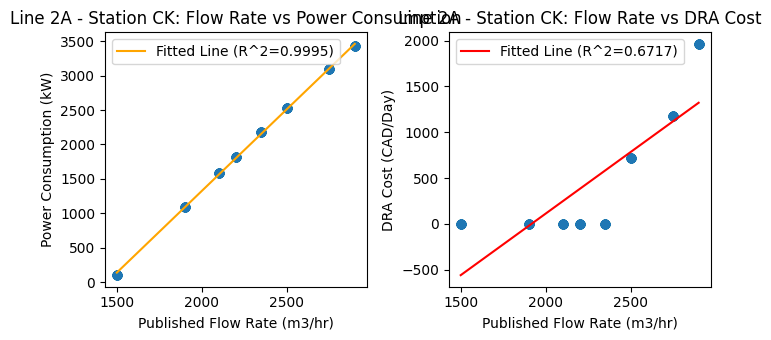

--------------------------------------------------
Line 2A, YP  - Flow Rate Range: 1500 to 2900
Line 2A, YP  - Power Consumption Range: 1101.3467446276918 to 4294.451873966493
Line 2A, YP  - DRA Cost Range: 0.0 to 2414.3256
Line 2A, YP - Polynomial Coefficients for PowerConsumptionkW: [ 2.30555169e+00 -2.56838014e+03]
Line 2A, YP - R^2 for PowerConsumptionkW: 0.9842
Line 2A, YP - Polynomial Coefficients for DRA Cost: [ 1.39082599e+00 -2.68602332e+03]
Line 2A, YP - R^2 for DRA Cost: 0.5608


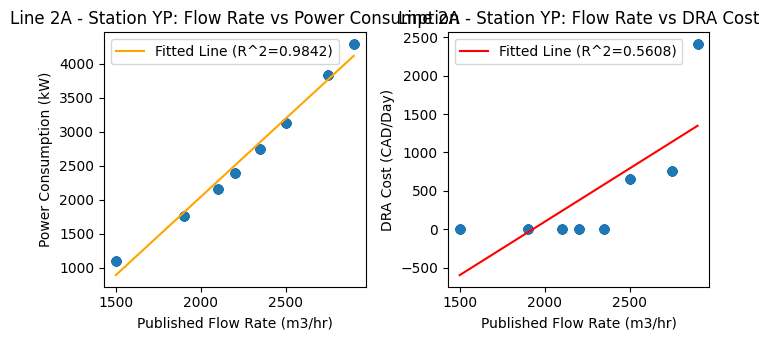

--------------------------------------------------
Line 2A, QU  - Flow Rate Range: 1500 to 2900
Line 2A, QU  - Power Consumption Range: 1022.9867609702052 to 3647.815846886486
Line 2A, QU  - DRA Cost Range: 0.0 to 3677.7384
Line 2A, QU - Polynomial Coefficients for PowerConsumptionkW: [ 1.92834479e+00 -2.32598467e+03]
Line 2A, QU - R^2 for PowerConsumptionkW: 0.9036
Line 2A, QU - Polynomial Coefficients for DRA Cost: [ 2.79000844e+00 -5.42783460e+03]
Line 2A, QU - R^2 for DRA Cost: 0.5563


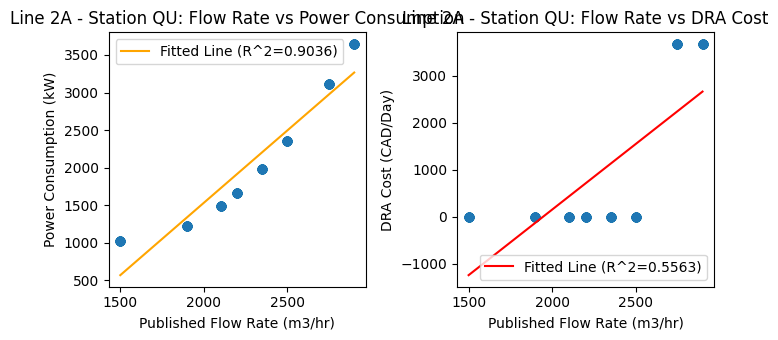

--------------------------------------------------
Line 2A, HR  - Flow Rate Range: 1500 to 2900
Line 2A, HR  - Power Consumption Range: 387.5949107571505 to 3446.408959431108
Line 2A, HR  - DRA Cost Range: 0.0 to 2483.5536
Line 2A, HR - Polynomial Coefficients for PowerConsumptionkW: [ 2.20274137e+00 -3.06911164e+03]
Line 2A, HR - R^2 for PowerConsumptionkW: 0.9909
Line 2A, HR - Polynomial Coefficients for DRA Cost: [ 1.57299724e+00 -2.74675092e+03]
Line 2A, HR - R^2 for DRA Cost: 0.7973


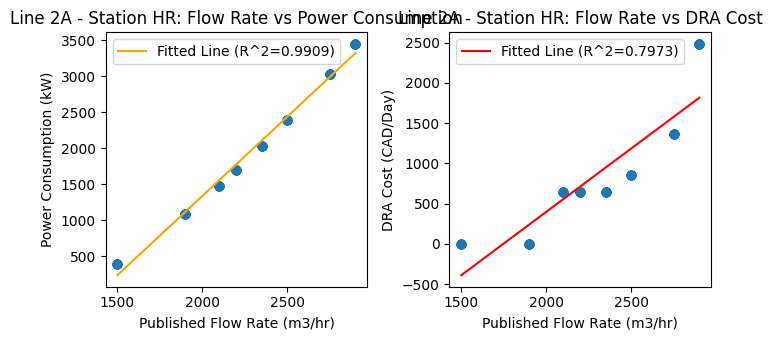

--------------------------------------------------
Line 2A, KB  - Flow Rate Range: 1500 to 2900
Line 2A, KB  - Power Consumption Range: 720.0372677482665 to 3597.2784538008277
Line 2A, KB  - DRA Cost Range: 0.0 to 4153.68
Line 2A, KB - Polynomial Coefficients for PowerConsumptionkW: [ 2.09284495e+00 -2.74084707e+03]
Line 2A, KB - R^2 for PowerConsumptionkW: 0.9570
Line 2A, KB - Polynomial Coefficients for DRA Cost: [ 2.37866826e+00 -4.33302760e+03]
Line 2A, KB - R^2 for DRA Cost: 0.6500


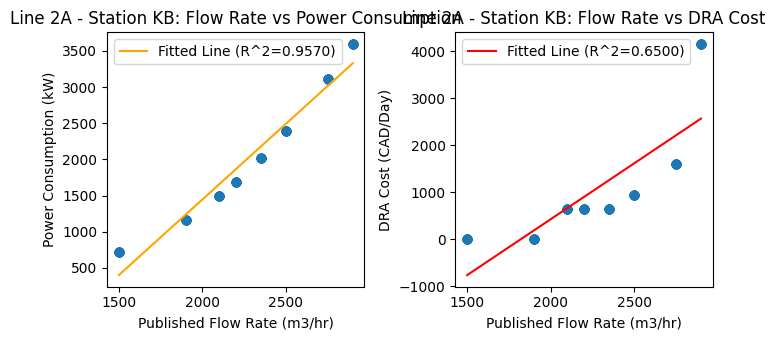

--------------------------------------------------
Line 2A, WC  - Flow Rate Range: 1500 to 2900
Line 2A, WC  - Power Consumption Range: 25.161274632439017 to 1428.1824578698725
Line 2A, WC  - DRA Cost Range: 0.0 to 0.0
Line 2A, WC - Polynomial Coefficients for PowerConsumptionkW: [ 9.77224027e-01 -1.22781002e+03]
Line 2A, WC - R^2 for PowerConsumptionkW: 0.9171
Line 2A, WC - Not enough unique values in DRA Cost for polynomial fitting.


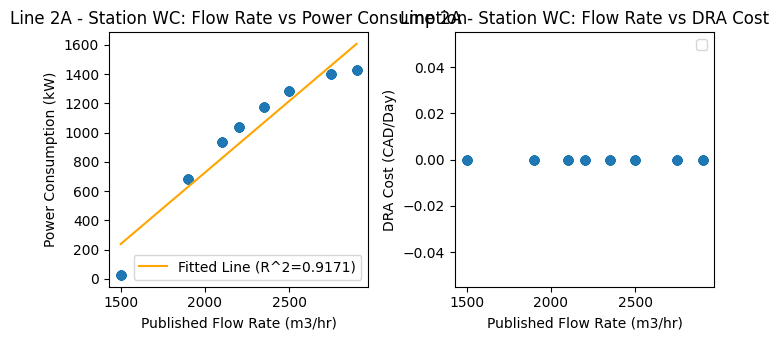

--------------------------------------------------
Line 2A, MI  - Flow Rate Range: 1500 to 2900
Line 2A, MI  - Power Consumption Range: 796.2608974622563 to 3758.806943726726
Line 2A, MI  - DRA Cost Range: 0.0 to 2933.5368
Line 2A, MI - Polynomial Coefficients for PowerConsumptionkW: [ 2.13806886e+00 -2.59835678e+03]
Line 2A, MI - R^2 for PowerConsumptionkW: 0.9856
Line 2A, MI - Polynomial Coefficients for DRA Cost: [ 1.90675411e+00 -3.38165370e+03]
Line 2A, MI - R^2 for DRA Cost: 0.8022


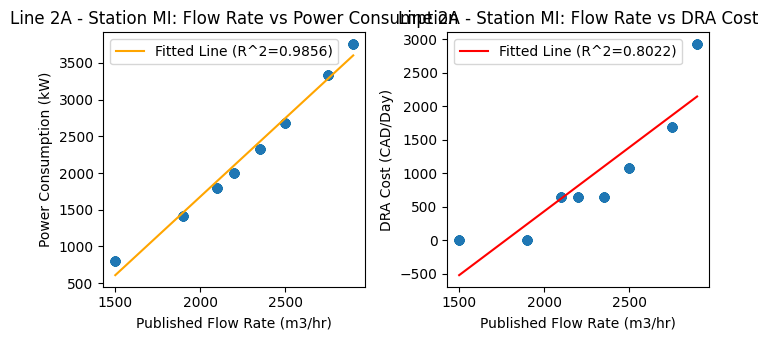

--------------------------------------------------
Line 4, BU  - Flow Rate Range: 3600 to 5850
Line 4, BU  - Power Consumption Range: 2512.388980001211 to 8652.622036097106
Line 4, BU  - DRA Cost Range: 0.0 to 0.0
Line 4, BU - Polynomial Coefficients for PowerConsumptionkW: [ 2.71692357e+00 -7.50796298e+03]
Line 4, BU - R^2 for PowerConsumptionkW: 0.9926
Line 4, BU - Not enough unique values in DRA Cost for polynomial fitting.


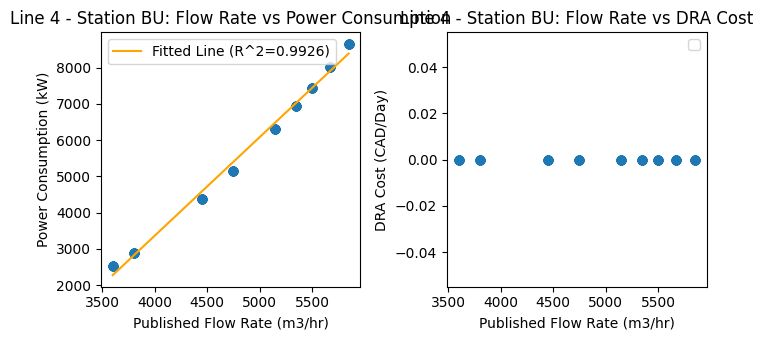

--------------------------------------------------
Line 4, CC  - Flow Rate Range: 3600 to 5850
Line 4, CC  - Power Consumption Range: 1779.1274588555098 to 10718.808395805536
Line 4, CC  - DRA Cost Range: 0.0 to 0.0
Line 4, CC - Polynomial Coefficients for PowerConsumptionkW: [ 3.97887331e+00 -1.24320992e+04]
Line 4, CC - R^2 for PowerConsumptionkW: 0.9992
Line 4, CC - Not enough unique values in DRA Cost for polynomial fitting.


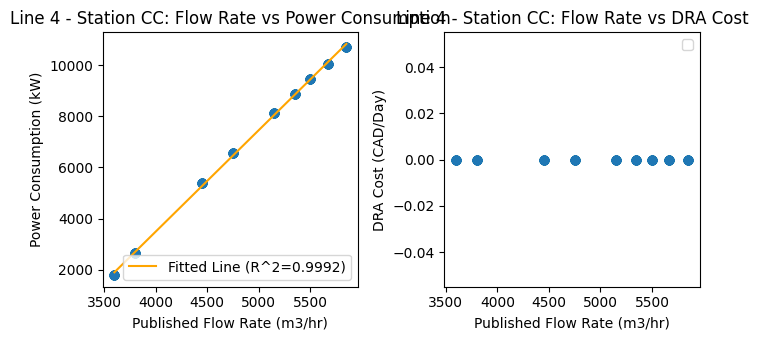

--------------------------------------------------
Line 4, CM  - Flow Rate Range: 3600 to 5850
Line 4, CM  - Power Consumption Range: 1405.5646080896258 to 8706.046167376335
Line 4, CM  - DRA Cost Range: 0.0 to 0.0
Line 4, CM - Polynomial Coefficients for PowerConsumptionkW: [ 3.23610997e+00 -1.04140194e+04]
Line 4, CM - R^2 for PowerConsumptionkW: 0.9974
Line 4, CM - Not enough unique values in DRA Cost for polynomial fitting.


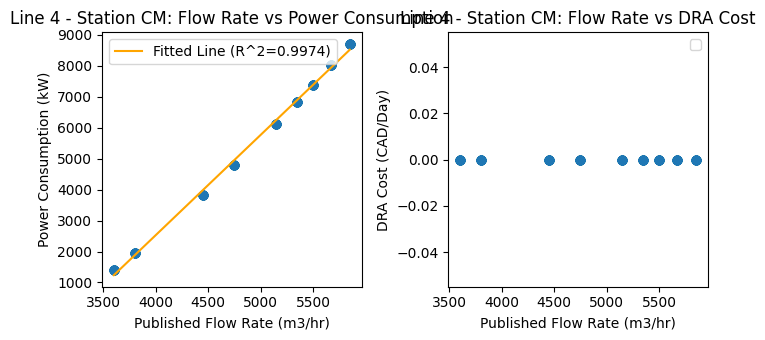

--------------------------------------------------
Line 4, GF  - Flow Rate Range: 3600 to 5850
Line 4, GF  - Power Consumption Range: 1842.3951613157988 to 9487.68470623414
Line 4, GF  - DRA Cost Range: 0.0 to 0.0
Line 4, GF - Polynomial Coefficients for PowerConsumptionkW: [ 3.37860170e+00 -1.07035457e+04]
Line 4, GF - R^2 for PowerConsumptionkW: 0.9878
Line 4, GF - Not enough unique values in DRA Cost for polynomial fitting.


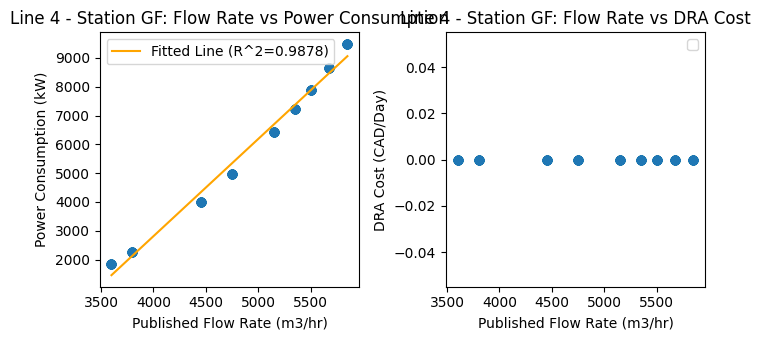

--------------------------------------------------
Line 4, CR  - Flow Rate Range: 3600 to 5850
Line 4, CR  - Power Consumption Range: 3177.9392223672617 to 9854.6235979345
Line 4, CR  - DRA Cost Range: 0.0 to 0.0
Line 4, CR - Polynomial Coefficients for PowerConsumptionkW: [ 2.90951770e+00 -7.71355251e+03]
Line 4, CR - R^2 for PowerConsumptionkW: 0.9774
Line 4, CR - Not enough unique values in DRA Cost for polynomial fitting.


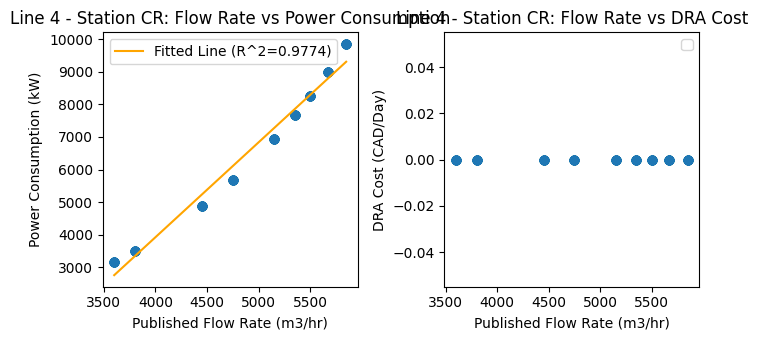

--------------------------------------------------
Line 4, HR  - Flow Rate Range: 3600 to 5850
Line 4, HR  - Power Consumption Range: 2346.881311029196 to 10252.58724768972
Line 4, HR  - DRA Cost Range: 0.0 to 0.0
Line 4, HR - Polynomial Coefficients for PowerConsumptionkW: [ 3.47800269e+00 -1.08810545e+04]
Line 4, HR - R^2 for PowerConsumptionkW: 0.9618
Line 4, HR - Not enough unique values in DRA Cost for polynomial fitting.


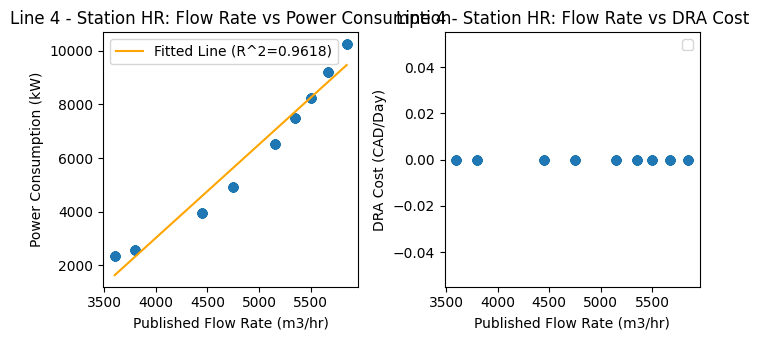

--------------------------------------------------
Line 4, CS  - Flow Rate Range: 3600 to 5850
Line 4, CS  - Power Consumption Range: 2710.425022020936 to 7620.872138642007
Line 4, CS  - DRA Cost Range: 0.0 to 0.0
Line 4, CS - Polynomial Coefficients for PowerConsumptionkW: [ 2.16628139e+00 -5.40837013e+03]
Line 4, CS - R^2 for PowerConsumptionkW: 0.9794
Line 4, CS - Not enough unique values in DRA Cost for polynomial fitting.


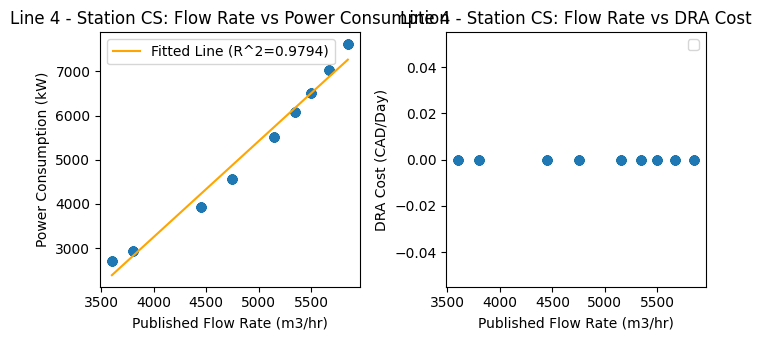

--------------------------------------------------
Line 4, LP  - Flow Rate Range: 3600 to 5850
Line 4, LP  - Power Consumption Range: 9442.39162338525 to 11639.758766460349
Line 4, LP  - DRA Cost Range: 0.0 to 0.0
Line 4, LP - Polynomial Coefficients for PowerConsumptionkW: [9.89592805e-01 6.13746225e+03]
Line 4, LP - R^2 for PowerConsumptionkW: 0.9388
Line 4, LP - Not enough unique values in DRA Cost for polynomial fitting.


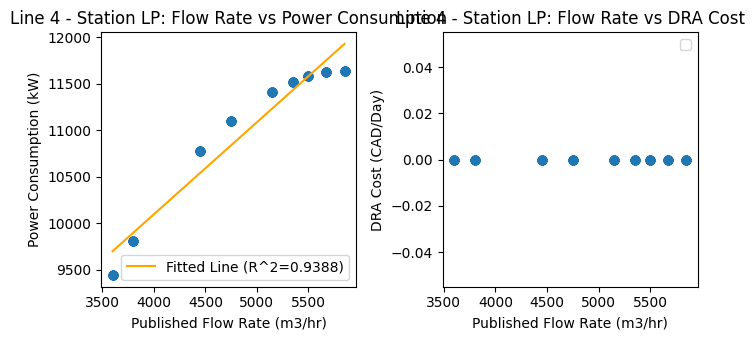

--------------------------------------------------
Line 4, FW  - Flow Rate Range: 3600 to 5850
Line 4, FW  - Power Consumption Range: 2795.565845534205 to 8184.892619787482
Line 4, FW  - DRA Cost Range: 0.0 to 7929.8328
Line 4, FW - Polynomial Coefficients for PowerConsumptionkW: [ 2.37018340e+00 -6.23450042e+03]
Line 4, FW - R^2 for PowerConsumptionkW: 0.9594
Line 4, FW - Polynomial Coefficients for DRA Cost: [ 2.60915735e+00 -1.09248262e+04]
Line 4, FW - R^2 for DRA Cost: 0.4973


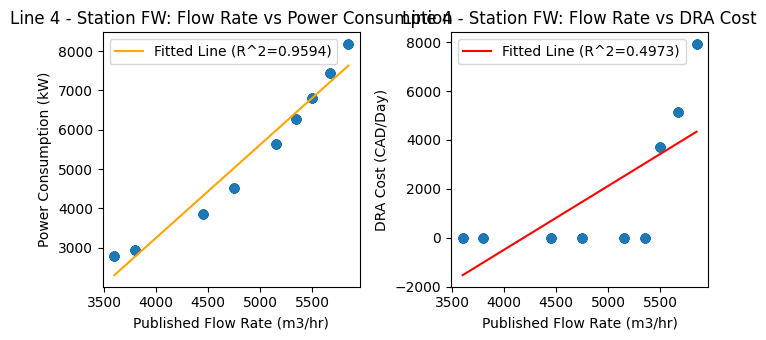

--------------------------------------------------
Line 4, MI  - Flow Rate Range: 3600 to 5850
Line 4, MI  - Power Consumption Range: 2563.3723722994328 to 9175.367132468617
Line 4, MI  - DRA Cost Range: 0.0 to 0.0
Line 4, MI - Polynomial Coefficients for PowerConsumptionkW: [ 2.95343064e+00 -7.77603887e+03]
Line 4, MI - R^2 for PowerConsumptionkW: 0.9906
Line 4, MI - Not enough unique values in DRA Cost for polynomial fitting.


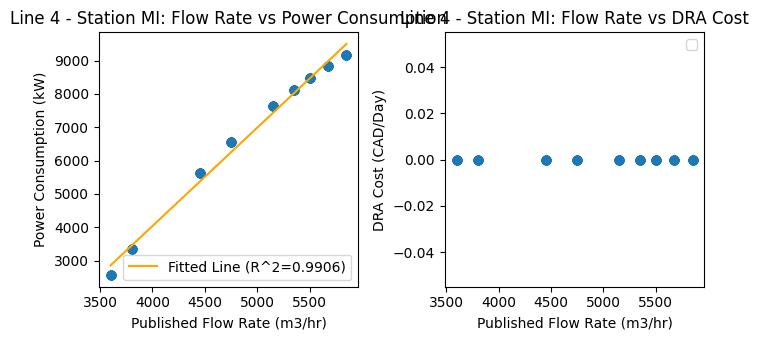

--------------------------------------------------
Line 4, EP  - Flow Rate Range: 3600 to 5850
Line 4, EP  - Power Consumption Range: 4797.423094898462 to 12005.028862020466
Line 4, EP  - DRA Cost Range: 0.0 to 0.0
Line 4, EP - Polynomial Coefficients for PowerConsumptionkW: [ 3.17305727e+00 -7.22714288e+03]
Line 4, EP - R^2 for PowerConsumptionkW: 0.9666
Line 4, EP - Not enough unique values in DRA Cost for polynomial fitting.


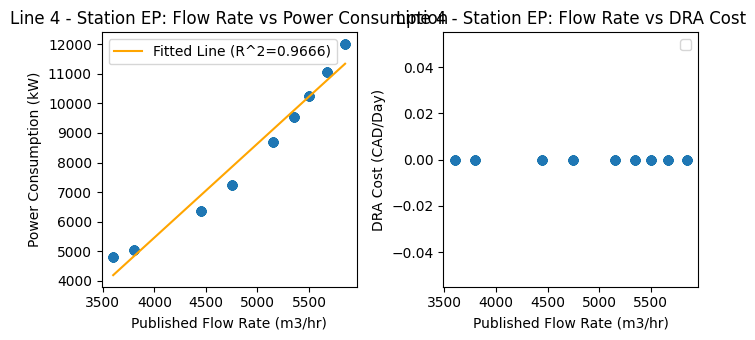

--------------------------------------------------
Line 4, YP  - Flow Rate Range: 3600 to 5850
Line 4, YP  - Power Consumption Range: 6912.260072539836 to 8756.588565407532
Line 4, YP  - DRA Cost Range: 0.0 to 0.0
Line 4, YP - Polynomial Coefficients for PowerConsumptionkW: [8.17942852e-01 3.94171667e+03]
Line 4, YP - R^2 for PowerConsumptionkW: 0.9990
Line 4, YP - Not enough unique values in DRA Cost for polynomial fitting.


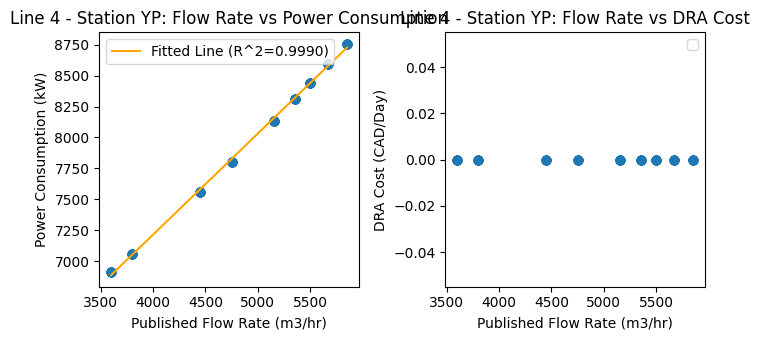

--------------------------------------------------
Line 4, PL  - Flow Rate Range: 3600 to 5850
Line 4, PL  - Power Consumption Range: 2656.414089418948 to 8042.585043993429
Line 4, PL  - DRA Cost Range: 0.0 to 0.0
Line 4, PL - Polynomial Coefficients for PowerConsumptionkW: [ 2.38499933e+00 -6.10524084e+03]
Line 4, PL - R^2 for PowerConsumptionkW: 0.9948
Line 4, PL - Not enough unique values in DRA Cost for polynomial fitting.


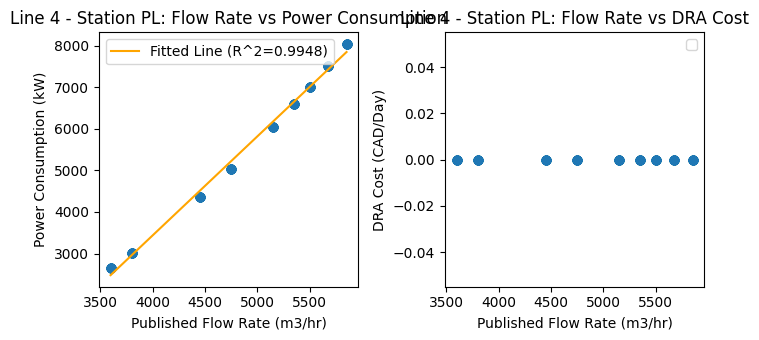

--------------------------------------------------
Line 4, KB  - Flow Rate Range: 3600 to 5850
Line 4, KB  - Power Consumption Range: 2679.1131496317685 to 8594.531658858352
Line 4, KB  - DRA Cost Range: 0.0 to 0.0
Line 4, KB - Polynomial Coefficients for PowerConsumptionkW: [ 2.62465593e+00 -6.85731320e+03]
Line 4, KB - R^2 for PowerConsumptionkW: 0.9989
Line 4, KB - Not enough unique values in DRA Cost for polynomial fitting.


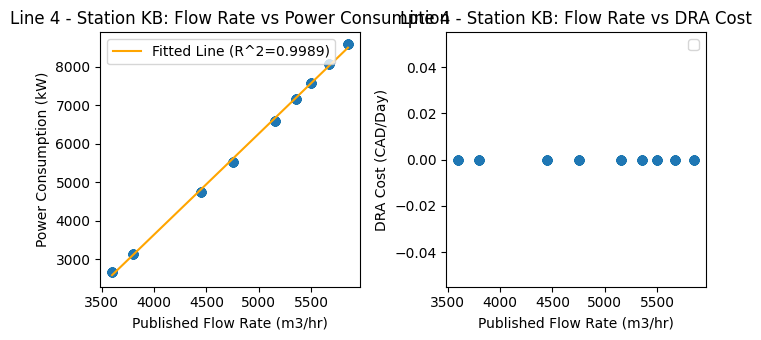

--------------------------------------------------
Line 4, OD  - Flow Rate Range: 3600 to 5850
Line 4, OD  - Power Consumption Range: 2469.534181602299 to 8980.050759424572
Line 4, OD  - DRA Cost Range: 0.0 to 0.0
Line 4, OD - Polynomial Coefficients for PowerConsumptionkW: [ 2.88092601e+00 -8.15249498e+03]
Line 4, OD - R^2 for PowerConsumptionkW: 0.9928
Line 4, OD - Not enough unique values in DRA Cost for polynomial fitting.


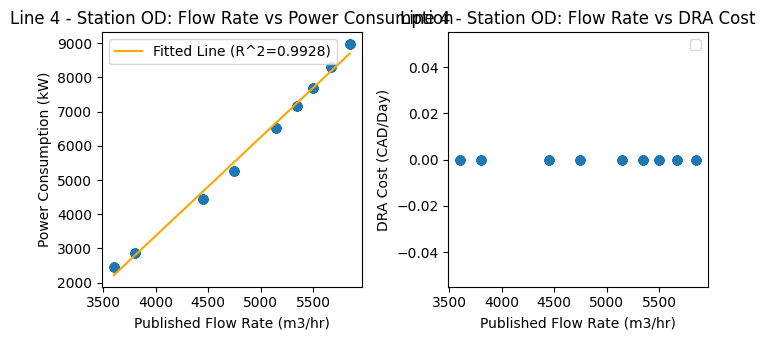

--------------------------------------------------
Line 4, LB  - Flow Rate Range: 3600 to 5850
Line 4, LB  - Power Consumption Range: 2529.679932922125 to 9035.1842970117
Line 4, LB  - DRA Cost Range: 0.0 to 0.0
Line 4, LB - Polynomial Coefficients for PowerConsumptionkW: [ 2.87431388e+00 -8.15552648e+03]
Line 4, LB - R^2 for PowerConsumptionkW: 0.9869
Line 4, LB - Not enough unique values in DRA Cost for polynomial fitting.


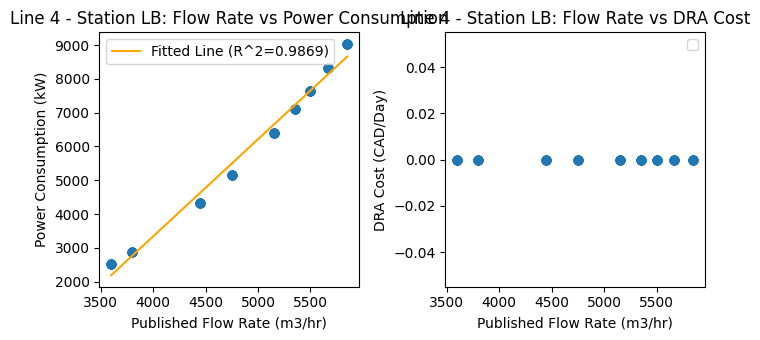

--------------------------------------------------
Line 4, SP  - Flow Rate Range: 3600 to 5850
Line 4, SP  - Power Consumption Range: 2613.0504191964865 to 8273.151299129939
Line 4, SP  - DRA Cost Range: 0.0 to 0.0
Line 4, SP - Polynomial Coefficients for PowerConsumptionkW: [ 2.49270973e+00 -6.81481768e+03]
Line 4, SP - R^2 for PowerConsumptionkW: 0.9691
Line 4, SP - Not enough unique values in DRA Cost for polynomial fitting.


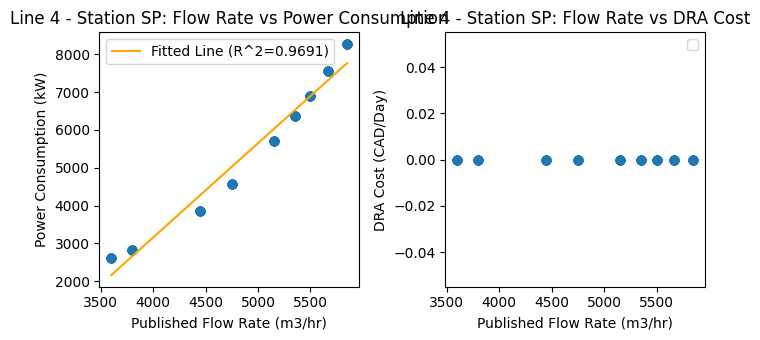

--------------------------------------------------
Line 4, ZP  - Flow Rate Range: 3600 to 5850
Line 4, ZP  - Power Consumption Range: 2481.7232202858945 to 9109.156415878966
Line 4, ZP  - DRA Cost Range: 0.0 to 0.0
Line 4, ZP - Polynomial Coefficients for PowerConsumptionkW: [ 2.87394557e+00 -8.33225891e+03]
Line 4, ZP - R^2 for PowerConsumptionkW: 0.9704
Line 4, ZP - Not enough unique values in DRA Cost for polynomial fitting.


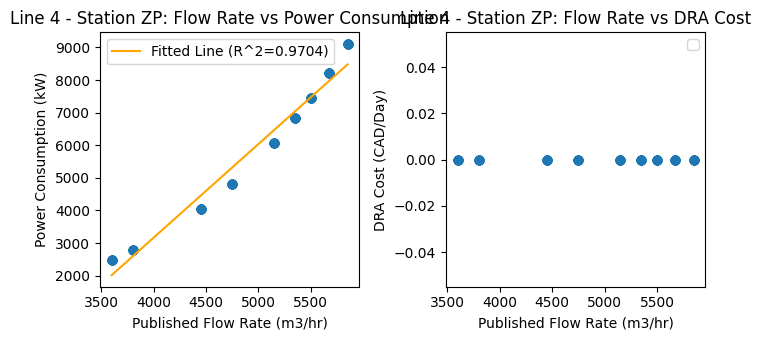

--------------------------------------------------
Line 4, DR  - Flow Rate Range: 3600 to 5850
Line 4, DR  - Power Consumption Range: 2190.672704488039 to 8260.287345216144
Line 4, DR  - DRA Cost Range: 0.0 to 0.0
Line 4, DR - Polynomial Coefficients for PowerConsumptionkW: [ 2.68972276e+00 -7.64872977e+03]
Line 4, DR - R^2 for PowerConsumptionkW: 0.9968
Line 4, DR - Not enough unique values in DRA Cost for polynomial fitting.


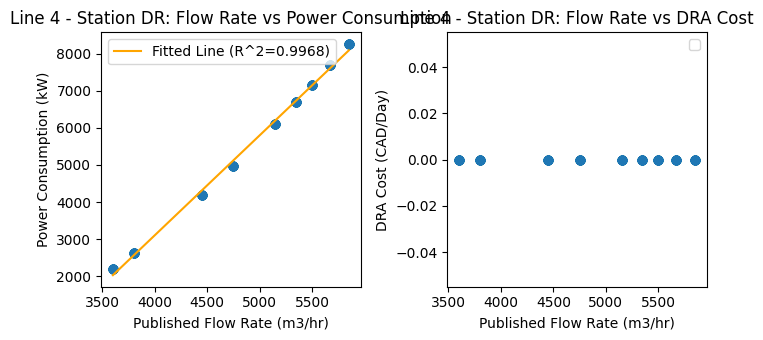

--------------------------------------------------
Line 4, VG  - Flow Rate Range: 3600 to 5850
Line 4, VG  - Power Consumption Range: 3451.779070790857 to 9712.455800887605
Line 4, VG  - DRA Cost Range: 0.0 to 0.0
Line 4, VG - Polynomial Coefficients for PowerConsumptionkW: [ 2.78431955e+00 -6.53613051e+03]
Line 4, VG - R^2 for PowerConsumptionkW: 0.9998
Line 4, VG - Not enough unique values in DRA Cost for polynomial fitting.


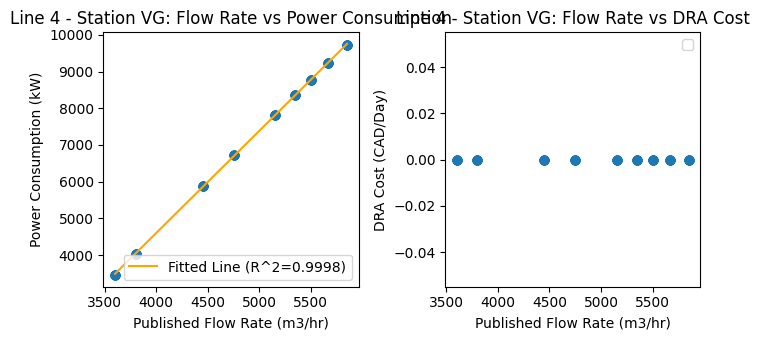

--------------------------------------------------
Line 4, ME  - Flow Rate Range: 3600 to 5850
Line 4, ME  - Power Consumption Range: 2401.726327762008 to 11927.349986288464
Line 4, ME  - DRA Cost Range: 0.0 to 0.0
Line 4, ME - Polynomial Coefficients for PowerConsumptionkW: [ 4.21414583e+00 -1.31553460e+04]
Line 4, ME - R^2 for PowerConsumptionkW: 0.9920
Line 4, ME - Not enough unique values in DRA Cost for polynomial fitting.


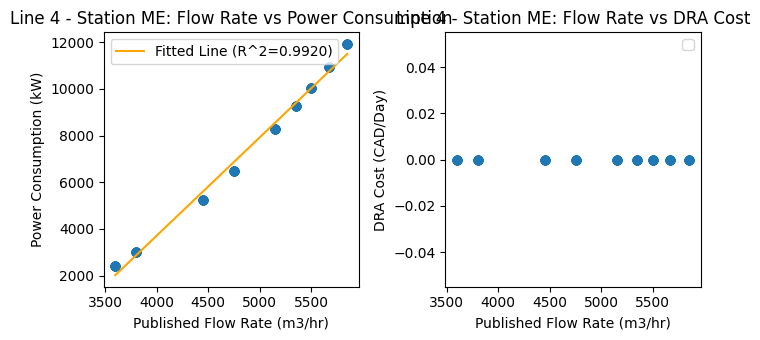

--------------------------------------------------
Line 4, KG  - Flow Rate Range: 3600 to 5850
Line 4, KG  - Power Consumption Range: 1457.3647136837244 to 10317.90672318102
Line 4, KG  - DRA Cost Range: 0.0 to 0.0
Line 4, KG - Polynomial Coefficients for PowerConsumptionkW: [ 3.92047549e+00 -1.30043748e+04]
Line 4, KG - R^2 for PowerConsumptionkW: 0.9925
Line 4, KG - Not enough unique values in DRA Cost for polynomial fitting.


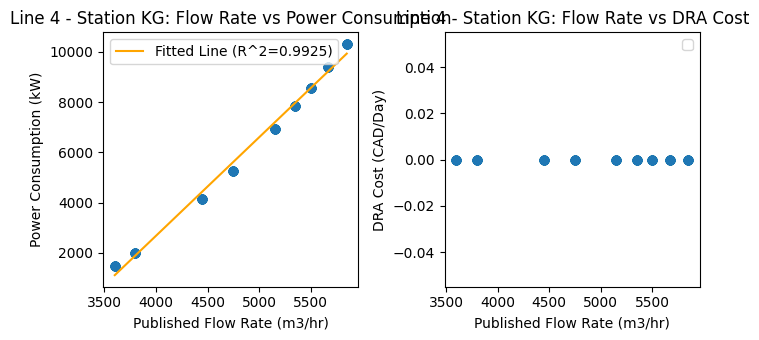

--------------------------------------------------
Line 4, DN  - Flow Rate Range: 3600 to 5850
Line 4, DN  - Power Consumption Range: 2917.2316084727645 to 8246.003156803898
Line 4, DN  - DRA Cost Range: 0.0 to 0.0
Line 4, DN - Polynomial Coefficients for PowerConsumptionkW: [ 2.35416762e+00 -5.83898624e+03]
Line 4, DN - R^2 for PowerConsumptionkW: 0.9865
Line 4, DN - Not enough unique values in DRA Cost for polynomial fitting.


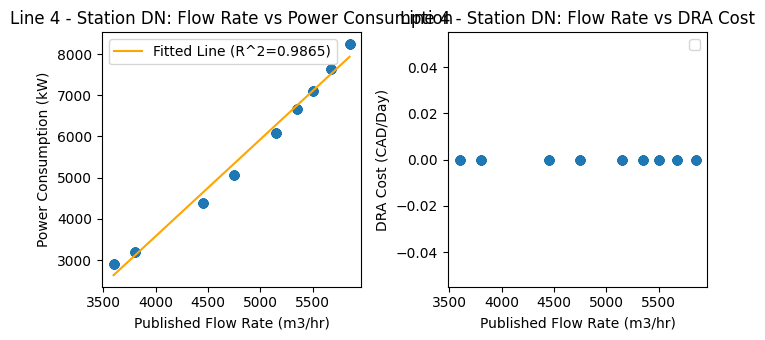

--------------------------------------------------
Line 4, QU  - Flow Rate Range: 3600 to 5850
Line 4, QU  - Power Consumption Range: 3472.6701407460496 to 10009.223246127294
Line 4, QU  - DRA Cost Range: 0.0 to 0.0
Line 4, QU - Polynomial Coefficients for PowerConsumptionkW: [ 2.90373556e+00 -7.00853481e+03]
Line 4, QU - R^2 for PowerConsumptionkW: 0.9999
Line 4, QU - Not enough unique values in DRA Cost for polynomial fitting.


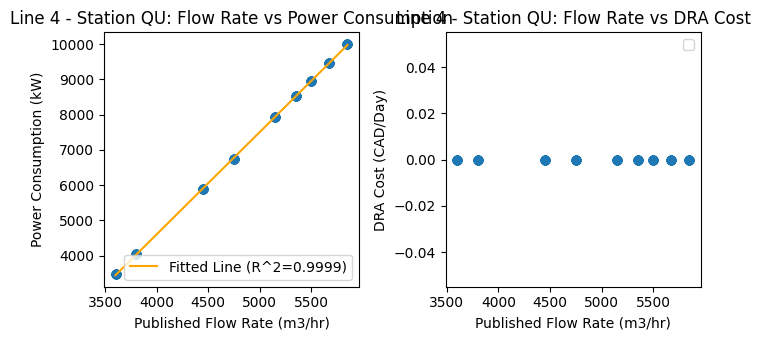

--------------------------------------------------
Line 4, LO  - Flow Rate Range: 3600 to 5850
Line 4, LO  - Power Consumption Range: 2145.0191303938627 to 7767.6673179285135
Line 4, LO  - DRA Cost Range: 0.0 to 0.0
Line 4, LO - Polynomial Coefficients for PowerConsumptionkW: [ 2.49097683e+00 -6.98076630e+03]
Line 4, LO - R^2 for PowerConsumptionkW: 0.9961
Line 4, LO - Not enough unique values in DRA Cost for polynomial fitting.


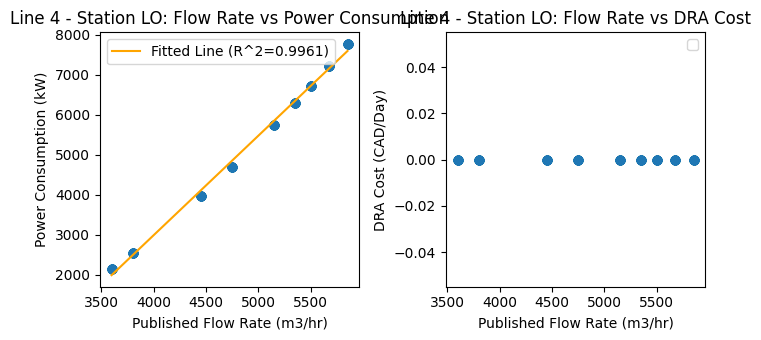

--------------------------------------------------
Line 4, ST  - Flow Rate Range: 3600 to 5850
Line 4, ST  - Power Consumption Range: 2770.8692599185774 to 11159.6036997847
Line 4, ST  - DRA Cost Range: 0.0 to 0.0
Line 4, ST - Polynomial Coefficients for PowerConsumptionkW: [ 3.62720438e+00 -1.09152313e+04]
Line 4, ST - R^2 for PowerConsumptionkW: 0.9662
Line 4, ST - Not enough unique values in DRA Cost for polynomial fitting.


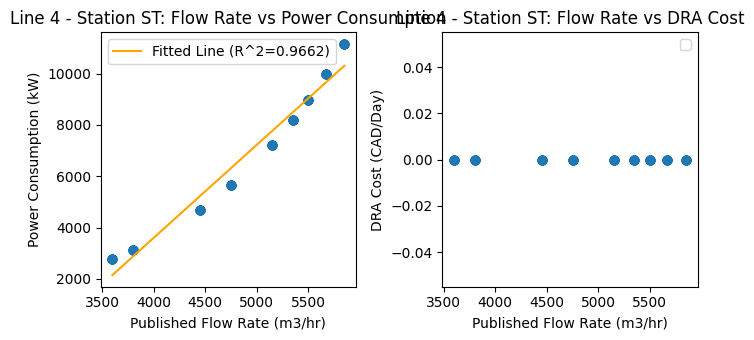

--------------------------------------------------
Line 4, CK  - Flow Rate Range: 3600 to 5850
Line 4, CK  - Power Consumption Range: 2333.3485886901617 to 7725.326717125019
Line 4, CK  - DRA Cost Range: 0.0 to 3731.6856
Line 4, CK - Polynomial Coefficients for PowerConsumptionkW: [ 2.38644155e+00 -6.45608910e+03]
Line 4, CK - R^2 for PowerConsumptionkW: 0.9934
Line 4, CK - Polynomial Coefficients for DRA Cost: [ 6.74274346e-01 -2.89081095e+03]
Line 4, CK - R^2 for DRA Cost: 0.1927


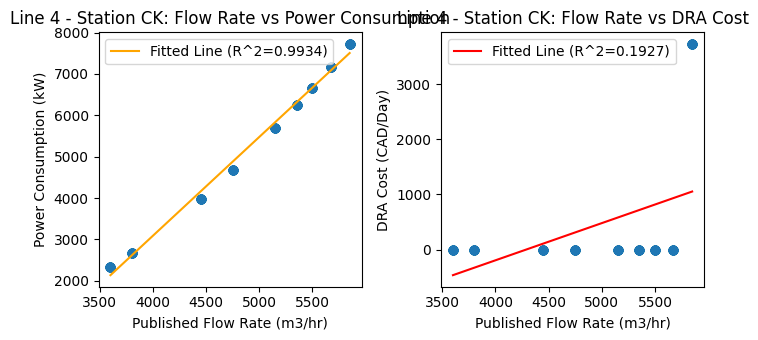

--------------------------------------------------
Line 4, AP  - Flow Rate Range: 3600 to 5850
Line 4, AP  - Power Consumption Range: 2149.395041719079 to 8783.25810842053
Line 4, AP  - DRA Cost Range: 0.0 to 0.0
Line 4, AP - Polynomial Coefficients for PowerConsumptionkW: [ 2.94004466e+00 -8.60019636e+03]
Line 4, AP - R^2 for PowerConsumptionkW: 0.9970
Line 4, AP - Not enough unique values in DRA Cost for polynomial fitting.


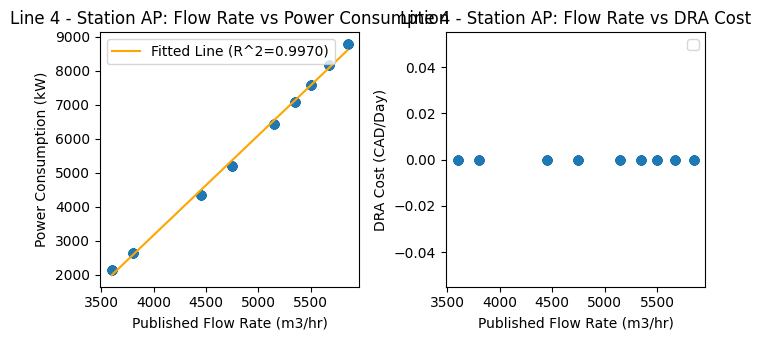

--------------------------------------------------
Line 67, ST  - Flow Rate Range: 2980 to 5950
Line 67, ST  - Power Consumption Range: 2097.660897480324 to 13566.425523121376
Line 67, ST  - DRA Cost Range: 0.0 to 0.0
Line 67, ST - Polynomial Coefficients for PowerConsumptionkW: [ 3.87748269e+00 -1.01697191e+04]
Line 67, ST - R^2 for PowerConsumptionkW: 0.9874
Line 67, ST - Not enough unique values in DRA Cost for polynomial fitting.


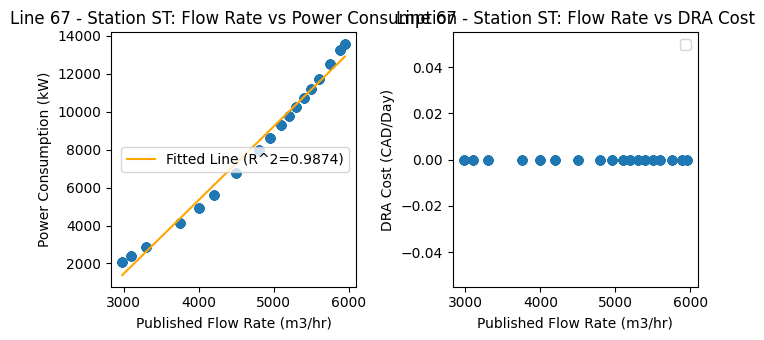

--------------------------------------------------
Line 67, RT  - Flow Rate Range: 2980 to 5950
Line 67, RT  - Power Consumption Range: 1996.1845048787072 to 11203.38385590841
Line 67, RT  - DRA Cost Range: 0.0 to 0.0
Line 67, RT - Polynomial Coefficients for PowerConsumptionkW: [ 3.10586472e+00 -7.51833774e+03]
Line 67, RT - R^2 for PowerConsumptionkW: 0.9974
Line 67, RT - Not enough unique values in DRA Cost for polynomial fitting.


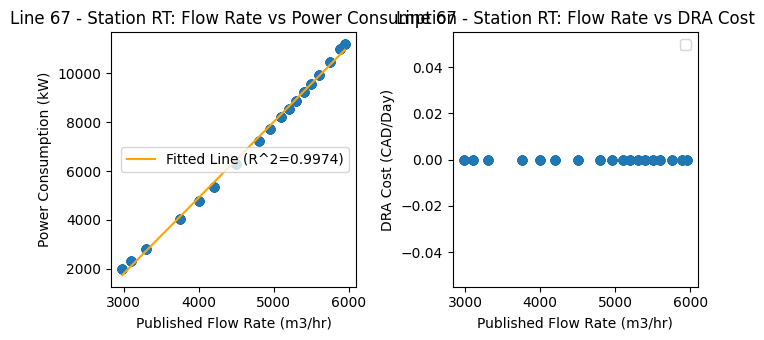

--------------------------------------------------
Line 67, KB  - Flow Rate Range: 2980 to 5950
Line 67, KB  - Power Consumption Range: 1503.4419237519614 to 11463.195649294066
Line 67, KB  - DRA Cost Range: 0.0 to 0.0
Line 67, KB - Polynomial Coefficients for PowerConsumptionkW: [ 3.36456328e+00 -9.01940588e+03]
Line 67, KB - R^2 for PowerConsumptionkW: 0.9919
Line 67, KB - Not enough unique values in DRA Cost for polynomial fitting.


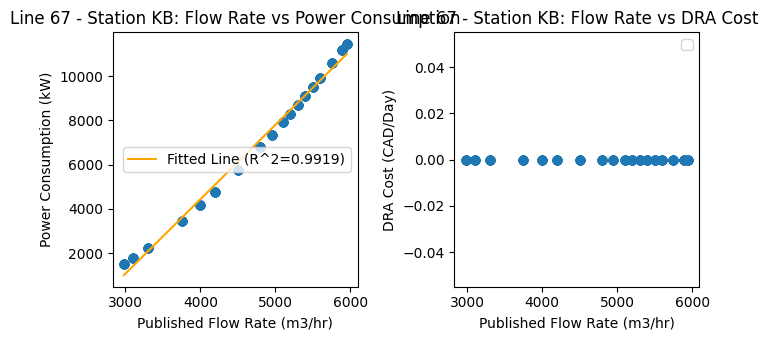

--------------------------------------------------
Line 67, BU  - Flow Rate Range: 2980 to 5950
Line 67, BU  - Power Consumption Range: 1564.9620976191943 to 11413.105979151209
Line 67, BU  - DRA Cost Range: 0.0 to 0.0
Line 67, BU - Polynomial Coefficients for PowerConsumptionkW: [ 3.32637426e+00 -8.81682945e+03]
Line 67, BU - R^2 for PowerConsumptionkW: 0.9926
Line 67, BU - Not enough unique values in DRA Cost for polynomial fitting.


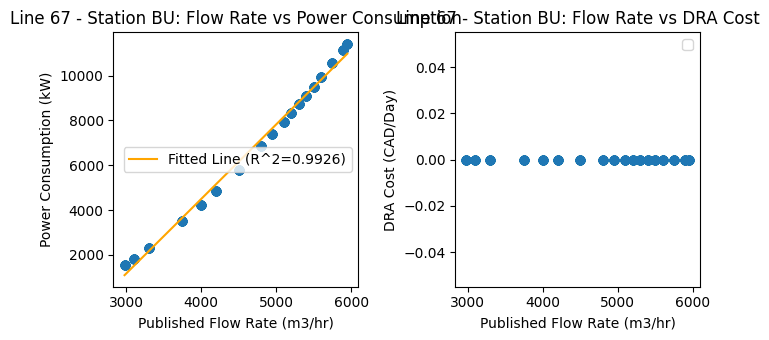

--------------------------------------------------
Line 67, ME  - Flow Rate Range: 2980 to 5950
Line 67, ME  - Power Consumption Range: 2302.4154201941565 to 15725.917971731396
Line 67, ME  - DRA Cost Range: 0.0 to 0.0
Line 67, ME - Polynomial Coefficients for PowerConsumptionkW: [ 4.54721593e+00 -1.24778386e+04]
Line 67, ME - R^2 for PowerConsumptionkW: 0.9732
Line 67, ME - Not enough unique values in DRA Cost for polynomial fitting.


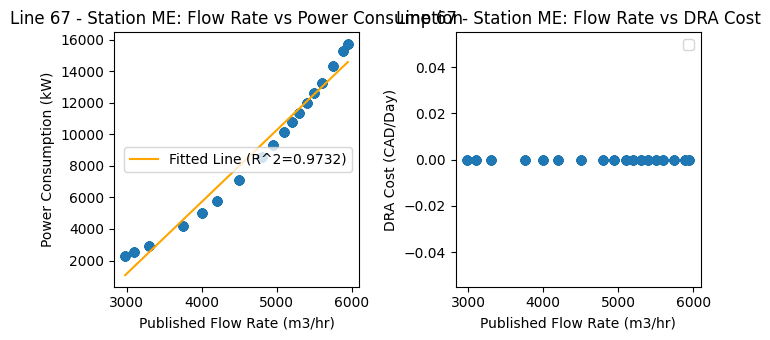

--------------------------------------------------
Line 67, AP  - Flow Rate Range: 2980 to 5950
Line 67, AP  - Power Consumption Range: 1274.2419350161215 to 11366.357975395746
Line 67, AP  - DRA Cost Range: 0.0 to 0.0
Line 67, AP - Polynomial Coefficients for PowerConsumptionkW: [ 3.40586562e+00 -9.22584228e+03]
Line 67, AP - R^2 for PowerConsumptionkW: 0.9960
Line 67, AP - Not enough unique values in DRA Cost for polynomial fitting.


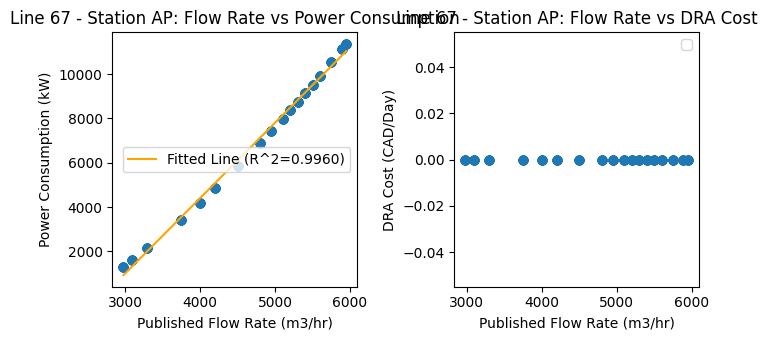

--------------------------------------------------
Line 67, EP  - Flow Rate Range: 2980 to 5950
Line 67, EP  - Power Consumption Range: 3277.057690959424 to 15814.755778293124
Line 67, EP  - DRA Cost Range: 0.0 to 0.0
Line 67, EP - Polynomial Coefficients for PowerConsumptionkW: [ 4.23578821e+00 -9.98637046e+03]
Line 67, EP - R^2 for PowerConsumptionkW: 0.9915
Line 67, EP - Not enough unique values in DRA Cost for polynomial fitting.


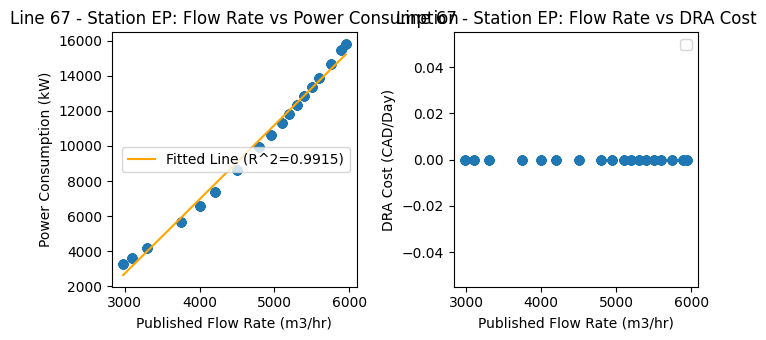

--------------------------------------------------
Line 67, CM  - Flow Rate Range: 2980 to 5950
Line 67, CM  - Power Consumption Range: 1331.0708566275423 to 10888.961748284404
Line 67, CM  - DRA Cost Range: 0.0 to 0.0
Line 67, CM - Polynomial Coefficients for PowerConsumptionkW: [ 3.22827558e+00 -8.74183649e+03]
Line 67, CM - R^2 for PowerConsumptionkW: 0.9926
Line 67, CM - Not enough unique values in DRA Cost for polynomial fitting.


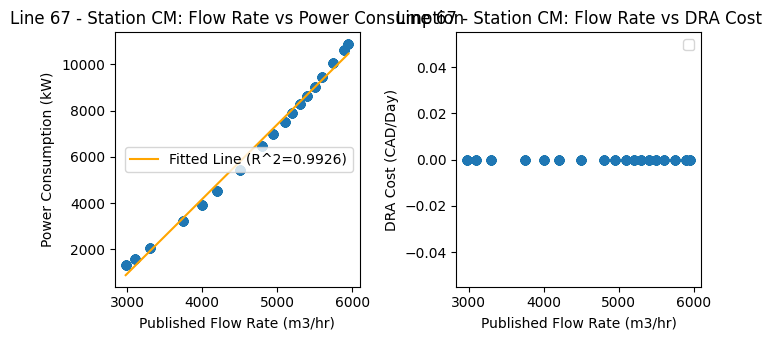

--------------------------------------------------
Line 67, FW  - Flow Rate Range: 2980 to 5950
Line 67, FW  - Power Consumption Range: 713.3117697015405 to 5001.387766385451
Line 67, FW  - DRA Cost Range: 0.0 to 6705.84
Line 67, FW - Polynomial Coefficients for PowerConsumptionkW: [ 1.43385135e+00 -3.11519484e+03]
Line 67, FW - R^2 for PowerConsumptionkW: 0.9651
Line 67, FW - Polynomial Coefficients for DRA Cost: [ 8.78003765e-01 -3.50169295e+03]
Line 67, FW - R^2 for DRA Cost: 0.1942


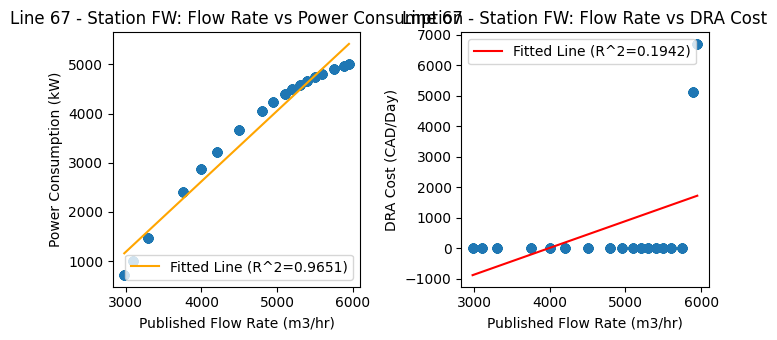

--------------------------------------------------
Line 67, SW  - Flow Rate Range: 2980 to 5950
Line 67, SW  - Power Consumption Range: 1961.2102208174765 to 12597.113606736995
Line 67, SW  - DRA Cost Range: 0.0 to 0.0
Line 67, SW - Polynomial Coefficients for PowerConsumptionkW: [ 3.6053492e+00 -9.8656738e+03]
Line 67, SW - R^2 for PowerConsumptionkW: 0.9671
Line 67, SW - Not enough unique values in DRA Cost for polynomial fitting.


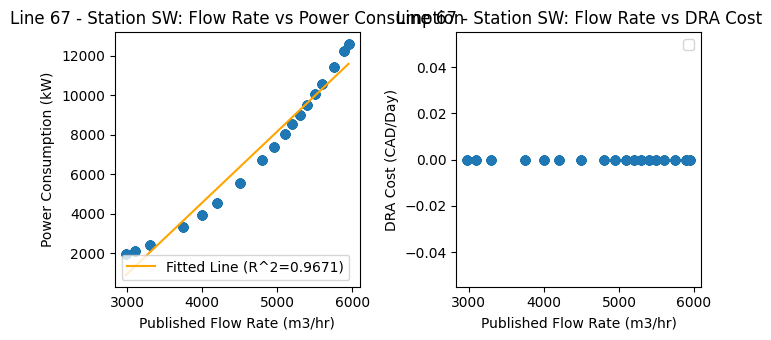

--------------------------------------------------
Line 67, LB  - Flow Rate Range: 2980 to 5950
Line 67, LB  - Power Consumption Range: 1100.263415692374 to 11650.096260554625
Line 67, LB  - DRA Cost Range: 0.0 to 5131.068
Line 67, LB - Polynomial Coefficients for PowerConsumptionkW: [ 3.56767345e+00 -1.02258069e+04]
Line 67, LB - R^2 for PowerConsumptionkW: 0.9859
Line 67, LB - Polynomial Coefficients for DRA Cost: [ 7.58634961e-01 -3.02370373e+03]
Line 67, LB - R^2 for DRA Cost: 0.1967


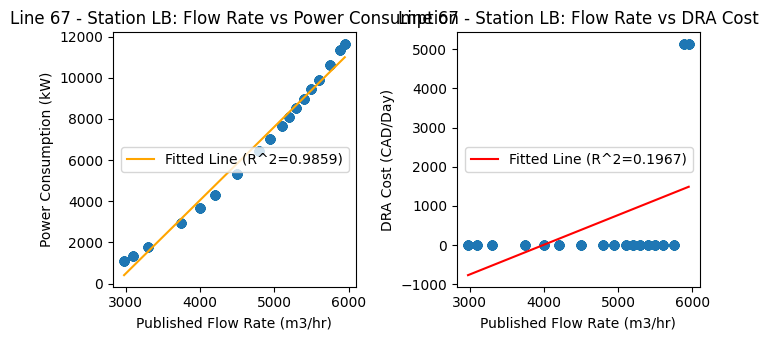

--------------------------------------------------
Line 67, HR  - Flow Rate Range: 2980 to 5950
Line 67, HR  - Power Consumption Range: 1901.6529493806884 to 12517.317401782377
Line 67, HR  - DRA Cost Range: 0.0 to 0.0
Line 67, HR - Polynomial Coefficients for PowerConsumptionkW: [ 3.59523234e+00 -9.74752673e+03]
Line 67, HR - R^2 for PowerConsumptionkW: 0.9751
Line 67, HR - Not enough unique values in DRA Cost for polynomial fitting.


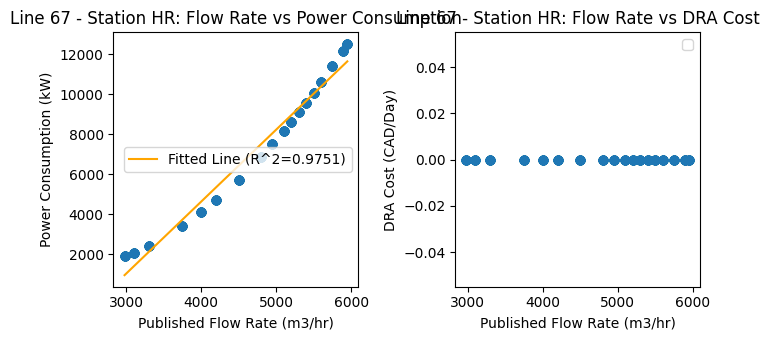

--------------------------------------------------
Line 67, DNS  - Flow Rate Range: 2980 to 5950
Line 67, DNS  - Power Consumption Range: 1867.5501091200856 to 10260.85240848409
Line 67, DNS  - DRA Cost Range: 0.0 to 0.0
Line 67, DNS - Polynomial Coefficients for PowerConsumptionkW: [ 2.83808791e+00 -7.12881987e+03]
Line 67, DNS - R^2 for PowerConsumptionkW: 0.9866
Line 67, DNS - Not enough unique values in DRA Cost for polynomial fitting.


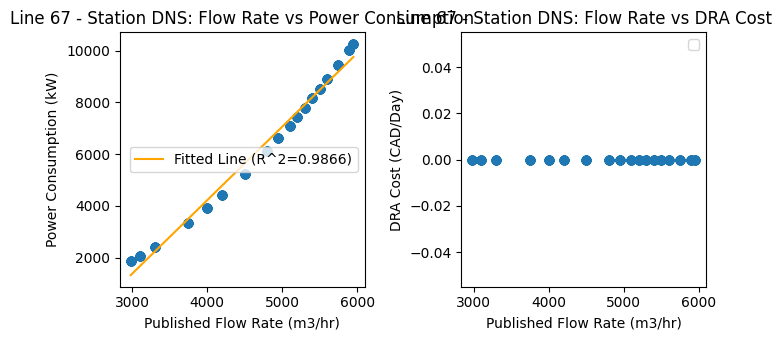

--------------------------------------------------
Line 67, DR  - Flow Rate Range: 2980 to 5950
Line 67, DR  - Power Consumption Range: 2963.47471206123 to 13853.172644222735
Line 67, DR  - DRA Cost Range: 0.0 to 2798.7648
Line 67, DR - Polynomial Coefficients for PowerConsumptionkW: [ 3.67999687e+00 -8.60307400e+03]
Line 67, DR - R^2 for PowerConsumptionkW: 0.9901
Line 67, DR - Polynomial Coefficients for DRA Cost: [ 2.12148304e-01 -8.49506727e+02]
Line 67, DR - R^2 for DRA Cost: 0.0973


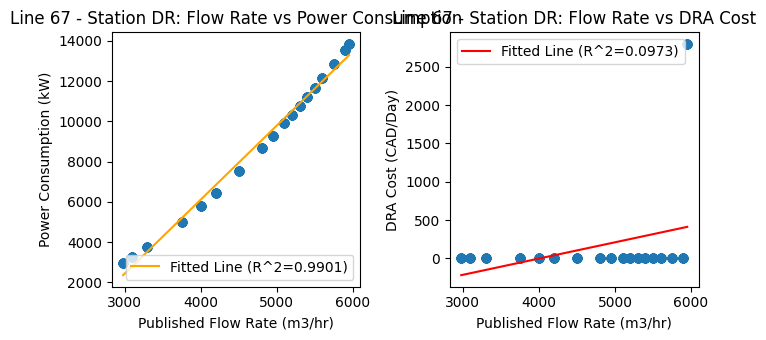

--------------------------------------------------
Line 67, KG  - Flow Rate Range: 2980 to 5950
Line 67, KG  - Power Consumption Range: 1756.316025472246 to 13285.852618021658
Line 67, KG  - DRA Cost Range: 0.0 to 0.0
Line 67, KG - Polynomial Coefficients for PowerConsumptionkW: [ 3.90397851e+00 -1.08596244e+04]
Line 67, KG - R^2 for PowerConsumptionkW: 0.9767
Line 67, KG - Not enough unique values in DRA Cost for polynomial fitting.


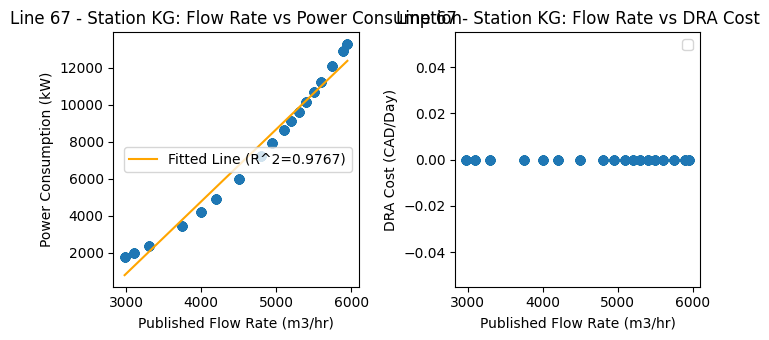

--------------------------------------------------
Line 67, ZP  - Flow Rate Range: 2980 to 5950
Line 67, ZP  - Power Consumption Range: 1207.11325427657 to 10012.354250618606
Line 67, ZP  - DRA Cost Range: 0.0 to 0.0
Line 67, ZP - Polynomial Coefficients for PowerConsumptionkW: [ 2.97317578e+00 -8.03042777e+03]
Line 67, ZP - R^2 for PowerConsumptionkW: 0.9940
Line 67, ZP - Not enough unique values in DRA Cost for polynomial fitting.


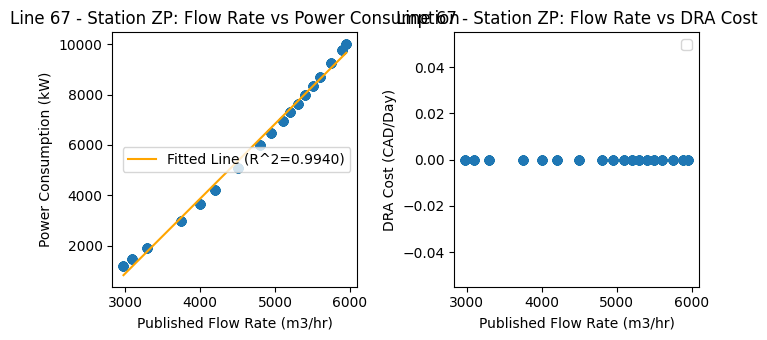

--------------------------------------------------
Line 67, VG  - Flow Rate Range: 2980 to 5950
Line 67, VG  - Power Consumption Range: 960.4190482376144 to 8686.851121292217
Line 67, VG  - DRA Cost Range: 0.0 to 0.0
Line 67, VG - Polynomial Coefficients for PowerConsumptionkW: [ 2.61676173e+00 -7.51979295e+03]
Line 67, VG - R^2 for PowerConsumptionkW: 0.9750
Line 67, VG - Not enough unique values in DRA Cost for polynomial fitting.


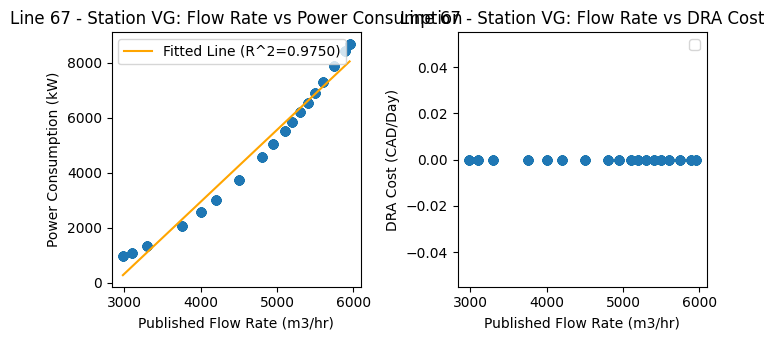

--------------------------------------------------
Line 67, PLN  - Flow Rate Range: 2980 to 5950
Line 67, PLN  - Power Consumption Range: 1205.0530784236323 to 8867.35974496857
Line 67, PLN  - DRA Cost Range: 0.0 to 0.0
Line 67, PLN - Polynomial Coefficients for PowerConsumptionkW: [ 2.58074928e+00 -6.52347174e+03]
Line 67, PLN - R^2 for PowerConsumptionkW: 0.9999
Line 67, PLN - Not enough unique values in DRA Cost for polynomial fitting.


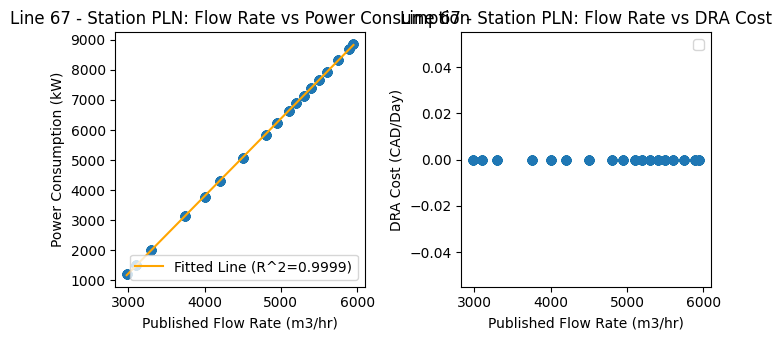

--------------------------------------------------
Line 67, CC  - Flow Rate Range: 2980 to 5950
Line 67, CC  - Power Consumption Range: 2035.8273626482116 to 12331.117237524828
Line 67, CC  - DRA Cost Range: 0.0 to 0.0
Line 67, CC - Polynomial Coefficients for PowerConsumptionkW: [ 3.48684721e+00 -9.26735792e+03]
Line 67, CC - R^2 for PowerConsumptionkW: 0.9749
Line 67, CC - Not enough unique values in DRA Cost for polynomial fitting.


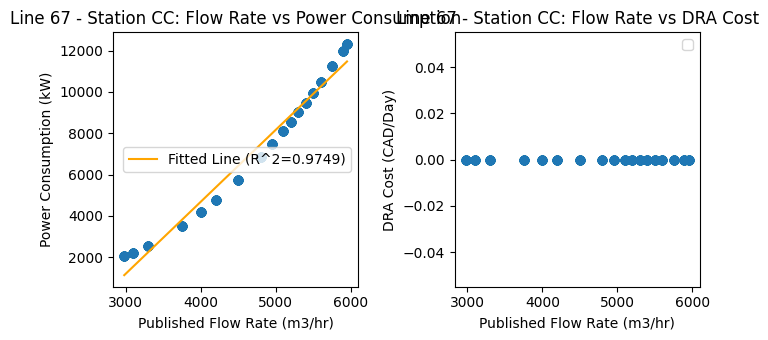

--------------------------------------------------
Line 67, GF  - Flow Rate Range: 2980 to 5950
Line 67, GF  - Power Consumption Range: 2411.77913506655 to 11004.394467725302
Line 67, GF  - DRA Cost Range: 0.0 to 0.0
Line 67, GF - Polynomial Coefficients for PowerConsumptionkW: [ 2.90684657e+00 -6.86321137e+03]
Line 67, GF - R^2 for PowerConsumptionkW: 0.9835
Line 67, GF - Not enough unique values in DRA Cost for polynomial fitting.


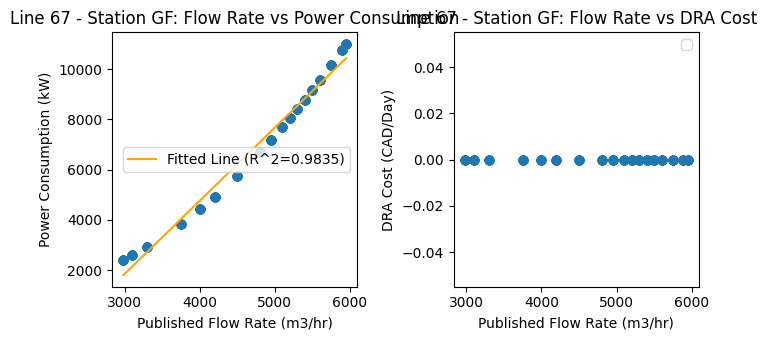

--------------------------------------------------
Line 67, CS  - Flow Rate Range: 2980 to 5950
Line 67, CS  - Power Consumption Range: 2279.946884199977 to 9092.518550943583
Line 67, CS  - DRA Cost Range: 0.0 to 0.0
Line 67, CS - Polynomial Coefficients for PowerConsumptionkW: [ 2.30864272e+00 -5.26321929e+03]
Line 67, CS - R^2 for PowerConsumptionkW: 0.9698
Line 67, CS - Not enough unique values in DRA Cost for polynomial fitting.


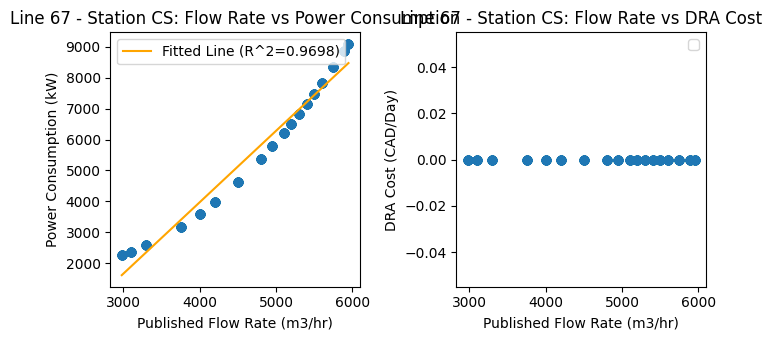

--------------------------------------------------
Line 67, MI  - Flow Rate Range: 2980 to 5950
Line 67, MI  - Power Consumption Range: 1924.7605469441623 to 11798.210418195013
Line 67, MI  - DRA Cost Range: 0.0 to 0.0
Line 67, MI - Polynomial Coefficients for PowerConsumptionkW: [ 3.32591112e+00 -8.05424648e+03]
Line 67, MI - R^2 for PowerConsumptionkW: 0.9998
Line 67, MI - Not enough unique values in DRA Cost for polynomial fitting.


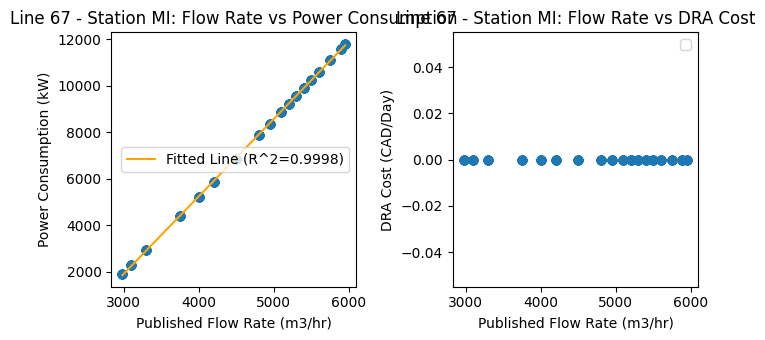

--------------------------------------------------
Line 67, YP  - Flow Rate Range: 2980 to 5950
Line 67, YP  - Power Consumption Range: 2587.030642244965 to 12453.98158363346
Line 67, YP  - DRA Cost Range: 0.0 to 0.0
Line 67, YP - Polynomial Coefficients for PowerConsumptionkW: [ 3.33596756e+00 -7.96905332e+03]
Line 67, YP - R^2 for PowerConsumptionkW: 0.9874
Line 67, YP - Not enough unique values in DRA Cost for polynomial fitting.


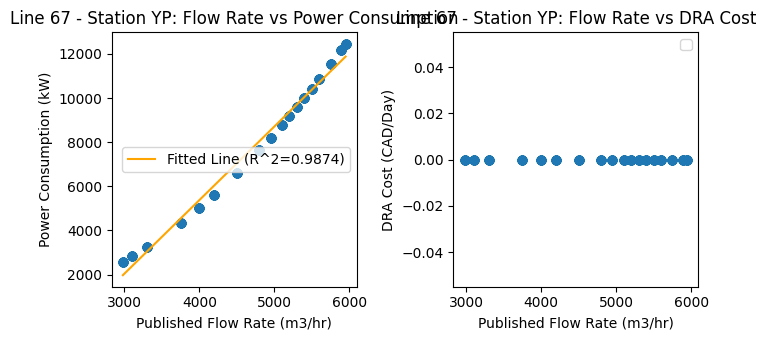

--------------------------------------------------
Line 67, OD  - Flow Rate Range: 2980 to 5950
Line 67, OD  - Power Consumption Range: 1986.3065793924036 to 10345.93689426314
Line 67, OD  - DRA Cost Range: 0.0 to 0.0
Line 67, OD - Polynomial Coefficients for PowerConsumptionkW: [ 2.83168690e+00 -7.21155245e+03]
Line 67, OD - R^2 for PowerConsumptionkW: 0.9736
Line 67, OD - Not enough unique values in DRA Cost for polynomial fitting.


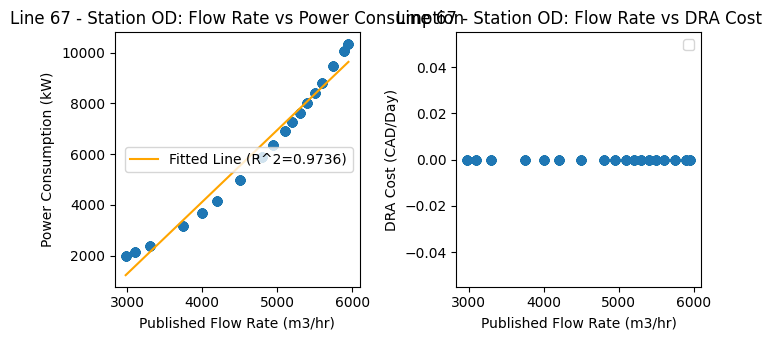

--------------------------------------------------
Line 67, LO  - Flow Rate Range: 2980 to 5950
Line 67, LO  - Power Consumption Range: 610.0935564115644 to 10099.792937489226
Line 67, LO  - DRA Cost Range: 0.0 to 0.0
Line 67, LO - Polynomial Coefficients for PowerConsumptionkW: [ 3.21166279e+00 -9.69691531e+03]
Line 67, LO - R^2 for PowerConsumptionkW: 0.9806
Line 67, LO - Not enough unique values in DRA Cost for polynomial fitting.


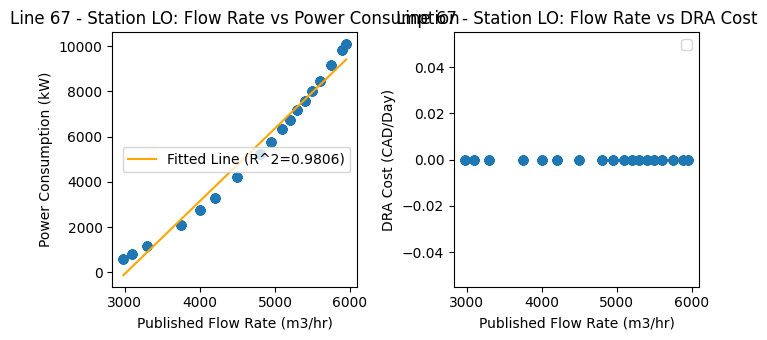

--------------------------------------------------
Line 67, CR  - Flow Rate Range: 2980 to 5950
Line 67, CR  - Power Consumption Range: 2609.666175253224 to 13002.590445291136
Line 67, CR  - DRA Cost Range: 0.0 to 0.0
Line 67, CR - Polynomial Coefficients for PowerConsumptionkW: [ 3.50882418e+00 -8.27213543e+03]
Line 67, CR - R^2 for PowerConsumptionkW: 0.9945
Line 67, CR - Not enough unique values in DRA Cost for polynomial fitting.


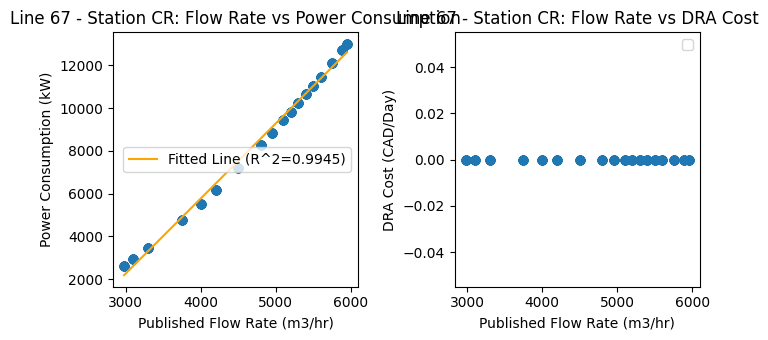

--------------------------------------------------
Line 67, CK  - Flow Rate Range: 2980 to 5950
Line 67, CK  - Power Consumption Range: 2104.559960724786 to 11327.910864882637
Line 67, CK  - DRA Cost Range: 0.0 to 0.0
Line 67, CK - Polynomial Coefficients for PowerConsumptionkW: [ 3.12663973e+00 -8.15714237e+03]
Line 67, CK - R^2 for PowerConsumptionkW: 0.9668
Line 67, CK - Not enough unique values in DRA Cost for polynomial fitting.


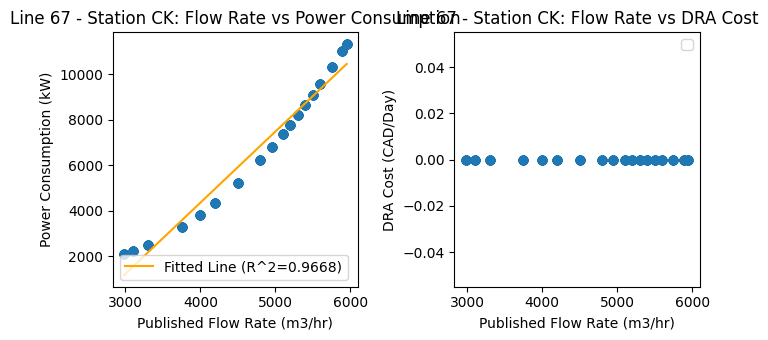

--------------------------------------------------
Line 67, LP  - Flow Rate Range: 2980 to 5950
Line 67, LP  - Power Consumption Range: 1956.9435339806369 to 11310.154695759382
Line 67, LP  - DRA Cost Range: 0.0 to 0.0
Line 67, LP - Polynomial Coefficients for PowerConsumptionkW: [ 3.15113078e+00 -7.51838522e+03]
Line 67, LP - R^2 for PowerConsumptionkW: 0.9997
Line 67, LP - Not enough unique values in DRA Cost for polynomial fitting.


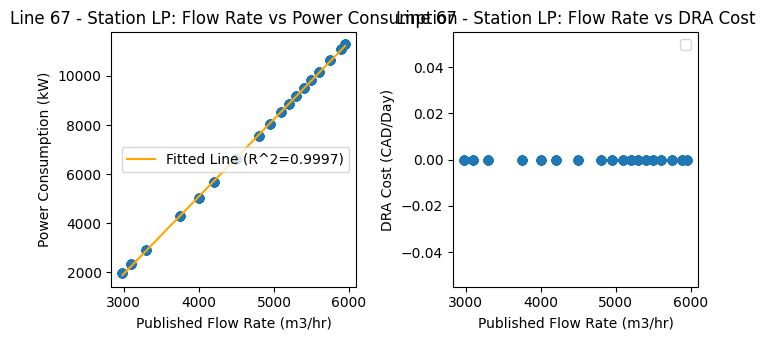

--------------------------------------------------
Line 2B, DN  - Flow Rate Range: 1500 to 3000
Line 2B, DN  - Power Consumption Range: 1108.529784962535 to 2642.003300845623
Line 2B, DN  - DRA Cost Range: 0.0 to 1816.6584
Line 2B, DN - Polynomial Coefficients for PowerConsumptionkW: [   1.07673437 -778.08532226]
Line 2B, DN - R^2 for PowerConsumptionkW: 0.9215
Line 2B, DN - Polynomial Coefficients for DRA Cost: [ 1.23805988e+00 -1.88443695e+03]
Line 2B, DN - R^2 for DRA Cost: 0.8746


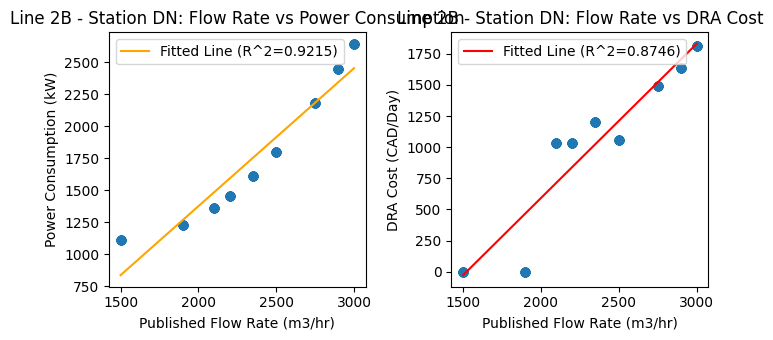

--------------------------------------------------
Line 2B, PL  - Flow Rate Range: 1500 to 3000
Line 2B, PL  - Power Consumption Range: 569.4900601217523 to 3286.0058208741248
Line 2B, PL  - DRA Cost Range: 0.0 to 2702.7768
Line 2B, PL - Polynomial Coefficients for PowerConsumptionkW: [ 1.83415825e+00 -2.29723938e+03]
Line 2B, PL - R^2 for PowerConsumptionkW: 0.9947
Line 2B, PL - Polynomial Coefficients for DRA Cost: [ 1.70357657e+00 -3.15303192e+03]
Line 2B, PL - R^2 for DRA Cost: 0.7759


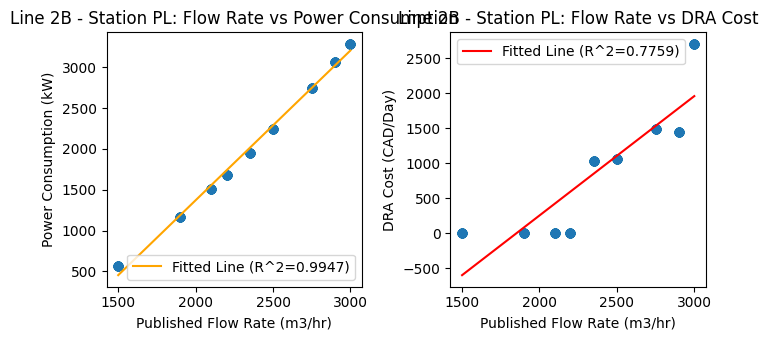

--------------------------------------------------
Line 2B, DR  - Flow Rate Range: 1500 to 3000
Line 2B, DR  - Power Consumption Range: 999.5096667292528 to 2848.288735581562
Line 2B, DR  - DRA Cost Range: 0.0 to 4297.9056
Line 2B, DR - Polynomial Coefficients for PowerConsumptionkW: [    1.27068683 -1096.9511053 ]
Line 2B, DR - R^2 for PowerConsumptionkW: 0.9708
Line 2B, DR - Polynomial Coefficients for DRA Cost: [ 2.86753453e+00 -5.47193157e+03]
Line 2B, DR - R^2 for DRA Cost: 0.7343


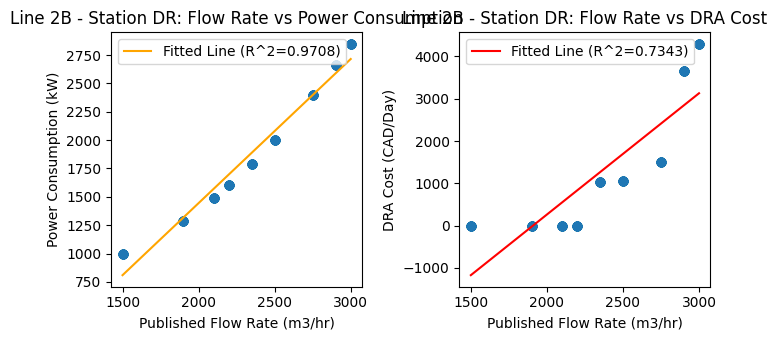

--------------------------------------------------
Line 2B, NC  - Flow Rate Range: 1500 to 3000
Line 2B, NC  - Power Consumption Range: 783.781330330763 to 3153.712501222268
Line 2B, NC  - DRA Cost Range: 0.0 to 2818.1568
Line 2B, NC - Polynomial Coefficients for PowerConsumptionkW: [ 1.61090983e+00 -1.78703211e+03]
Line 2B, NC - R^2 for PowerConsumptionkW: 0.9878
Line 2B, NC - Polynomial Coefficients for DRA Cost: [ 2.26875336e+00 -4.13140258e+03]
Line 2B, NC - R^2 for DRA Cost: 0.7907


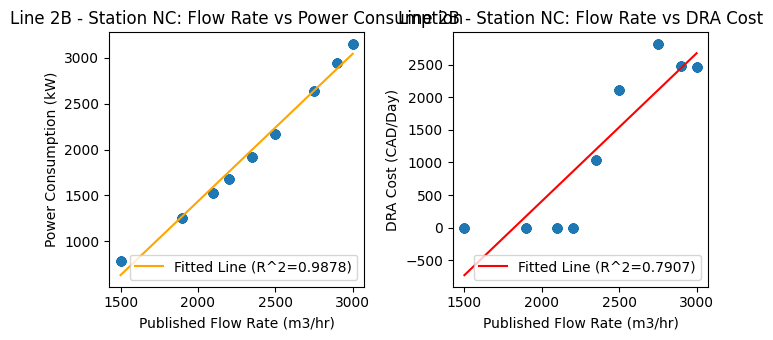

--------------------------------------------------
Line 2B, SP  - Flow Rate Range: 1500 to 3000
Line 2B, SP  - Power Consumption Range: 136.92991101788357 to 2411.4540557879955
Line 2B, SP  - DRA Cost Range: 0.0 to 7215.8664
Line 2B, SP - Polynomial Coefficients for PowerConsumptionkW: [ 1.54844967e+00 -2.34590373e+03]
Line 2B, SP - R^2 for PowerConsumptionkW: 0.9859
Line 2B, SP - Polynomial Coefficients for DRA Cost: [ 3.38659099e+00 -5.78469816e+03]
Line 2B, SP - R^2 for DRA Cost: 0.6219


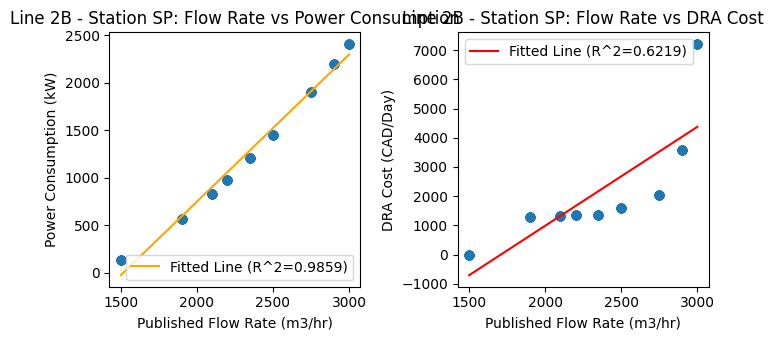

--------------------------------------------------
Line 2B, XP  - Flow Rate Range: 1500 to 3000
Line 2B, XP  - Power Consumption Range: 176.6632298026234 to 1702.5310968533158
Line 2B, XP  - DRA Cost Range: 0.0 to 7326.6312
Line 2B, XP - Polynomial Coefficients for PowerConsumptionkW: [ 1.06516361e+00 -1.66016333e+03]
Line 2B, XP - R^2 for PowerConsumptionkW: 0.9368
Line 2B, XP - Polynomial Coefficients for DRA Cost: [ 3.70922960e+00 -5.39877585e+03]
Line 2B, XP - R^2 for DRA Cost: 0.8382


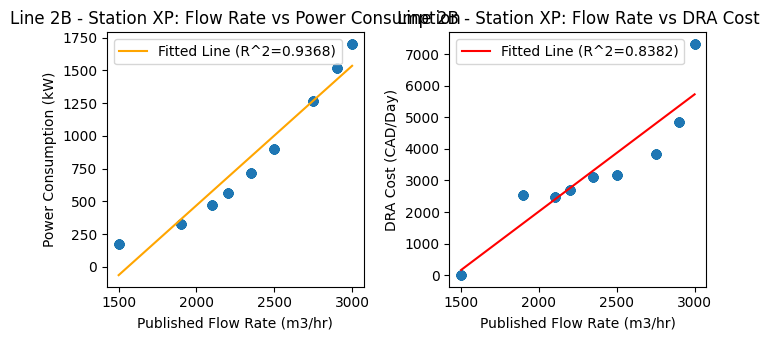

--------------------------------------------------
Line 2B, CM  - Flow Rate Range: 1500 to 3000
Line 2B, CM  - Power Consumption Range: 799.6007862647917 to 3805.851657784324
Line 2B, CM  - DRA Cost Range: 0.0 to 7077.4104
Line 2B, CM - Polynomial Coefficients for PowerConsumptionkW: [ 2.04370419e+00 -2.64420835e+03]
Line 2B, CM - R^2 for PowerConsumptionkW: 0.9499
Line 2B, CM - Polynomial Coefficients for DRA Cost: [ 3.51596267e+00 -6.05649340e+03]
Line 2B, CM - R^2 for DRA Cost: 0.6844


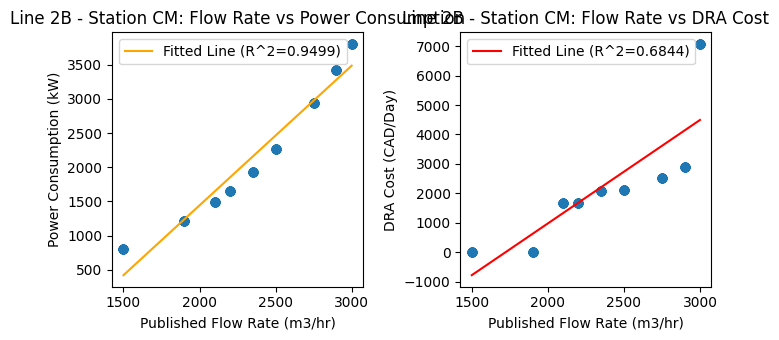

--------------------------------------------------
Line 2B, FW  - Flow Rate Range: 1500 to 3000
Line 2B, FW  - Power Consumption Range: 173.84732493013144 to 2047.9850142896173
Line 2B, FW  - DRA Cost Range: 0.0 to 4391.364
Line 2B, FW - Polynomial Coefficients for PowerConsumptionkW: [ 1.22220229e+00 -1.52363202e+03]
Line 2B, FW - R^2 for PowerConsumptionkW: 0.9837
Line 2B, FW - Polynomial Coefficients for DRA Cost: [ 3.01280746e+00 -5.75919642e+03]
Line 2B, FW - R^2 for DRA Cost: 0.7227


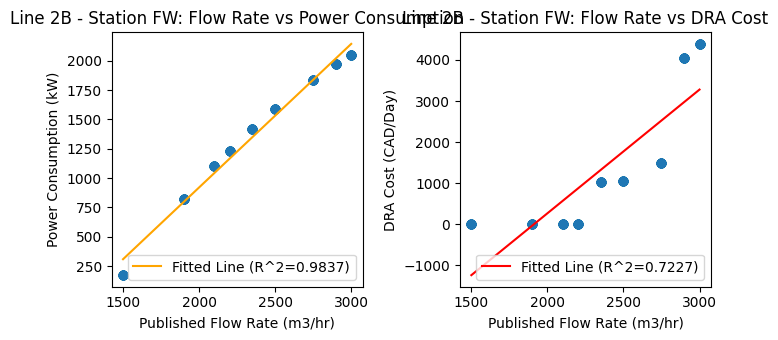

--------------------------------------------------
Line 2B, LP  - Flow Rate Range: 1500 to 3000
Line 2B, LP  - Power Consumption Range: 1256.6727234059945 to 3651.597722504288
Line 2B, LP  - DRA Cost Range: 0.0 to 7326.6312
Line 2B, LP - Polynomial Coefficients for PowerConsumptionkW: [    1.65075055 -1489.54564043]
Line 2B, LP - R^2 for PowerConsumptionkW: 0.9654
Line 2B, LP - Polynomial Coefficients for DRA Cost: [ 3.67500386e+00 -6.55913149e+03]
Line 2B, LP - R^2 for DRA Cost: 0.6213


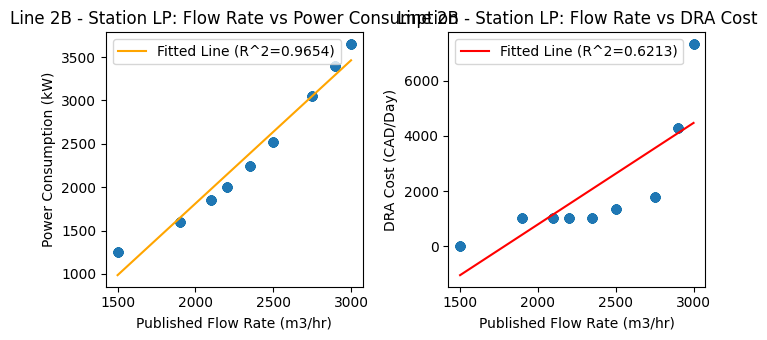

--------------------------------------------------
Line 2B, CR  - Flow Rate Range: 1500 to 3000
Line 2B, CR  - Power Consumption Range: 1342.699180752039 to 2477.758995652199
Line 2B, CR  - DRA Cost Range: 0.0 to 2835.4632
Line 2B, CR - Polynomial Coefficients for PowerConsumptionkW: [  0.79530271 -42.82438474]
Line 2B, CR - R^2 for PowerConsumptionkW: 0.9272
Line 2B, CR - Polynomial Coefficients for DRA Cost: [ 1.67051595e+00 -2.53838247e+03]
Line 2B, CR - R^2 for DRA Cost: 0.8480


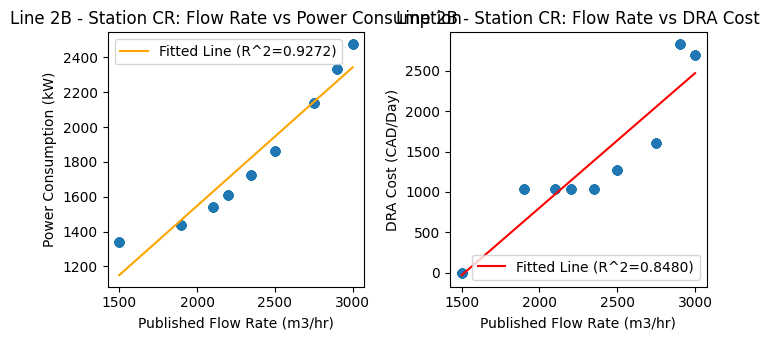

--------------------------------------------------
Line 2B, VG  - Flow Rate Range: 1500 to 3000
Line 2B, VG  - Power Consumption Range: 1028.1678107050247 to 2445.1889105904847
Line 2B, VG  - DRA Cost Range: 0.0 to 2702.7768
Line 2B, VG - Polynomial Coefficients for PowerConsumptionkW: [   0.96813385 -541.04864298]
Line 2B, VG - R^2 for PowerConsumptionkW: 0.9808
Line 2B, VG - Polynomial Coefficients for DRA Cost: [ 1.70357657e+00 -3.15303192e+03]
Line 2B, VG - R^2 for DRA Cost: 0.7759


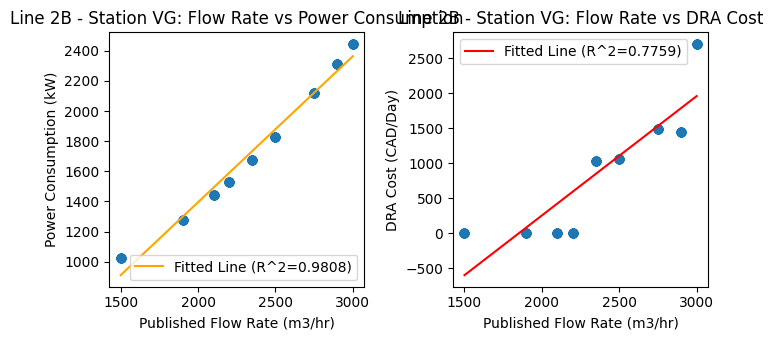

--------------------------------------------------
Line 2B, GF  - Flow Rate Range: 1500 to 3000
Line 2B, GF  - Power Consumption Range: 247.3766329055652 to 2659.8284842036664
Line 2B, GF  - DRA Cost Range: 0.0 to 3725.0424
Line 2B, GF - Polynomial Coefficients for PowerConsumptionkW: [ 1.64507970e+00 -2.40374328e+03]
Line 2B, GF - R^2 for PowerConsumptionkW: 0.9836
Line 2B, GF - Polynomial Coefficients for DRA Cost: [ 2.43005601e+00 -4.60090767e+03]
Line 2B, GF - R^2 for DRA Cost: 0.7670


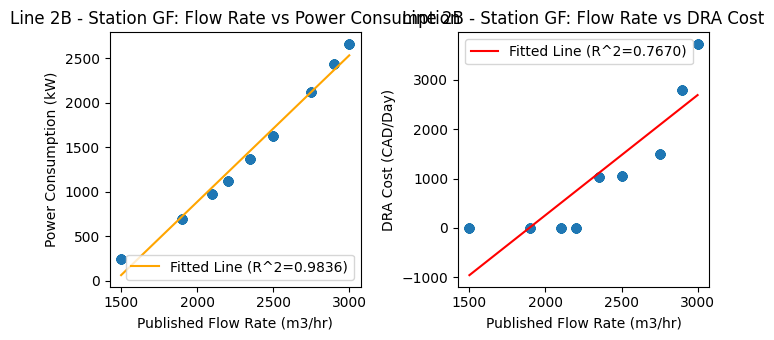

--------------------------------------------------
Line 93, YP  - Flow Rate Range: 2980 to 5810
Line 93, YP  - Power Consumption Range: 3670.090237728336 to 11570.72426424684
Line 93, YP  - DRA Cost Range: 0.0 to 0.0
Line 93, YP - Polynomial Coefficients for PowerConsumptionkW: [ 2.83343474e+00 -5.49745083e+03]
Line 93, YP - R^2 for PowerConsumptionkW: 0.9747
Line 93, YP - Not enough unique values in DRA Cost for polynomial fitting.


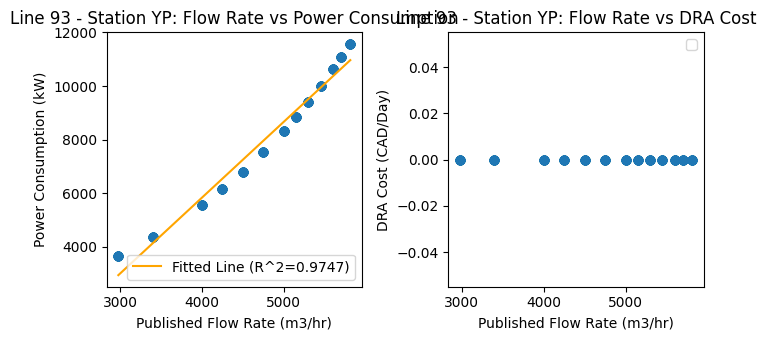

--------------------------------------------------
Line 93, WX  - Flow Rate Range: 2980 to 5810
Line 93, WX  - Power Consumption Range: 11.53230795264244 to 5398.656240306795
Line 93, WX  - DRA Cost Range: 0.0 to 605.7456
Line 93, WX - Polynomial Coefficients for PowerConsumptionkW: [ 1.98186133e+00 -6.64426174e+03]
Line 93, WX - R^2 for PowerConsumptionkW: 0.9533
Line 93, WX - Polynomial Coefficients for DRA Cost: [ 2.67471676e-01 -9.84088771e+02]
Line 93, WX - R^2 for DRA Cost: 0.8204


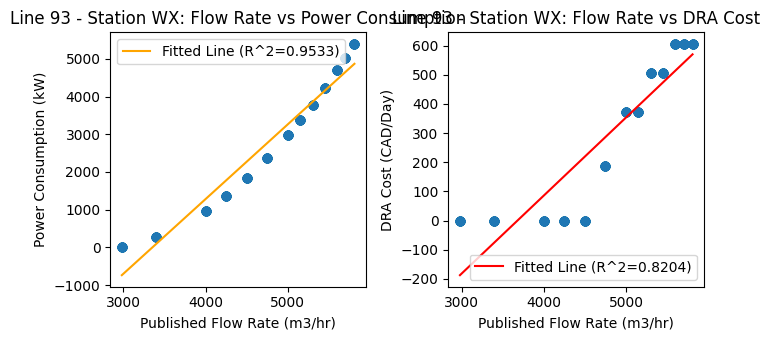

--------------------------------------------------
Line 93, ZP  - Flow Rate Range: 2980 to 5810
Line 93, ZP  - Power Consumption Range: 1850.3620756734165 to 8872.659319710452
Line 93, ZP  - DRA Cost Range: 0.0 to 0.0
Line 93, ZP - Polynomial Coefficients for PowerConsumptionkW: [ 2.55243865e+00 -6.43657192e+03]
Line 93, ZP - R^2 for PowerConsumptionkW: 0.9762
Line 93, ZP - Not enough unique values in DRA Cost for polynomial fitting.


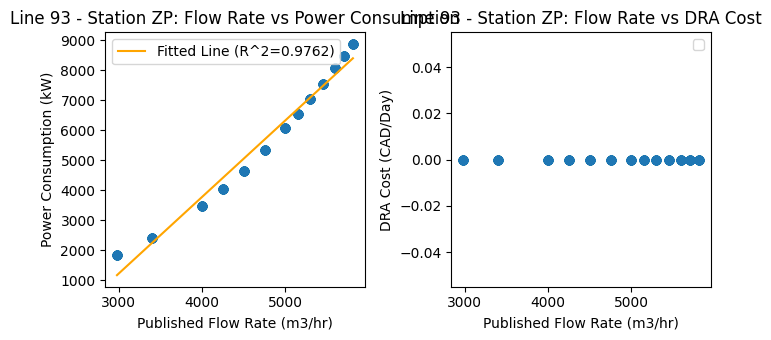

--------------------------------------------------
Line 93, LB  - Flow Rate Range: 2980 to 5810
Line 93, LB  - Power Consumption Range: 885.775241937954 to 9603.842054831912
Line 93, LB  - DRA Cost Range: 0.0 to 0.0
Line 93, LB - Polynomial Coefficients for PowerConsumptionkW: [ 3.12437566e+00 -8.84427728e+03]
Line 93, LB - R^2 for PowerConsumptionkW: 0.9939
Line 93, LB - Not enough unique values in DRA Cost for polynomial fitting.


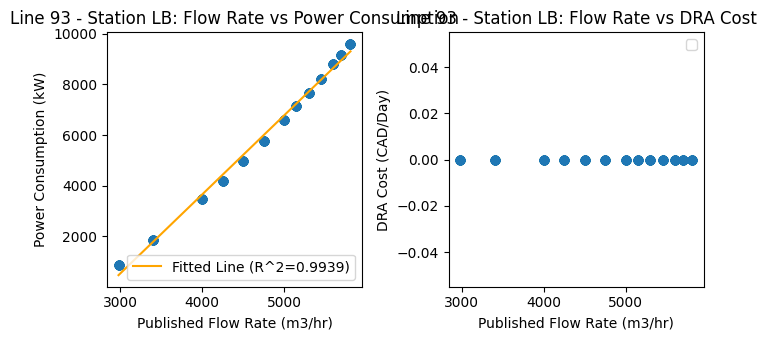

--------------------------------------------------
Line 93, CR  - Flow Rate Range: 2980 to 5810
Line 93, CR  - Power Consumption Range: 3161.735526469536 to 11845.245307146804
Line 93, CR  - DRA Cost Range: 0.0 to 0.0
Line 93, CR - Polynomial Coefficients for PowerConsumptionkW: [ 3.13948812e+00 -6.87507108e+03]
Line 93, CR - R^2 for PowerConsumptionkW: 0.9841
Line 93, CR - Not enough unique values in DRA Cost for polynomial fitting.


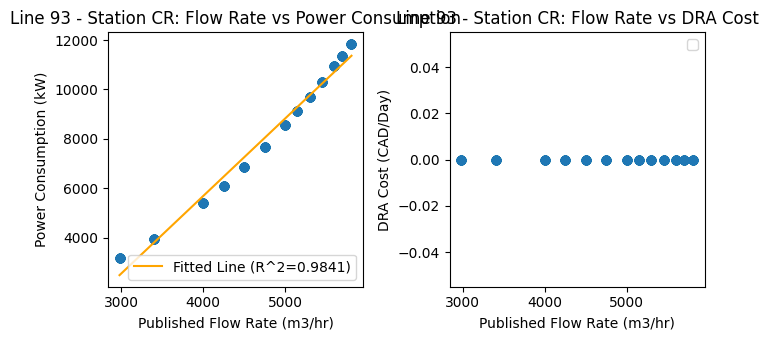

--------------------------------------------------
Line 93, TI  - Flow Rate Range: 2980 to 5810
Line 93, TI  - Power Consumption Range: 1502.5104091418907 to 10011.512759490635
Line 93, TI  - DRA Cost Range: 0.0 to 0.0
Line 93, TI - Polynomial Coefficients for PowerConsumptionkW: [ 3.14723848e+00 -9.22227588e+03]
Line 93, TI - R^2 for PowerConsumptionkW: 0.9410
Line 93, TI - Not enough unique values in DRA Cost for polynomial fitting.


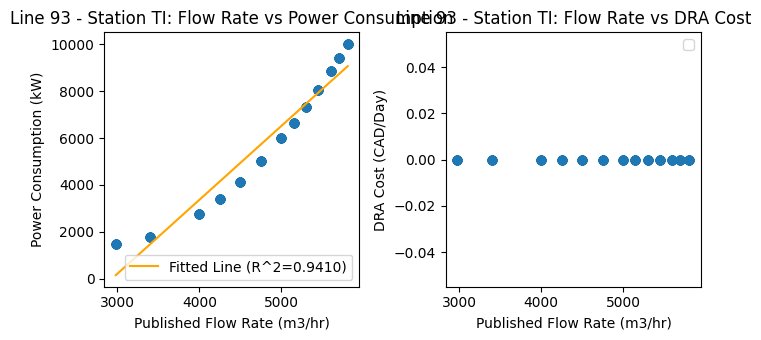

--------------------------------------------------
Line 93, LP  - Flow Rate Range: 2980 to 5810
Line 93, LP  - Power Consumption Range: 2258.735497949645 to 10900.006980672011
Line 93, LP  - DRA Cost Range: 0.0 to 0.0
Line 93, LP - Polynomial Coefficients for PowerConsumptionkW: [ 3.14623055e+00 -8.00570815e+03]
Line 93, LP - R^2 for PowerConsumptionkW: 0.9734
Line 93, LP - Not enough unique values in DRA Cost for polynomial fitting.


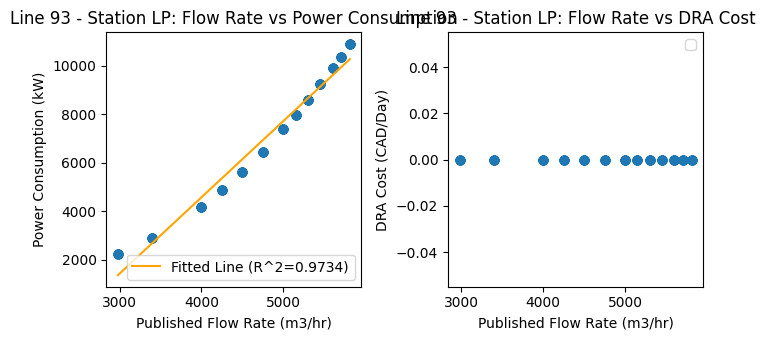

--------------------------------------------------
Line 93, ME  - Flow Rate Range: 2980 to 5810
Line 93, ME  - Power Consumption Range: 1766.382889850065 to 10703.312932054978
Line 93, ME  - DRA Cost Range: 0.0 to 0.0
Line 93, ME - Polynomial Coefficients for PowerConsumptionkW: [ 3.25676017e+00 -8.88545277e+03]
Line 93, ME - R^2 for PowerConsumptionkW: 0.9719
Line 93, ME - Not enough unique values in DRA Cost for polynomial fitting.


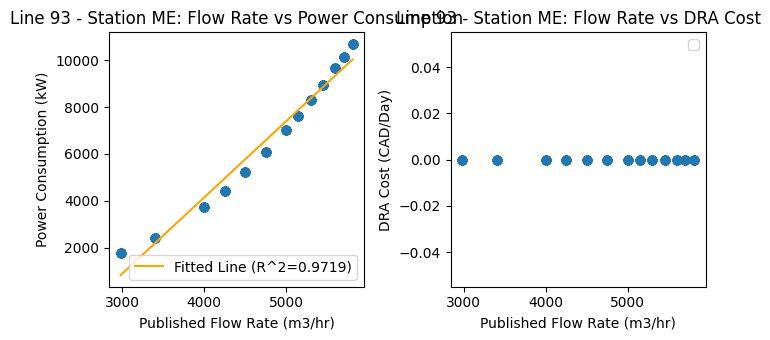

--------------------------------------------------
Line 93, PL  - Flow Rate Range: 2980 to 5810
Line 93, PL  - Power Consumption Range: 1078.7821761490777 to 8457.583053226816
Line 93, PL  - DRA Cost Range: 0.0 to 252.3936
Line 93, PL - Polynomial Coefficients for PowerConsumptionkW: [ 2.66693637e+00 -7.43943825e+03]
Line 93, PL - R^2 for PowerConsumptionkW: 0.9846
Line 93, PL - Polynomial Coefficients for DRA Cost: [ 7.44010439e-02 -2.95961524e+02]
Line 93, PL - R^2 for DRA Cost: 0.3612


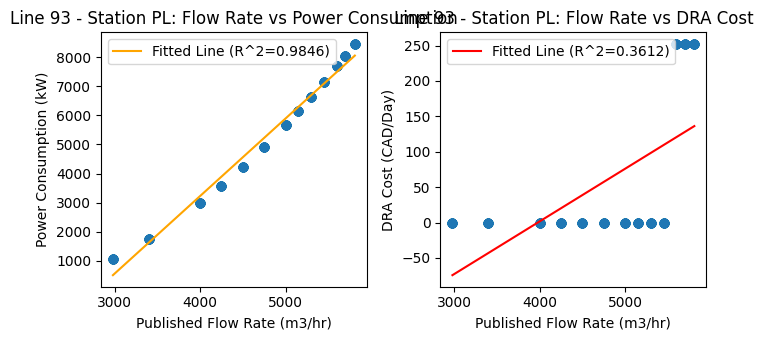

--------------------------------------------------
Line 93, DNS  - Flow Rate Range: 2980 to 5810
Line 93, DNS  - Power Consumption Range: 2089.6167879719287 to 8935.20686447667
Line 93, DNS  - DRA Cost Range: 0.0 to 252.3936
Line 93, DNS - Polynomial Coefficients for PowerConsumptionkW: [ 2.47547515e+00 -5.82885842e+03]
Line 93, DNS - R^2 for PowerConsumptionkW: 0.9839
Line 93, DNS - Polynomial Coefficients for DRA Cost: [ 7.44010439e-02 -2.95961524e+02]
Line 93, DNS - R^2 for DRA Cost: 0.3612


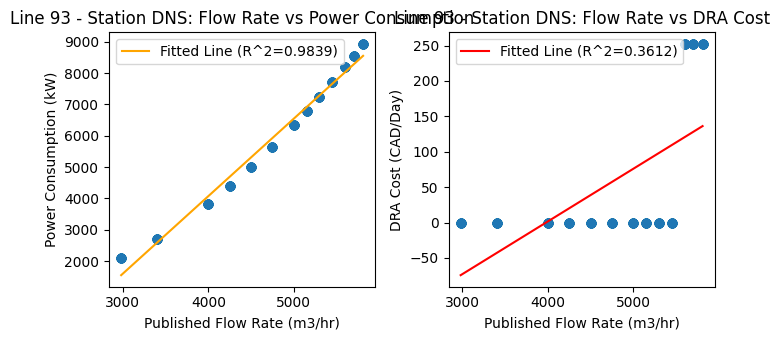

--------------------------------------------------
Line 93, RQ  - Flow Rate Range: 2980 to 5810
Line 93, RQ  - Power Consumption Range: 1834.4411084395836 to 9399.444423725014
Line 93, RQ  - DRA Cost Range: 0.0 to 0.0
Line 93, RQ - Polynomial Coefficients for PowerConsumptionkW: [ 2.73214761e+00 -6.87250853e+03]
Line 93, RQ - R^2 for PowerConsumptionkW: 0.9856
Line 93, RQ - Not enough unique values in DRA Cost for polynomial fitting.


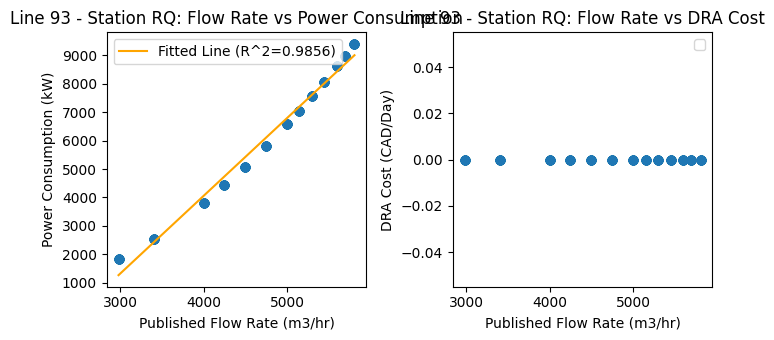

--------------------------------------------------
Line 93, AP  - Flow Rate Range: 2980 to 5810
Line 93, AP  - Power Consumption Range: 1693.2277137776837 to 10588.998848672723
Line 93, AP  - DRA Cost Range: 0.0 to 0.0
Line 93, AP - Polynomial Coefficients for PowerConsumptionkW: [ 3.26170198e+00 -9.15997840e+03]
Line 93, AP - R^2 for PowerConsumptionkW: 0.9603
Line 93, AP - Not enough unique values in DRA Cost for polynomial fitting.


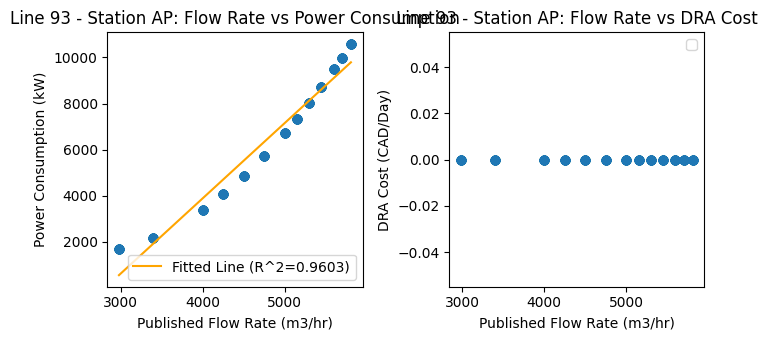

--------------------------------------------------
Line 93, OD  - Flow Rate Range: 2980 to 5810
Line 93, OD  - Power Consumption Range: 1375.8742941059172 to 9000.979408429004
Line 93, OD  - DRA Cost Range: 0.0 to 0.0
Line 93, OD - Polynomial Coefficients for PowerConsumptionkW: [ 2.76676433e+00 -7.56238783e+03]
Line 93, OD - R^2 for PowerConsumptionkW: 0.9789
Line 93, OD - Not enough unique values in DRA Cost for polynomial fitting.


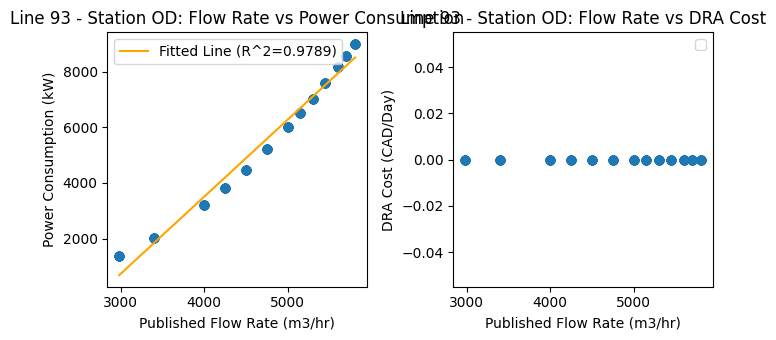

--------------------------------------------------
Line 93, CC  - Flow Rate Range: 2980 to 5810
Line 93, CC  - Power Consumption Range: 1850.7953430488703 to 10501.019434543326
Line 93, CC  - DRA Cost Range: 0.0 to 0.0
Line 93, CC - Polynomial Coefficients for PowerConsumptionkW: [ 3.14810190e+00 -8.40684824e+03]
Line 93, CC - R^2 for PowerConsumptionkW: 0.9741
Line 93, CC - Not enough unique values in DRA Cost for polynomial fitting.


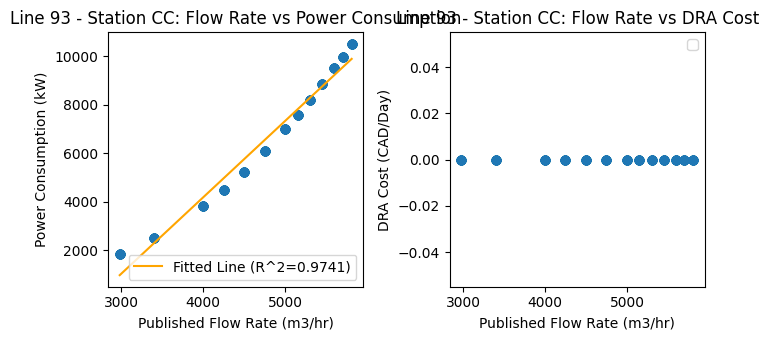

--------------------------------------------------
Line 93, VG  - Flow Rate Range: 2980 to 5810
Line 93, VG  - Power Consumption Range: 879.470834331587 to 7188.987146143336
Line 93, VG  - DRA Cost Range: 0.0 to 0.0
Line 93, VG - Polynomial Coefficients for PowerConsumptionkW: [ 2.27642089e+00 -6.35359175e+03]
Line 93, VG - R^2 for PowerConsumptionkW: 0.9868
Line 93, VG - Not enough unique values in DRA Cost for polynomial fitting.


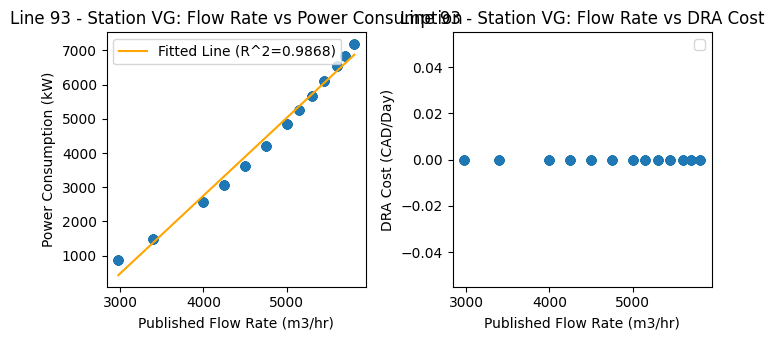

--------------------------------------------------
Line 93, CM  - Flow Rate Range: 2980 to 5810
Line 93, CM  - Power Consumption Range: 1767.1181609062478 to 11233.82910915534
Line 93, CM  - DRA Cost Range: 0.0 to 0.0
Line 93, CM - Polynomial Coefficients for PowerConsumptionkW: [ 3.48168737e+00 -9.91635592e+03]
Line 93, CM - R^2 for PowerConsumptionkW: 0.9539
Line 93, CM - Not enough unique values in DRA Cost for polynomial fitting.


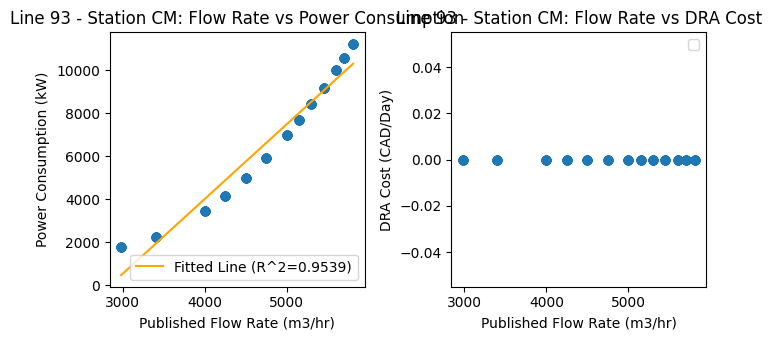

--------------------------------------------------
Line 93, CK  - Flow Rate Range: 2980 to 5810
Line 93, CK  - Power Consumption Range: 1266.1087442152202 to 9877.95088951569
Line 93, CK  - DRA Cost Range: 0.0 to 0.0
Line 93, CK - Polynomial Coefficients for PowerConsumptionkW: [ 3.12305780e+00 -8.80692661e+03]
Line 93, CK - R^2 for PowerConsumptionkW: 0.9798
Line 93, CK - Not enough unique values in DRA Cost for polynomial fitting.


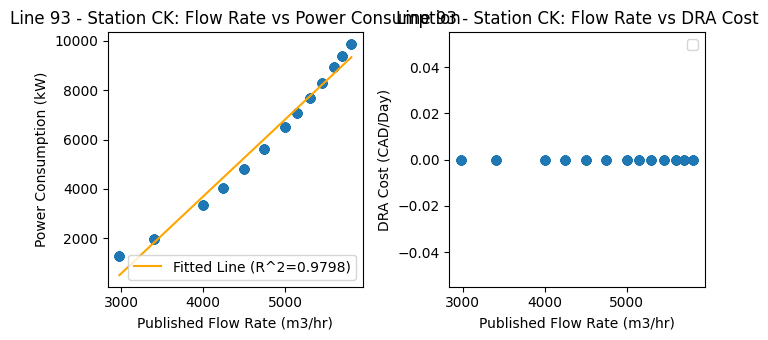

--------------------------------------------------
Line 93, HR  - Flow Rate Range: 2980 to 5810
Line 93, HR  - Power Consumption Range: 1178.680163401179 to 9108.99276248808
Line 93, HR  - DRA Cost Range: 0.0 to 0.0
Line 93, HR - Polynomial Coefficients for PowerConsumptionkW: [ 2.87367576e+00 -8.06921492e+03]
Line 93, HR - R^2 for PowerConsumptionkW: 0.9809
Line 93, HR - Not enough unique values in DRA Cost for polynomial fitting.


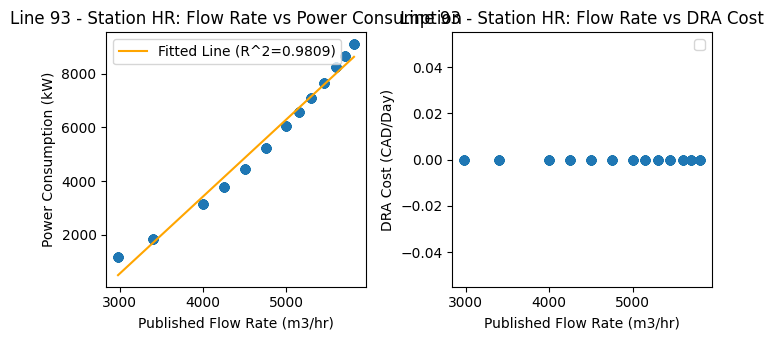

--------------------------------------------------
Line 93, SW  - Flow Rate Range: 2980 to 5810
Line 93, SW  - Power Consumption Range: 831.5488105053373 to 8825.052523192026
Line 93, SW  - DRA Cost Range: 0.0 to 0.0
Line 93, SW - Polynomial Coefficients for PowerConsumptionkW: [ 2.82690436e+00 -7.61508546e+03]
Line 93, SW - R^2 for PowerConsumptionkW: 1.0000
Line 93, SW - Not enough unique values in DRA Cost for polynomial fitting.


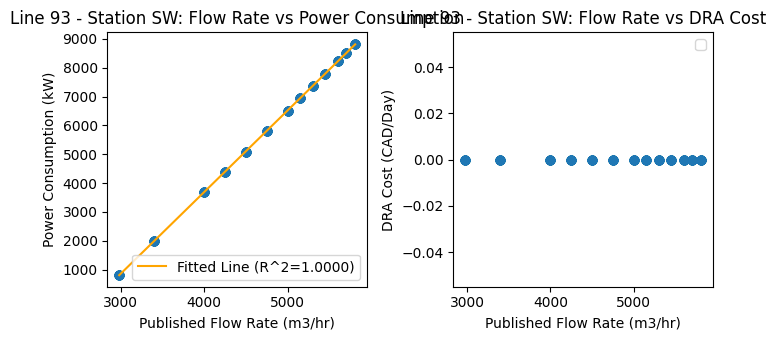

--------------------------------------------------
Line 93, PV  - Flow Rate Range: 2980 to 5810
Line 93, PV  - Power Consumption Range: 1102.0427222466096 to 8352.089560283115
Line 93, PV  - DRA Cost Range: 0.0 to 484.596
Line 93, PV - Polynomial Coefficients for PowerConsumptionkW: [ 2.66072315e+00 -7.77393572e+03]
Line 93, PV - R^2 for PowerConsumptionkW: 0.9584
Line 93, PV - Polynomial Coefficients for DRA Cost: [ 2.17481146e-01 -7.98127394e+02]
Line 93, PV - R^2 for DRA Cost: 0.8208


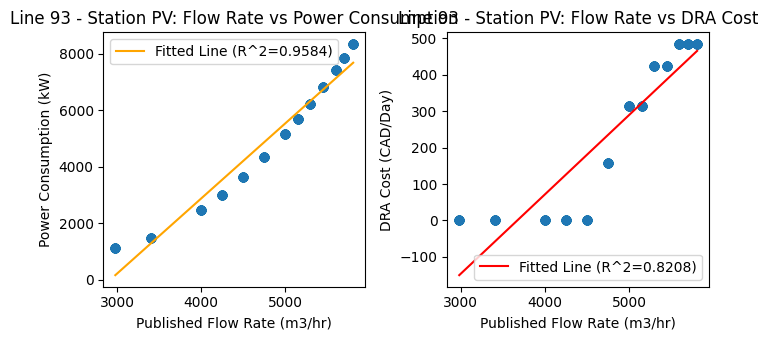

--------------------------------------------------
Line 93, LO  - Flow Rate Range: 2980 to 5810
Line 93, LO  - Power Consumption Range: 1317.224512961693 to 10185.150521575706
Line 93, LO  - DRA Cost Range: 0.0 to 0.0
Line 93, LO - Polynomial Coefficients for PowerConsumptionkW: [ 3.20664478e+00 -8.93878862e+03]
Line 93, LO - R^2 for PowerConsumptionkW: 0.9839
Line 93, LO - Not enough unique values in DRA Cost for polynomial fitting.


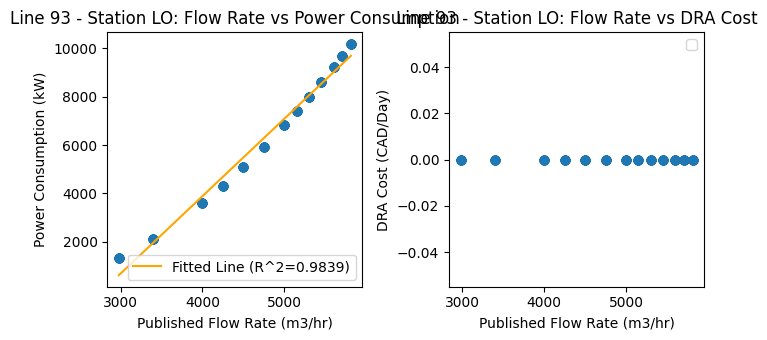

--------------------------------------------------
Line 93, GF  - Flow Rate Range: 2980 to 5810
Line 93, GF  - Power Consumption Range: 2337.9811001457274 to 11158.453158841468
Line 93, GF  - DRA Cost Range: 0.0 to 0.0
Line 93, GF - Polynomial Coefficients for PowerConsumptionkW: [ 3.23073294e+00 -8.38115949e+03]
Line 93, GF - R^2 for PowerConsumptionkW: 0.9624
Line 93, GF - Not enough unique values in DRA Cost for polynomial fitting.


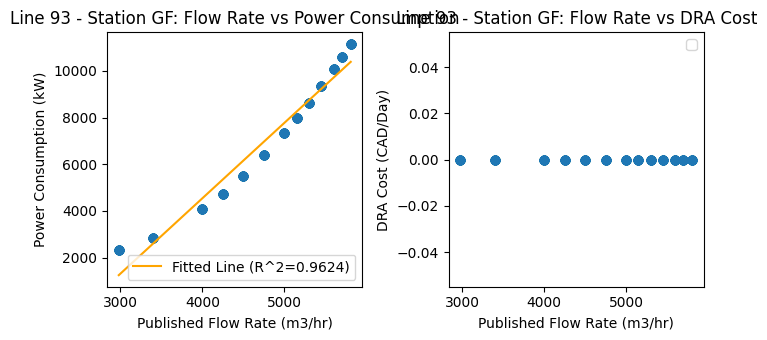

--------------------------------------------------
Line 93, KD  - Flow Rate Range: 2980 to 5810
Line 93, KD  - Power Consumption Range: 1962.4770396656825 to 8844.477997573267
Line 93, KD  - DRA Cost Range: 0.0 to 302.8728
Line 93, KD - Polynomial Coefficients for PowerConsumptionkW: [ 2.42846261e+00 -5.24235061e+03]
Line 93, KD - R^2 for PowerConsumptionkW: 0.9999
Line 93, KD - Polynomial Coefficients for DRA Cost: [ 1.21604155e-01 -4.70205810e+02]
Line 93, KD - R^2 for DRA Cost: 0.5698


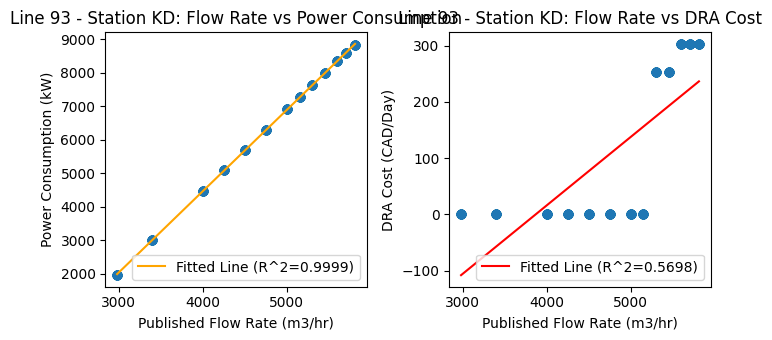

--------------------------------------------------
Line 93, KB  - Flow Rate Range: 2980 to 5810
Line 93, KB  - Power Consumption Range: 1103.6500079100952 to 9986.955282026667
Line 93, KB  - DRA Cost Range: 0.0 to 0.0
Line 93, KB - Polynomial Coefficients for PowerConsumptionkW: [ 3.20485152e+00 -9.07778893e+03]
Line 93, KB - R^2 for PowerConsumptionkW: 0.9869
Line 93, KB - Not enough unique values in DRA Cost for polynomial fitting.


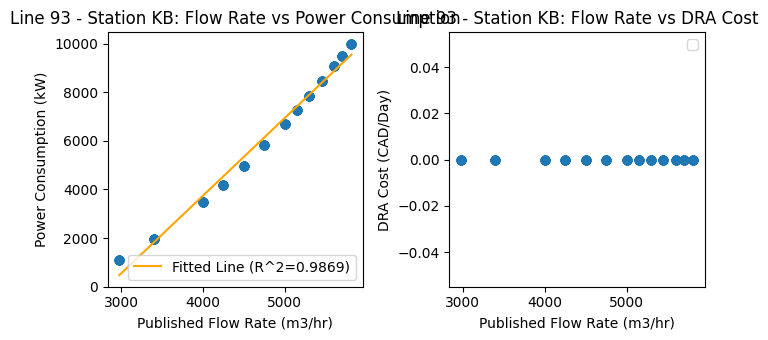

--------------------------------------------------
Line 93, BU  - Flow Rate Range: 2980 to 5810
Line 93, BU  - Power Consumption Range: 2162.5644953139126 to 11220.375610795803
Line 93, BU  - DRA Cost Range: 0.0 to 0.0
Line 93, BU - Polynomial Coefficients for PowerConsumptionkW: [ 3.24190569e+00 -7.89358043e+03]
Line 93, BU - R^2 for PowerConsumptionkW: 0.9949
Line 93, BU - Not enough unique values in DRA Cost for polynomial fitting.


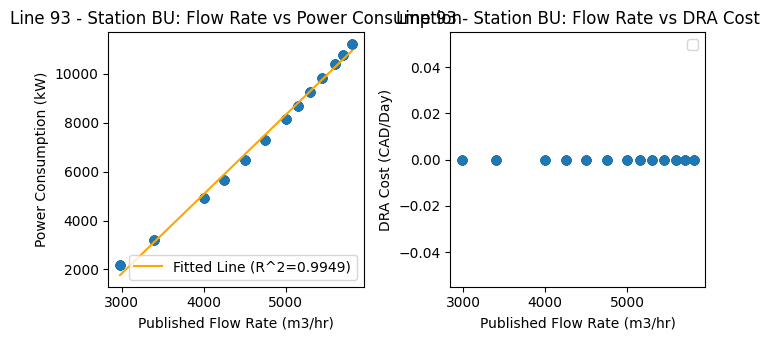

--------------------------------------------------
Line 93, IL  - Flow Rate Range: 2980 to 5810
Line 93, IL  - Power Consumption Range: 2166.397200643085 to 12277.832834921544
Line 93, IL  - DRA Cost Range: 0.0 to 0.0
Line 93, IL - Polynomial Coefficients for PowerConsumptionkW: [ 3.65592605e+00 -9.52309665e+03]
Line 93, IL - R^2 for PowerConsumptionkW: 0.9841
Line 93, IL - Not enough unique values in DRA Cost for polynomial fitting.


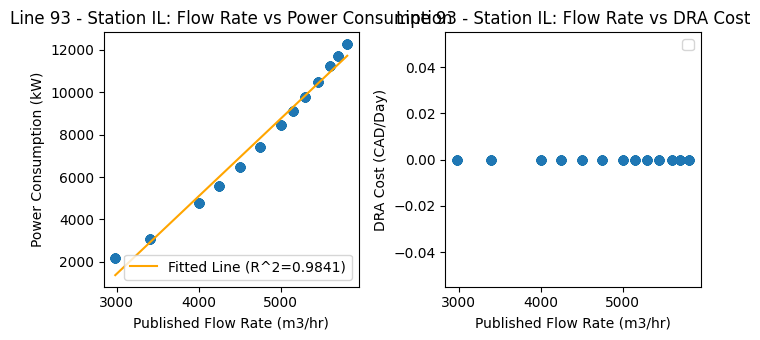

--------------------------------------------------
Line 5, PR  - Flow Rate Range: 2000 to 3800
Line 5, PR  - Power Consumption Range: 2124.4160618782043 to 5272.37651014328
Line 5, PR  - DRA Cost Range: 0.0 to 0.0
Line 5, PR - Polynomial Coefficients for PowerConsumptionkW: [    1.7599744 -1593.8129208]
Line 5, PR - R^2 for PowerConsumptionkW: 0.9872
Line 5, PR - Not enough unique values in DRA Cost for polynomial fitting.


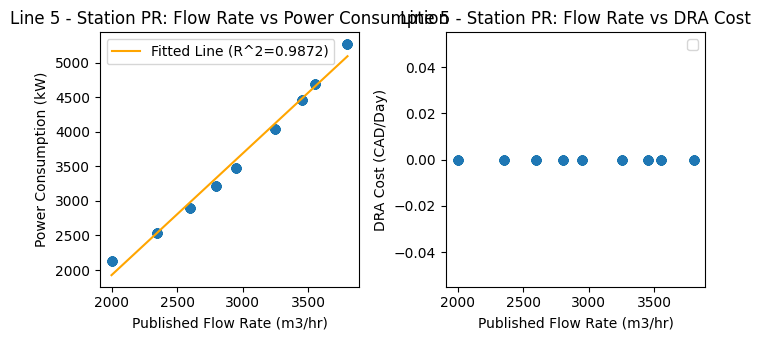

--------------------------------------------------
Line 5, NB  - Flow Rate Range: 2000 to 3800
Line 5, NB  - Power Consumption Range: 122.39212684798986 to 2656.134590582224
Line 5, NB  - DRA Cost Range: 0.0 to 1204.5672
Line 5, NB - Polynomial Coefficients for PowerConsumptionkW: [ 1.40697204e+00 -2.67972268e+03]
Line 5, NB - R^2 for PowerConsumptionkW: 0.9999
Line 5, NB - Polynomial Coefficients for DRA Cost: [ 8.91593875e-01 -2.13490766e+03]
Line 5, NB - R^2 for DRA Cost: 0.7514


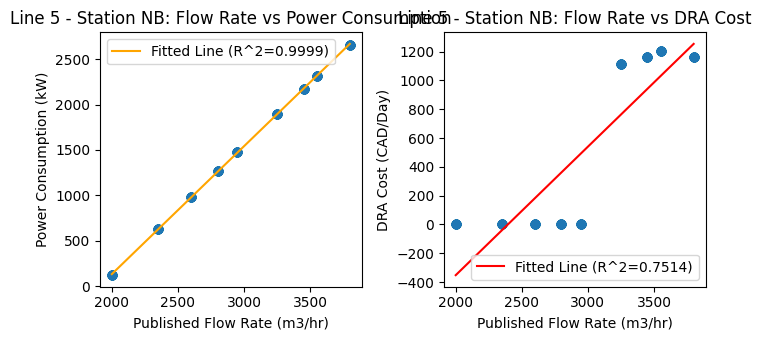

--------------------------------------------------
Line 5, RA  - Flow Rate Range: 2000 to 3800
Line 5, RA  - Power Consumption Range: 0.0 to 2996.508256379515
Line 5, RA  - DRA Cost Range: 0.0 to 0.0
Line 5, RA - Polynomial Coefficients for PowerConsumptionkW: [ 1.70208009e+00 -3.78532885e+03]
Line 5, RA - R^2 for PowerConsumptionkW: 0.9555
Line 5, RA - Not enough unique values in DRA Cost for polynomial fitting.


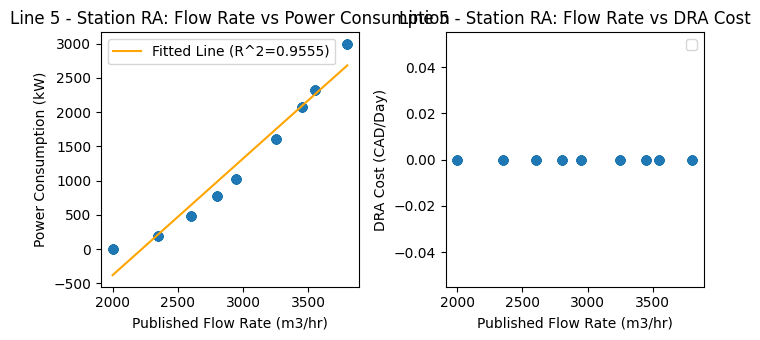

--------------------------------------------------
Line 5, MQ  - Flow Rate Range: 2000 to 3800
Line 5, MQ  - Power Consumption Range: 712.328602746129 to 3177.027090359479
Line 5, MQ  - DRA Cost Range: 0.0 to 0.0
Line 5, MQ - Polynomial Coefficients for PowerConsumptionkW: [ 1.38405633e+00 -2.31961164e+03]
Line 5, MQ - R^2 for PowerConsumptionkW: 0.9642
Line 5, MQ - Not enough unique values in DRA Cost for polynomial fitting.


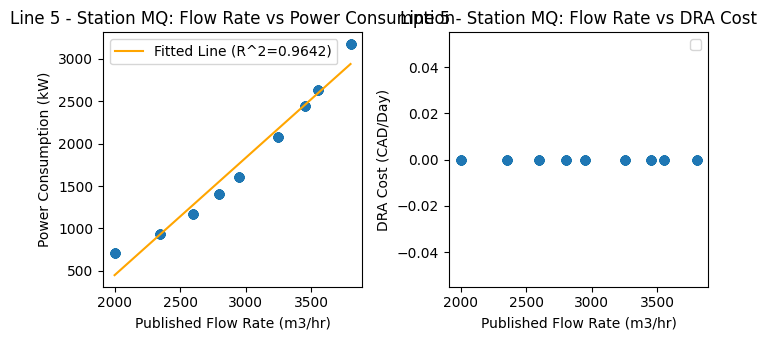

--------------------------------------------------
Line 5, MA  - Flow Rate Range: 2000 to 3800
Line 5, MA  - Power Consumption Range: 726.6720215138048 to 2708.396604859736
Line 5, MA  - DRA Cost Range: 0.0 to 4993.6464
Line 5, MA - Polynomial Coefficients for PowerConsumptionkW: [ 1.10346243e+00 -1.52495781e+03]
Line 5, MA - R^2 for PowerConsumptionkW: 0.9983
Line 5, MA - Polynomial Coefficients for DRA Cost: [ 2.80412410e+00 -6.63583009e+03]
Line 5, MA - R^2 for DRA Cost: 0.8432


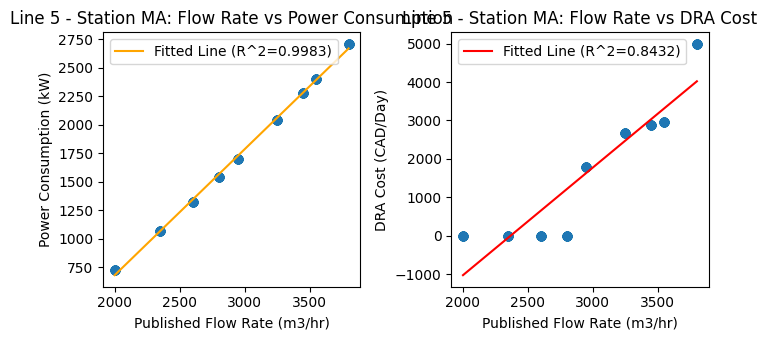

--------------------------------------------------
Line 5, SN  - Flow Rate Range: 2000 to 3800
Line 5, SN  - Power Consumption Range: 918.7997154667974 to 3513.199136989191
Line 5, SN  - DRA Cost Range: 0.0 to 3016.6104
Line 5, SN - Polynomial Coefficients for PowerConsumptionkW: [ 1.45021239e+00 -2.14013121e+03]
Line 5, SN - R^2 for PowerConsumptionkW: 0.9879
Line 5, SN - Polynomial Coefficients for DRA Cost: [ 2.09059816e+00 -5.03492310e+03]
Line 5, SN - R^2 for DRA Cost: 0.7798


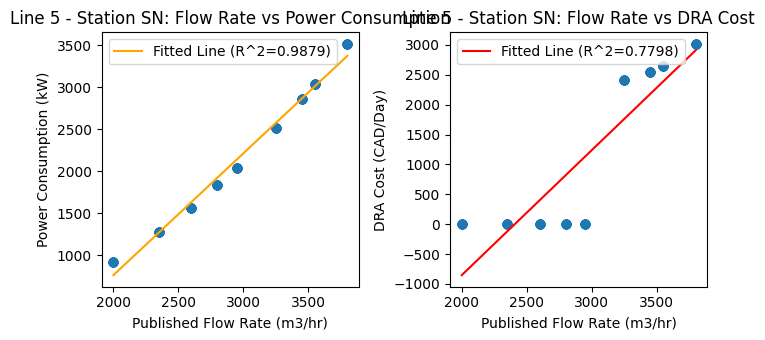

--------------------------------------------------
Line 5, IN  - Flow Rate Range: 2000 to 3800
Line 5, IN  - Power Consumption Range: 1450.65908267349 to 4073.700871301815
Line 5, IN  - DRA Cost Range: 0.0 to 0.0
Line 5, IN - Polynomial Coefficients for PowerConsumptionkW: [ 1.46463030e+00 -1.61042905e+03]
Line 5, IN - R^2 for PowerConsumptionkW: 0.9918
Line 5, IN - Not enough unique values in DRA Cost for polynomial fitting.


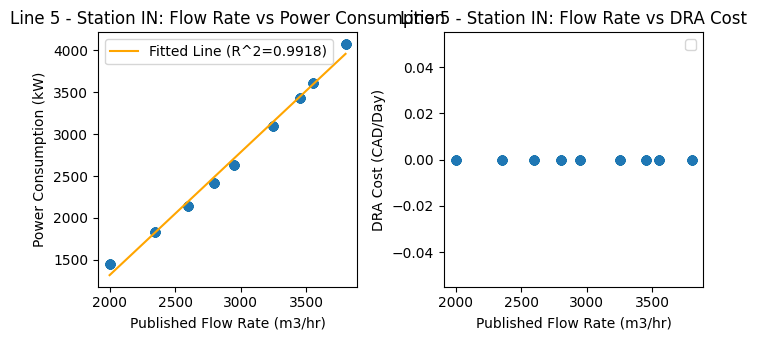

--------------------------------------------------
Line 5, IR  - Flow Rate Range: 2000 to 3800
Line 5, IR  - Power Consumption Range: 256.0655018389225 to 2318.294578053057
Line 5, IR  - DRA Cost Range: 0.0 to 4999.992
Line 5, IR - Polynomial Coefficients for PowerConsumptionkW: [ 1.15254424e+00 -2.17150649e+03]
Line 5, IR - R^2 for PowerConsumptionkW: 0.9886
Line 5, IR - Polynomial Coefficients for DRA Cost: [ 3.46656212e+00 -8.34847111e+03]
Line 5, IR - R^2 for DRA Cost: 0.7797


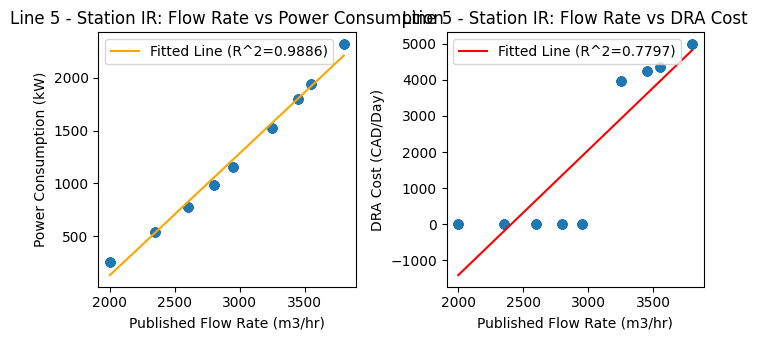

--------------------------------------------------
Line 5, GC  - Flow Rate Range: 2000 to 3800
Line 5, GC  - Power Consumption Range: 544.7077268511057 to 3056.941271457821
Line 5, GC  - DRA Cost Range: 0.0 to 0.0
Line 5, GC - Polynomial Coefficients for PowerConsumptionkW: [ 1.41133686e+00 -2.55736263e+03]
Line 5, GC - R^2 for PowerConsumptionkW: 0.9615
Line 5, GC - Not enough unique values in DRA Cost for polynomial fitting.


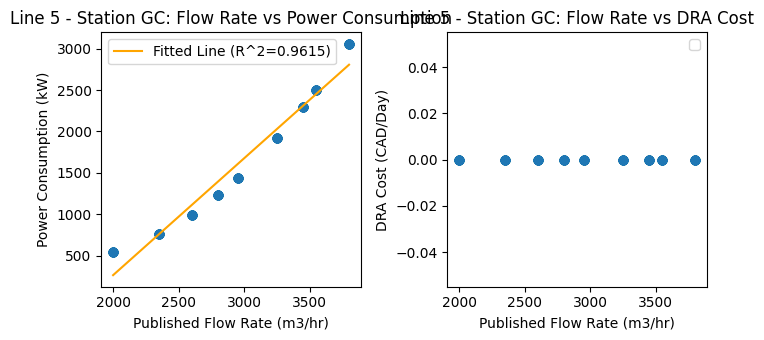

--------------------------------------------------
Line 5, IO  - Flow Rate Range: 2000 to 3800
Line 5, IO  - Power Consumption Range: 380.1051281951368 to 2268.7104200338945
Line 5, IO  - DRA Cost Range: 0.0 to 3016.6104
Line 5, IO - Polynomial Coefficients for PowerConsumptionkW: [ 1.04737319e+00 -1.68158152e+03]
Line 5, IO - R^2 for PowerConsumptionkW: 0.9990
Line 5, IO - Polynomial Coefficients for DRA Cost: [ 2.23889489e+00 -5.37281369e+03]
Line 5, IO - R^2 for DRA Cost: 0.7638


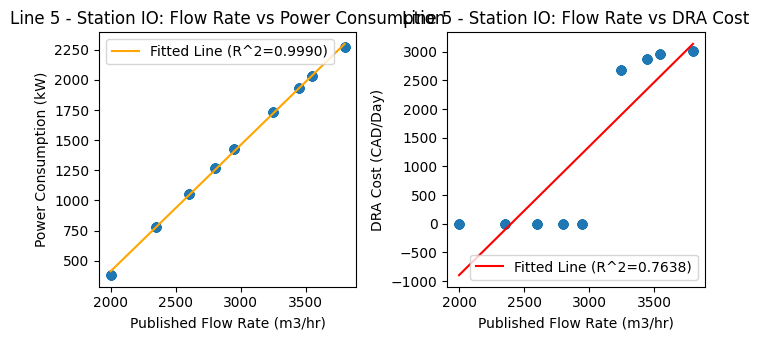

--------------------------------------------------
Line 5, nan  - Flow Rate Range: nan to nan
Line 5, nan  - Power Consumption Range: nan to nan
Line 5, nan  - DRA Cost Range: nan to nan
Line 5, nan - Not enough unique values in Power Consumption for polynomial fitting.
Line 5, BC  - Flow Rate Range: 2000 to 3800
Line 5, BC  - Power Consumption Range: 714.1878185793757 to 3320.5069459509104
Line 5, BC  - DRA Cost Range: 0.0 to 4131.18
Line 5, BC - Polynomial Coefficients for PowerConsumptionkW: [ 1.46097135e+00 -2.44010918e+03]
Line 5, BC - R^2 for PowerConsumptionkW: 0.9748
Line 5, BC - Polynomial Coefficients for DRA Cost: [ 2.63104811e+00 -6.36819486e+03]
Line 5, BC - R^2 for DRA Cost: 0.7903


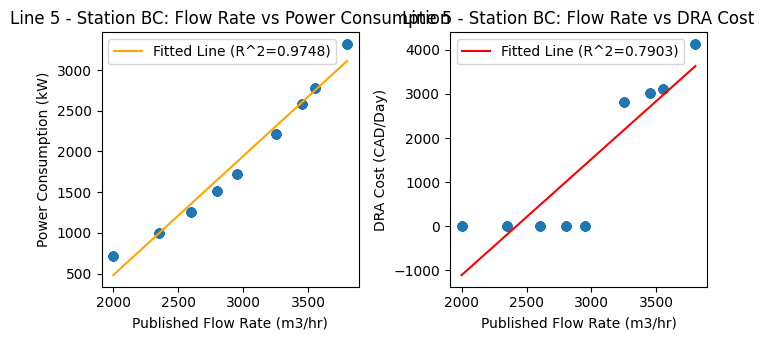

--------------------------------------------------
Line 5, LE  - Flow Rate Range: 2000 to 3800
Line 5, LE  - Power Consumption Range: 1545.171357813757 to 4268.007896415889
Line 5, LE  - DRA Cost Range: 0.0 to 0.0
Line 5, LE - Polynomial Coefficients for PowerConsumptionkW: [ 1.53024607e+00 -2.05245290e+03]
Line 5, LE - R^2 for PowerConsumptionkW: 0.8788
Line 5, LE - Not enough unique values in DRA Cost for polynomial fitting.


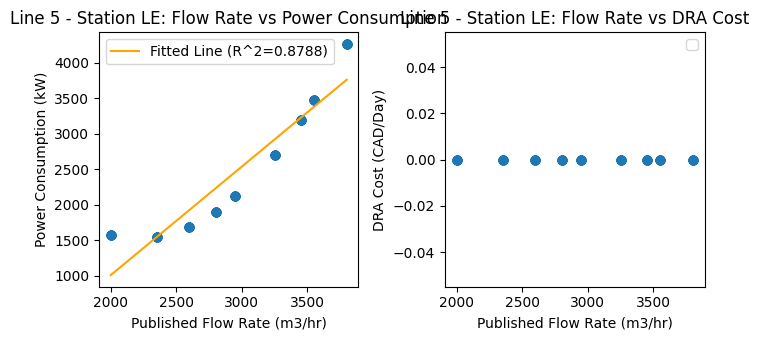

--------------------------------------------------
Line 5, GO  - Flow Rate Range: 2000 to 3800
Line 5, GO  - Power Consumption Range: 621.6350459679961 to 2856.2331978883594
Line 5, GO  - DRA Cost Range: 0.0 to 2645.0856
Line 5, GO - Polynomial Coefficients for PowerConsumptionkW: [ 1.25159648e+00 -2.06280073e+03]
Line 5, GO - R^2 for PowerConsumptionkW: 0.9790
Line 5, GO - Polynomial Coefficients for DRA Cost: [ 1.82868112e+00 -4.40580052e+03]
Line 5, GO - R^2 for DRA Cost: 0.7813


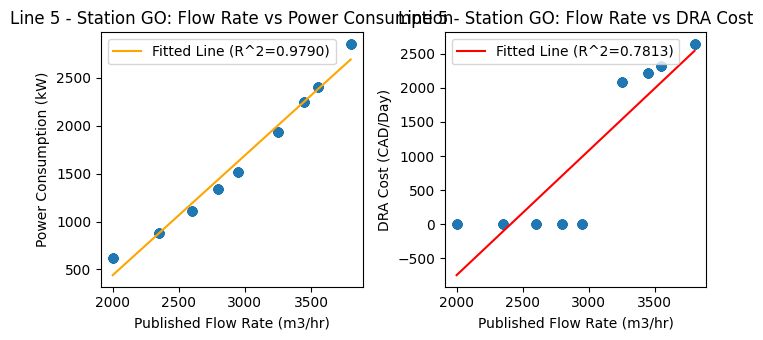

--------------------------------------------------
Line 5, WB  - Flow Rate Range: 2000 to 3800
Line 5, WB  - Power Consumption Range: 456.9448088035067 to 2934.8117566705387
Line 5, WB  - DRA Cost Range: 0.0 to 0.0
Line 5, WB - Polynomial Coefficients for PowerConsumptionkW: [ 1.34556409e+00 -2.53993357e+03]
Line 5, WB - R^2 for PowerConsumptionkW: 0.9362
Line 5, WB - Not enough unique values in DRA Cost for polynomial fitting.


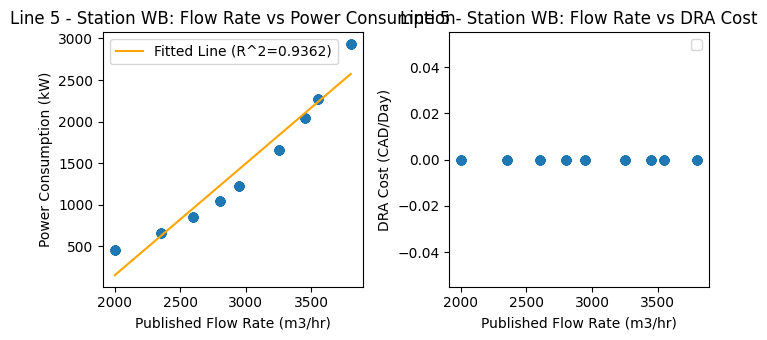

--------------------------------------------------
Line 61, SLS  - Flow Rate Range: 3650 to 9175
Line 61, SLS  - Power Consumption Range: 2291.672423375305 to 15898.825976864784
Line 61, SLS  - DRA Cost Range: 0.0 to 0.0
Line 61, SLS - Polynomial Coefficients for PowerConsumptionkW: [ 2.50994840e+00 -8.87633529e+03]
Line 61, SLS - R^2 for PowerConsumptionkW: 0.9431
Line 61, SLS - Not enough unique values in DRA Cost for polynomial fitting.


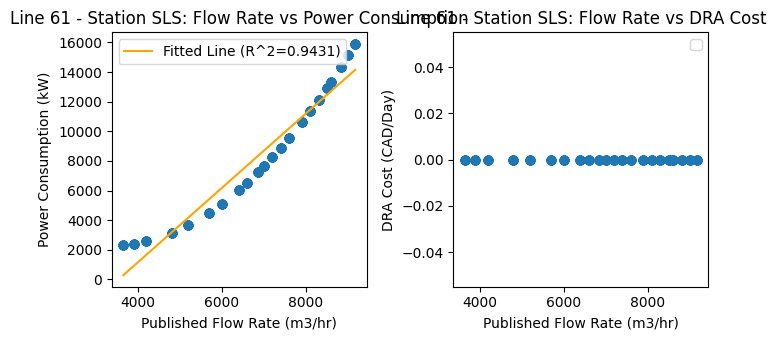

--------------------------------------------------
Line 61, MNN  - Flow Rate Range: 3650 to 9175
Line 61, MNN  - Power Consumption Range: 2098.366226429818 to 11965.065993925266
Line 61, MNN  - DRA Cost Range: 0.0 to 0.0
Line 61, MNN - Polynomial Coefficients for PowerConsumptionkW: [ 1.80759698e+00 -5.42653127e+03]
Line 61, MNN - R^2 for PowerConsumptionkW: 0.9757
Line 61, MNN - Not enough unique values in DRA Cost for polynomial fitting.


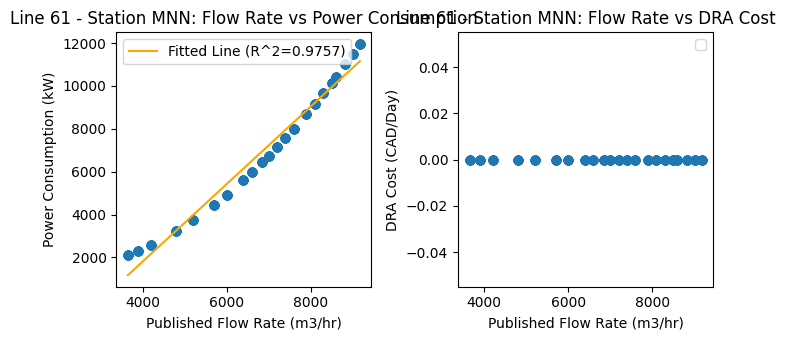

--------------------------------------------------
Line 61, BPS  - Flow Rate Range: 3650 to 9175
Line 61, BPS  - Power Consumption Range: 1997.704572167888 to 12297.81880860489
Line 61, BPS  - DRA Cost Range: 0.0 to 10187.5032
Line 61, BPS - Polynomial Coefficients for PowerConsumptionkW: [ 1.88813543e+00 -5.91027575e+03]
Line 61, BPS - R^2 for PowerConsumptionkW: 0.9734
Line 61, BPS - Polynomial Coefficients for DRA Cost: [ 3.88275422e-01 -2.20039517e+03]
Line 61, BPS - R^2 for DRA Cost: 0.0924


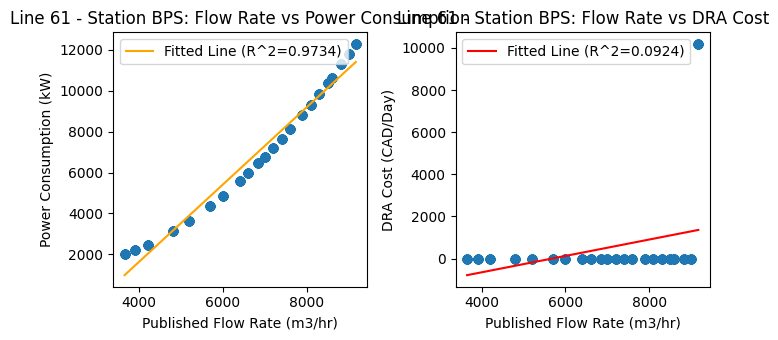

--------------------------------------------------
Line 61, PR  - Flow Rate Range: 3650 to 9175
Line 61, PR  - Power Consumption Range: 6866.675186510547 to 20224.01943236808
Line 61, PR  - DRA Cost Range: 0.0 to 0.0
Line 61, PR - Polynomial Coefficients for PowerConsumptionkW: [ 2.46644607e+00 -4.21546625e+03]
Line 61, PR - R^2 for PowerConsumptionkW: 0.9371
Line 61, PR - Not enough unique values in DRA Cost for polynomial fitting.


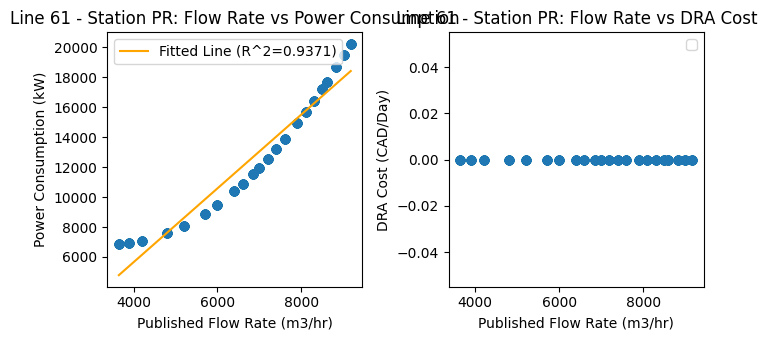

--------------------------------------------------
Line 61, LDN  - Flow Rate Range: 3650 to 9175
Line 61, LDN  - Power Consumption Range: 635.3346192440367 to 8696.219622256336
Line 61, LDN  - DRA Cost Range: 0.0 to 0.0
Line 61, LDN - Polynomial Coefficients for PowerConsumptionkW: [ 1.48187519e+00 -5.74848712e+03]
Line 61, LDN - R^2 for PowerConsumptionkW: 0.9607
Line 61, LDN - Not enough unique values in DRA Cost for polynomial fitting.


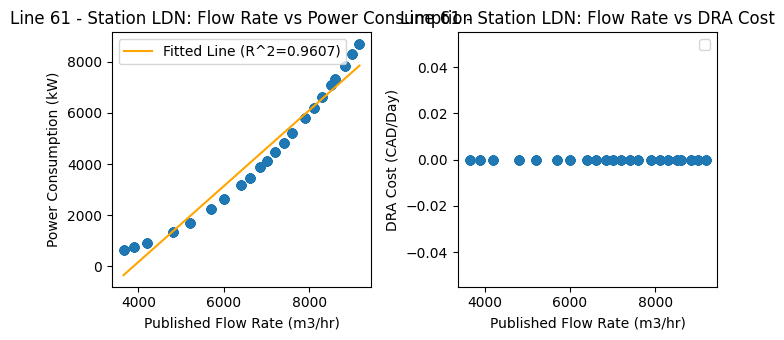

--------------------------------------------------
Line 61, SH  - Flow Rate Range: 3650 to 9175
Line 61, SH  - Power Consumption Range: 2351.298063731985 to 15608.106293688354
Line 61, SH  - DRA Cost Range: 0.0 to 6791.6688
Line 61, SH - Polynomial Coefficients for PowerConsumptionkW: [ 2.44269170e+00 -8.40742583e+03]
Line 61, SH - R^2 for PowerConsumptionkW: 0.9490
Line 61, SH - Polynomial Coefficients for DRA Cost: [ 2.58850281e-01 -1.46693012e+03]
Line 61, SH - R^2 for DRA Cost: 0.0924


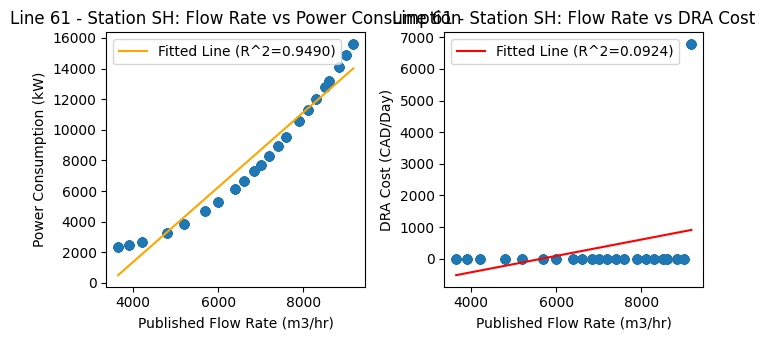

--------------------------------------------------
Line 61, MFS  - Flow Rate Range: 3650 to 9175
Line 61, MFS  - Power Consumption Range: 344.4592732512445 to 10009.918775866274
Line 61, MFS  - DRA Cost Range: 0.0 to 0.0
Line 61, MFS - Polynomial Coefficients for PowerConsumptionkW: [ 1.59625659e+00 -7.25898658e+03]
Line 61, MFS - R^2 for PowerConsumptionkW: 0.8341
Line 61, MFS - Not enough unique values in DRA Cost for polynomial fitting.


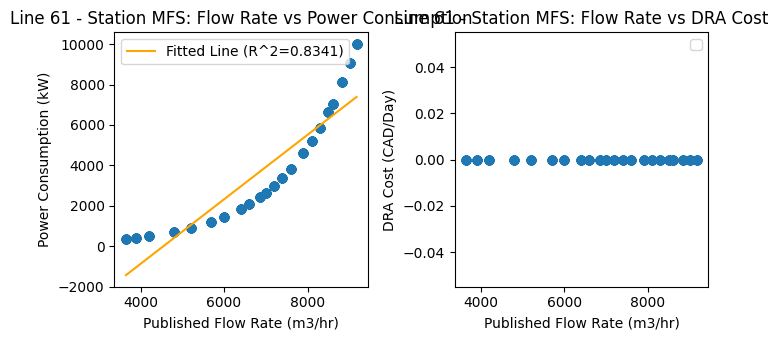

--------------------------------------------------
Line 61, OPS  - Flow Rate Range: 3650 to 9175
Line 61, OPS  - Power Consumption Range: 1352.5914117891807 to 14830.246214298822
Line 61, OPS  - DRA Cost Range: 0.0 to 5093.7528
Line 61, OPS - Polynomial Coefficients for PowerConsumptionkW: [ 2.47807256e+00 -9.33972007e+03]
Line 61, OPS - R^2 for PowerConsumptionkW: 0.9599
Line 61, OPS - Polynomial Coefficients for DRA Cost: [ 1.94137757e-01 -1.10019785e+03]
Line 61, OPS - R^2 for DRA Cost: 0.0924


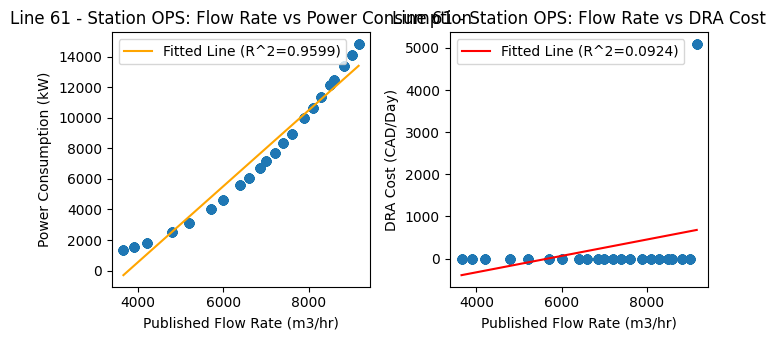

--------------------------------------------------
Line 61, DPS  - Flow Rate Range: 3650 to 9175
Line 61, DPS  - Power Consumption Range: 0.0 to 10203.20572924093
Line 61, DPS  - DRA Cost Range: 0.0 to 0.0
Line 61, DPS - Polynomial Coefficients for PowerConsumptionkW: [ 1.89325681e+00 -8.11278460e+03]
Line 61, DPS - R^2 for PowerConsumptionkW: 0.9690
Line 61, DPS - Not enough unique values in DRA Cost for polynomial fitting.


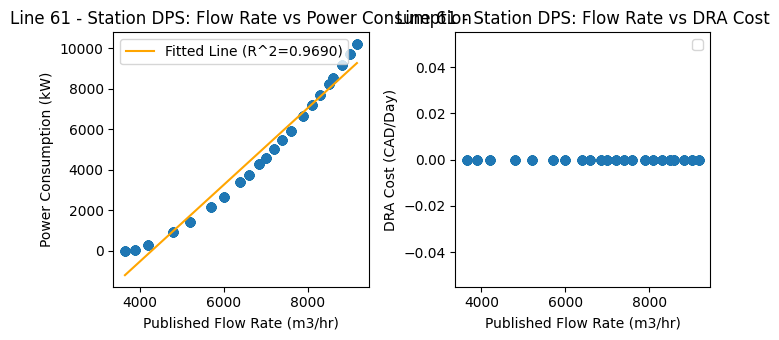

--------------------------------------------------
Line 61, OWN  - Flow Rate Range: 3650 to 9175
Line 61, OWN  - Power Consumption Range: 704.8054209415568 to 11949.382058437186
Line 61, OWN  - DRA Cost Range: 0.0 to 0.0
Line 61, OWN - Polynomial Coefficients for PowerConsumptionkW: [ 2.06188846e+00 -7.95703834e+03]
Line 61, OWN - R^2 for PowerConsumptionkW: 0.9721
Line 61, OWN - Not enough unique values in DRA Cost for polynomial fitting.


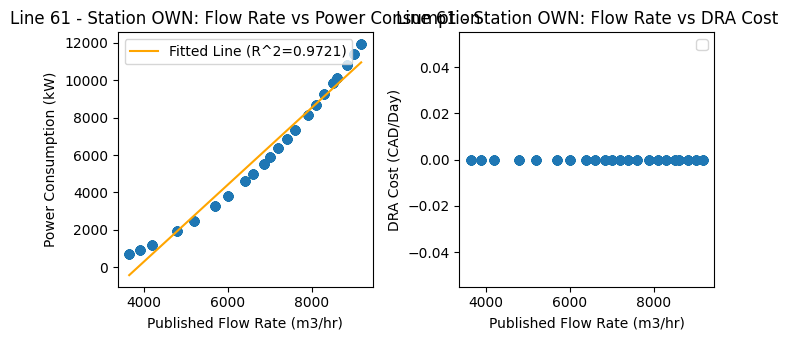

--------------------------------------------------
Line 61, PT  - Flow Rate Range: 3650 to 9175
Line 61, PT  - Power Consumption Range: 1336.498647455126 to 13828.69735967234
Line 61, PT  - DRA Cost Range: 0.0 to 0.0
Line 61, PT - Polynomial Coefficients for PowerConsumptionkW: [ 2.29793081e+00 -9.42567861e+03]
Line 61, PT - R^2 for PowerConsumptionkW: 0.8998
Line 61, PT - Not enough unique values in DRA Cost for polynomial fitting.


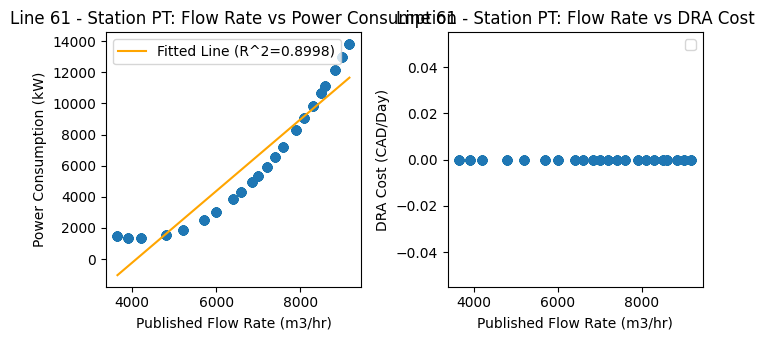

--------------------------------------------------
Line 61, AM  - Flow Rate Range: 3650 to 9175
Line 61, AM  - Power Consumption Range: 221.3453977582976 to 10549.597179719014
Line 61, AM  - DRA Cost Range: 0.0 to 0.0
Line 61, AM - Polynomial Coefficients for PowerConsumptionkW: [ 1.90616772e+00 -8.30356343e+03]
Line 61, AM - R^2 for PowerConsumptionkW: 0.9400
Line 61, AM - Not enough unique values in DRA Cost for polynomial fitting.


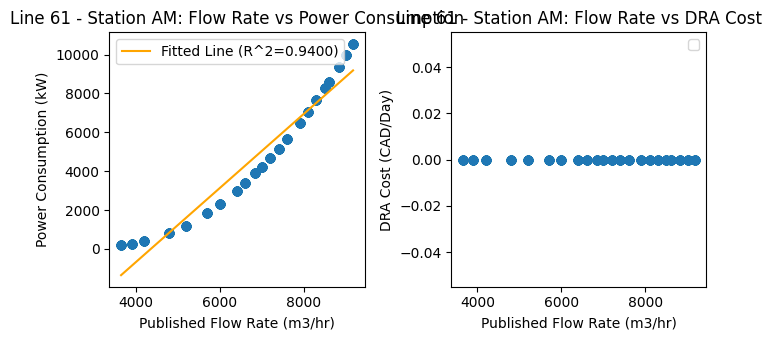

--------------------------------------------------
Line 61, WA  - Flow Rate Range: 3650 to 9175
Line 61, WA  - Power Consumption Range: 1294.4564512497743 to 14509.27427432069
Line 61, WA  - DRA Cost Range: 0.0 to 0.0
Line 61, WA - Polynomial Coefficients for PowerConsumptionkW: [ 2.43935621e+00 -9.63372691e+03]
Line 61, WA - R^2 for PowerConsumptionkW: 0.9389
Line 61, WA - Not enough unique values in DRA Cost for polynomial fitting.


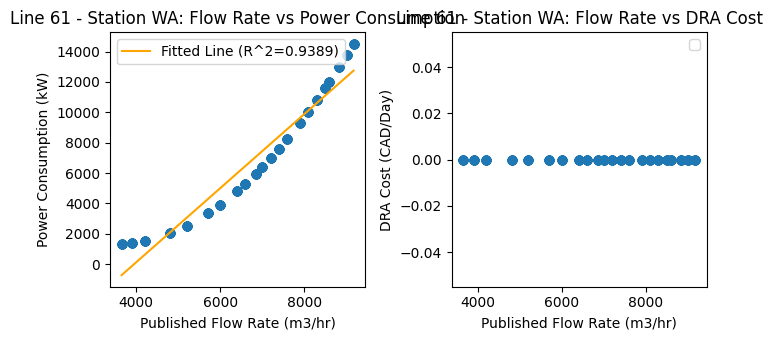

--------------------------------------------------
Line 61, HT  - Flow Rate Range: 3650 to 9175
Line 61, HT  - Power Consumption Range: 629.1924962441844 to 7594.416353546047
Line 61, HT  - DRA Cost Range: 0.0 to 0.0
Line 61, HT - Polynomial Coefficients for PowerConsumptionkW: [ 1.27501559e+00 -4.63544100e+03]
Line 61, HT - R^2 for PowerConsumptionkW: 0.9788
Line 61, HT - Not enough unique values in DRA Cost for polynomial fitting.


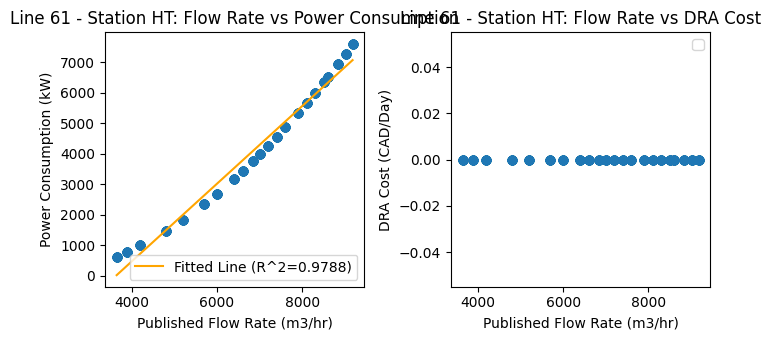

--------------------------------------------------
Line 61, DL  - Flow Rate Range: 3650 to 9175
Line 61, DL  - Power Consumption Range: 1298.6794978071705 to 15916.531091899817
Line 61, DL  - DRA Cost Range: 0.0 to 6791.6688
Line 61, DL - Polynomial Coefficients for PowerConsumptionkW: [ 2.6725992e+00 -9.5992108e+03]
Line 61, DL - R^2 for PowerConsumptionkW: 0.9830
Line 61, DL - Polynomial Coefficients for DRA Cost: [ 2.58850281e-01 -1.46693012e+03]
Line 61, DL - R^2 for DRA Cost: 0.0924


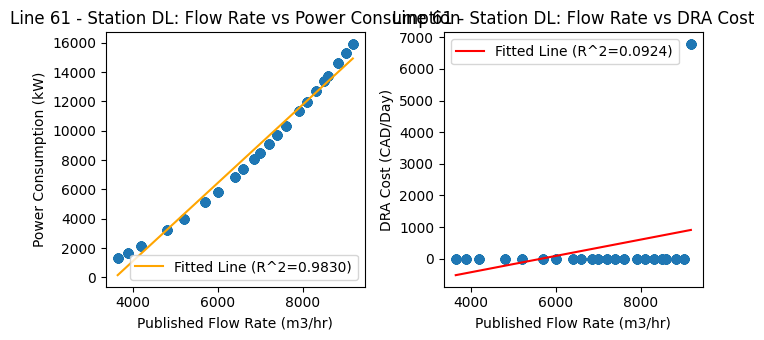

--------------------------------------------------
Line 61, VP  - Flow Rate Range: 3650 to 9175
Line 61, VP  - Power Consumption Range: 3945.946302293101 to 17729.930946883338
Line 61, VP  - DRA Cost Range: 0.0 to 5093.7528
Line 61, VP - Polynomial Coefficients for PowerConsumptionkW: [ 2.53656622e+00 -7.08974268e+03]
Line 61, VP - R^2 for PowerConsumptionkW: 0.9557
Line 61, VP - Polynomial Coefficients for DRA Cost: [ 1.94137757e-01 -1.10019785e+03]
Line 61, VP - R^2 for DRA Cost: 0.0924


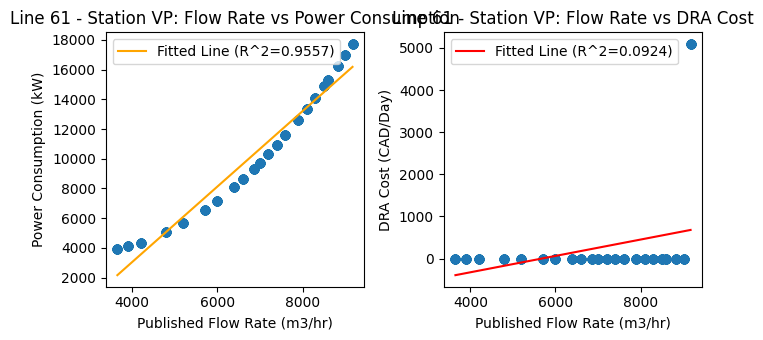

--------------------------------------------------
Line 78A, MD  - Flow Rate Range: 1900 to 4200
Line 78A, MD  - Power Consumption Range: 0.0 to 6697.425541475415
Line 78A, MD  - DRA Cost Range: nan to nan
Line 78A, MD - Polynomial Coefficients for PowerConsumptionkW: [ 2.65501512e+00 -6.12670890e+03]
Line 78A, MD - R^2 for PowerConsumptionkW: 0.8355
Line 78A, MD - Not enough unique values in DRA Cost for polynomial fitting.


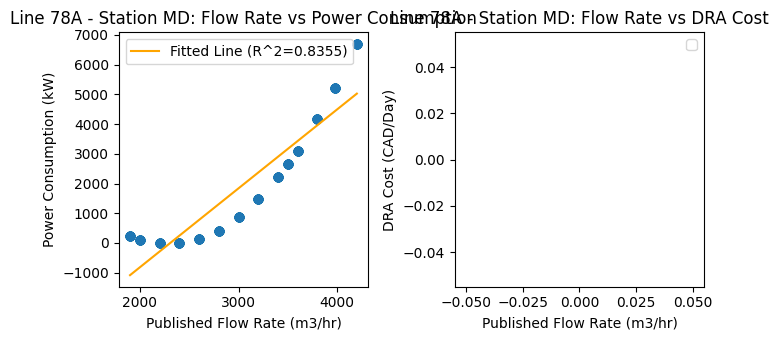

--------------------------------------------------
Line 78A, FN  - Flow Rate Range: 1900 to 4200
Line 78A, FN  - Power Consumption Range: 1453.3221488343552 to 10066.784537512807
Line 78A, FN  - DRA Cost Range: nan to nan
Line 78A, FN - Polynomial Coefficients for PowerConsumptionkW: [ 3.68418762e+00 -6.10869351e+03]
Line 78A, FN - R^2 for PowerConsumptionkW: 0.9823
Line 78A, FN - Not enough unique values in DRA Cost for polynomial fitting.


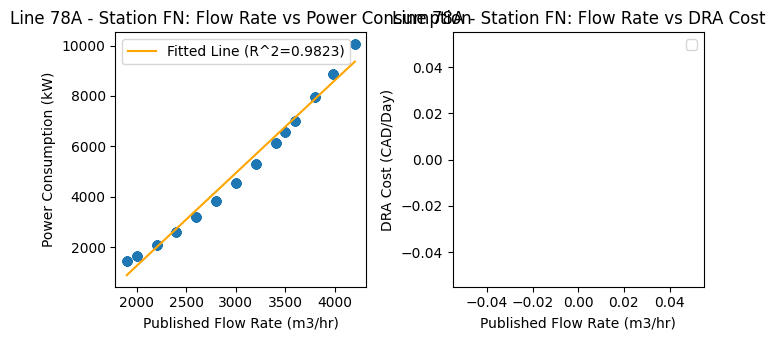

--------------------------------------------------
Line 78A, NL  - Flow Rate Range: 1900 to 4200
Line 78A, NL  - Power Consumption Range: 1567.7706224671565 to 5987.693279137835
Line 78A, NL  - DRA Cost Range: nan to nan
Line 78A, NL - Polynomial Coefficients for PowerConsumptionkW: [    1.95208419 -1860.33838823]
Line 78A, NL - R^2 for PowerConsumptionkW: 0.9842
Line 78A, NL - Not enough unique values in DRA Cost for polynomial fitting.


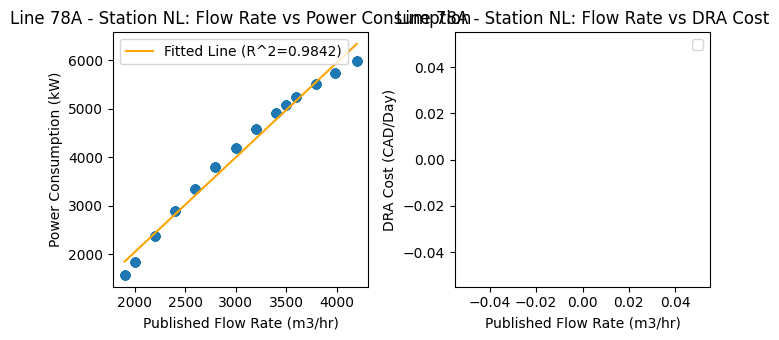

--------------------------------------------------
Line 78A, GT  - Flow Rate Range: 1900 to 4200
Line 78A, GT  - Power Consumption Range: 1519.11369750835 to 8974.265195406973
Line 78A, GT  - DRA Cost Range: nan to nan
Line 78A, GT - Polynomial Coefficients for PowerConsumptionkW: [ 3.19941511e+00 -4.94764991e+03]
Line 78A, GT - R^2 for PowerConsumptionkW: 0.9887
Line 78A, GT - Not enough unique values in DRA Cost for polynomial fitting.


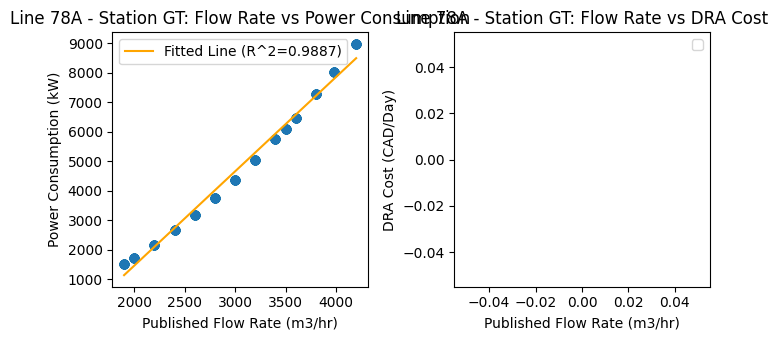

--------------------------------------------------
Line 78B, OV  - Flow Rate Range: 1900 to 4200
Line 78B, OV  - Power Consumption Range: 0.0 to 1135.6077719554305
Line 78B, OV  - DRA Cost Range: nan to nan
Line 78B, OV - Polynomial Coefficients for PowerConsumptionkW: [-8.87630506e-02  7.80863494e+02]
Line 78B, OV - R^2 for PowerConsumptionkW: 0.0208
Line 78B, OV - Not enough unique values in DRA Cost for polynomial fitting.


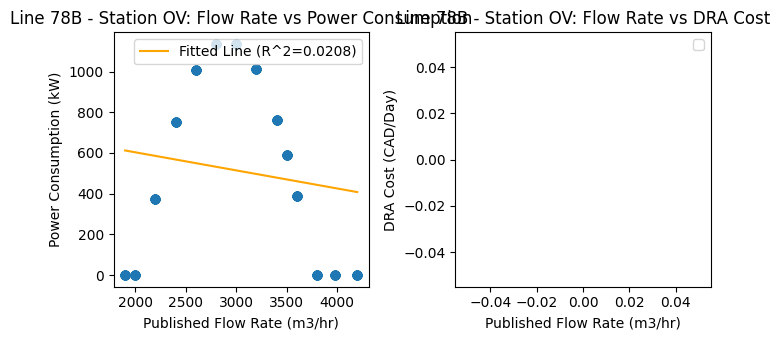

--------------------------------------------------
Line 78B, SC  - Flow Rate Range: 1900 to 4200
Line 78B, SC  - Power Consumption Range: 0.0 to 138.00069883000106
Line 78B, SC  - DRA Cost Range: nan to nan
Line 78B, SC - Polynomial Coefficients for PowerConsumptionkW: [-5.57928748e-03  8.17703991e+01]
Line 78B, SC - R^2 for PowerConsumptionkW: 0.0057
Line 78B, SC - Not enough unique values in DRA Cost for polynomial fitting.


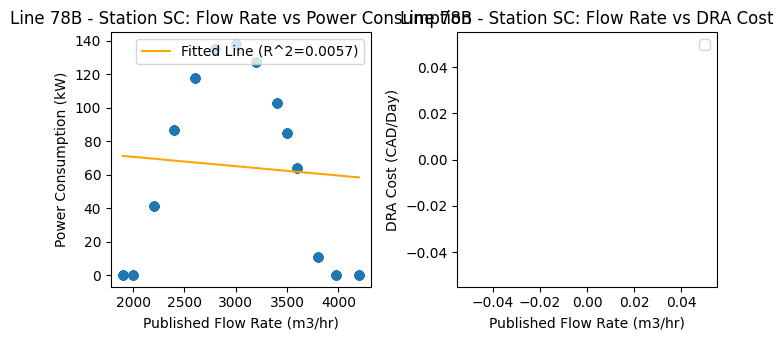

--------------------------------------------------
Line 78B, SK  - Flow Rate Range: 1900 to 4200
Line 78B, SK  - Power Consumption Range: 1217.970144815743 to 4287.270609170198
Line 78B, SK  - DRA Cost Range: nan to nan
Line 78B, SK - Polynomial Coefficients for PowerConsumptionkW: [   1.32080969 -636.43965223]
Line 78B, SK - R^2 for PowerConsumptionkW: 0.8397
Line 78B, SK - Not enough unique values in DRA Cost for polynomial fitting.


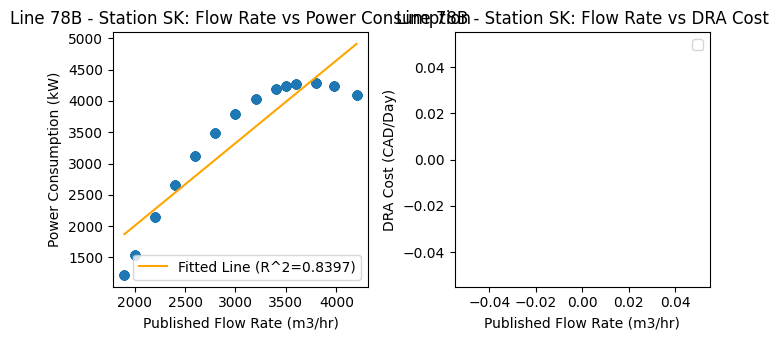

--------------------------------------------------
Line 78B, HW  - Flow Rate Range: 1900 to 4200
Line 78B, HW  - Power Consumption Range: 942.9280618205668 to 2906.8821527063847
Line 78B, HW  - DRA Cost Range: nan to nan
Line 78B, HW - Polynomial Coefficients for PowerConsumptionkW: [-2.90898442e-01  3.18317564e+03]
Line 78B, HW - R^2 for PowerConsumptionkW: 0.1409
Line 78B, HW - Not enough unique values in DRA Cost for polynomial fitting.


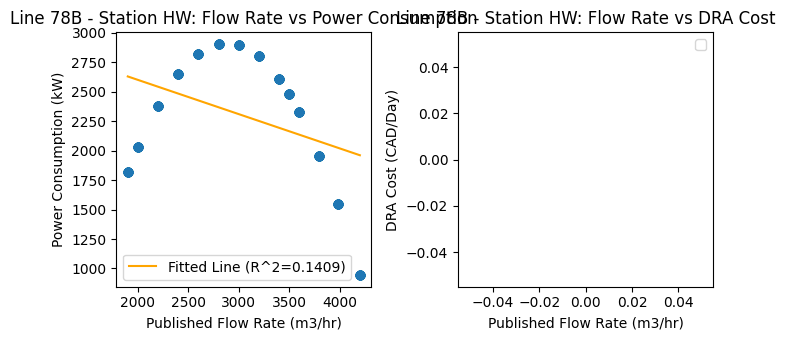

--------------------------------------------------


In [21]:
# Create a dictionary to store the filtered DataFrames for each line
from matplotlib import pyplot as plt
import numpy as np

line_dataframes = pd.DataFrame()

dropped_lines = pd.DataFrame()
# Iterate over each unique line
for line in full_cost_df['Line'].unique():
    # Filter the DataFrame for the current line
    line_df = full_cost_df[full_cost_df['Line'] == line]
    for station in line_df['Station'].unique():
        # Filter the DataFrame for the current satation
        ls_df = line_df[line_df['Station'] == station]

        # extract the min/max of the publishedFlowRatem3hr, PowerConsumptionkW, and DRACostCADPerday columns
        min_flow_rate = ls_df['publishedFlowRatem3hr'].min()  
        max_flow_rate = ls_df['publishedFlowRatem3hr'].max()
        min_power_consumption = ls_df['PowerConsumptionkW'].min()
        max_power_consumption = ls_df['PowerConsumptionkW'].max()
        min_dra_cost = ls_df['DRACostCADPerday'].min()
        max_dra_cost = ls_df['DRACostCADPerday'].max()
        print(f"Line {line}, {station}  - Flow Rate Range: {min_flow_rate} to {max_flow_rate}")
        print(f"Line {line}, {station}  - Power Consumption Range: {min_power_consumption} to {max_power_consumption}")
        print(f"Line {line}, {station}  - DRA Cost Range: {min_dra_cost} to {max_dra_cost}")

        # check that there's still at least 2 unique values in the Power Consumption column
        if ls_df['PowerConsumptionkW'].nunique() < 2: 
            print(f"Line {line}, {station} - Not enough unique values in Power Consumption for polynomial fitting.")
            z1 = ls_df['PowerConsumptionkW'].unique
            p1 = 0
            r_squared1 = 0
            # add to the dropped_lines dictionary
            dropped_lines = pd.concat([dropped_lines, pd.DataFrame({'Line': [line], 'Station': [station]})], ignore_index=True)
            continue
        else:
            # Fit the linear regression line (y = mx + c)
            # polyfit returns the coefficients [m, c]
            #coefficients = np.polyfit(ls_df['publishedFlowRatem3hr'], ls_df['PowerConsumptionkW'], 1) 
            #m = coefficients[0] # Slope of the line
            #c = coefficients[1] # Y-intercept of the line
            #print(f"Slope (m): {m}")
            #print(f"Y-intercept (c): {c}")
            z1 = np.polyfit(ls_df['publishedFlowRatem3hr'], ls_df['PowerConsumptionkW'], 1)
            p1 = np.poly1d(z1)
            # calculate the R^2 value
            y_pred = p1(ls_df['publishedFlowRatem3hr'])
            ss_res = np.sum((ls_df['PowerConsumptionkW'] - y_pred) ** 2)
            ss_tot = np.sum((ls_df['PowerConsumptionkW'] - np.mean(ls_df['PowerConsumptionkW'])) ** 2)
            r_squared1 = 1 - (ss_res / ss_tot)
            # print the coefficients of the polynomial
            print(f"Line {line}, {station} - Polynomial Coefficients for PowerConsumptionkW: {z1}")
            print(f"Line {line}, {station} - R^2 for PowerConsumptionkW: {r_squared1:.4f}")

        # fit an polynomial of order 2 to the data
        # check that there's still at least 2 unique values in the DRA Cost column
        if ls_df['DRACostCADPerday'].nunique() < 2:
            print(f"Line {line}, {station} - Not enough unique values in DRA Cost for polynomial fitting.")
            z2 = ls_df['DRACostCADPerday'].unique
            p2 = 0 
            r_squared2 = 0 
        else:
            # fit an polynomial of order 1 to the data
            z2 = np.polyfit(ls_df['publishedFlowRatem3hr'], ls_df['DRACostCADPerday'], 1)
            p2 = np.poly1d(z2)
            # calculate the R^2 value
            y_pred = p2(ls_df['publishedFlowRatem3hr'])
            ss_res = np.sum((ls_df['DRACostCADPerday'] - y_pred) ** 2)
            ss_tot = np.sum((ls_df['DRACostCADPerday'] - np.mean(ls_df['DRACostCADPerday'])) ** 2)
            r_squared2 = 1 - (ss_res / ss_tot)
            # print the coefficients of the polynomial
            print(f"Line {line}, {station} - Polynomial Coefficients for DRA Cost: {z2}")
            print(f"Line {line}, {station} - R^2 for DRA Cost: {r_squared2:.4f}")

        # Create scatter plots for each station in the line of publishedFlowRatem3hr vs PowerConsumptionkW and publishedFlowRatem3hr vs DRACostCADPerday
        # plot the polynomial line
        plt.figure(figsize=(7, 3.5))
        plt.subplot(1, 2, 1)
        plt.scatter(ls_df['publishedFlowRatem3hr'], ls_df['PowerConsumptionkW'], alpha=0.5)
        plt.title(f'Line {line} - Station {station}: Flow Rate vs Power Consumption')
        plt.xlabel('Published Flow Rate (m3/hr)')
        plt.ylabel('Power Consumption (kW)')
        if p1 != 0:
            plt.plot(sorted(ls_df['publishedFlowRatem3hr']), 
                    p1(sorted(ls_df['publishedFlowRatem3hr'])), 
                    color='orange', label=f'Fitted Line (R^2={r_squared1:.4f})')
            plt.legend()

        # plot the polynomial line
        # Create the second scatter plot for DRA Cost vs Flow Rate
        plt.subplot(1, 2, 2)
        plt.scatter(ls_df['publishedFlowRatem3hr'], ls_df['DRACostCADPerday'], alpha=0.5)
        plt.title(f'Line {line} - Station {station}: Flow Rate vs DRA Cost')
        plt.xlabel('Published Flow Rate (m3/hr)')
        plt.ylabel('DRA Cost (CAD/Day)')
        if p2 != 0:
            plt.plot(sorted(ls_df['publishedFlowRatem3hr']), 
                        p2(sorted(ls_df['publishedFlowRatem3hr'])), 
                        color='red', label=f'Fitted Line (R^2={r_squared2:.4f})') 
        
        plt.tight_layout()
        plt.legend()
        plt.show()
        #n_show += 1
        
        # Store the line_dataframes 
        ls_df_out = pd.DataFrame({
            'Line': [line],
            'Station': [station],
            'min_FlowRate': [min_flow_rate],
            'max_FlowRate': [max_flow_rate],
            'min_PowerConsumption': [min_power_consumption],
            'max_PowerConsumption': [max_power_consumption],
            'min_DRACost': [min_dra_cost],
            'max_DRACost': [max_dra_cost], 
            'PolyCoeffPowerConsumption': [z1.tolist() if isinstance(z1, np.ndarray) else 0],
            'R2PowerConsumption': [r_squared1],
            'PolyCoeffDRACost': [z2.tolist() if isinstance(z2, np.ndarray) else 0],
            'R2DRACost': [r_squared2]
        })
        line_dataframes = pd.concat([line_dataframes, ls_df_out], ignore_index=True) 
        print("--------------------------------------------------")

In [22]:
line_dataframes.head(10) # Display the first 10 rows of the line_dataframes DataFrame

,Line,Station,min_FlowRate,max_FlowRate,min_PowerConsumption,max_PowerConsumption,min_DRACost,max_DRACost,PolyCoeffPowerConsumption,R2PowerConsumption,PolyCoeffDRACost,R2DRACost
0,14,OW,1360,2730,761.439918,3232.280157,0.0,1486.6704,"[1.8648366203666877, -2107.723544222843]",0.948287,"[1.3522885950456174, -2225.584014701982]",0.868130
1,14,SH,1360,2730,89.669202,2570.215535,0.0,1140.5304,"[1.7704206894810628, -2099.7625977989037]",0.974646,"[1.0576792233110657, -1738.8206636687376]",0.868219
2,14,CB,1360,2730,910.989833,3527.955433,0.0,2352.0216,"[1.982213920270733, -2176.01581683247]",0.937545,"[1.9881276863091668, -2982.5128276156056]",0.949106
3,14,WW,1360,2730,605.865959,3443.736592,0.0,2178.9504,"[2.0781550942365845, -2550.005593044673]",0.950960,"[1.875255469834421, -2828.3823170076157]",0.948936
4,14,MN,1360,2730,685.877837,2538.734240,0.0,1509.7464,"[1.3446024019038005, -1100.1556461253317]",0.998284,"[1.335056866730782, -2039.8239287359274]",0.946361
5,14,AM,1360,2730,548.647912,3449.243446,0.0,2144.3376,"[2.1680829959379344, -2676.2035102522095]",0.972981,"[1.8400087941566372, -2788.0461487146167]",0.951414
6,14,VP,1360,2730,45.716736,2571.092628,0.0,1844.3496,"[1.8005893060549842, -2170.8733889704254]",0.972341,"[1.608007872943253, -2435.7986670686973]",0.946197
7,14,EG,1360,2730,843.327680,3375.756496,0.0,1509.7464,"[1.8624071841052618, -1933.372007500245]",0.967371,"[1.3794700673234372, -2228.339572727506]",0.889237
8,14,PR,1360,2730,2049.779344,6719.190730,0.0,0.0000,"[3.4386273942185626, -3019.2497412620787]",0.975543,0,0.000000
9,14,RI,1360,2730,99.887268,2462.767509,0.0,1809.7344,"[1.6762211828204059, -1916.2853473126568]",0.959452,"[1.559759422941956, -2359.9229766213502]",0.946020


In [23]:
dropped_lines

,Line,Station
0,5,NaN


In [24]:
# save as csv file
line_dataframes.to_csv('./prep_data/modeling_cost_df.csv', index=False)